In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
%matplotlib inline
import matplotlib.pyplot as plt

import sys 
import inspect
import seaborn as sns
import os
import copy

import perturbseq as perturb

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis')
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.1 umap==0.4.4 numpy==1.17.2 scipy==1.4.1 pandas==0.24.2 scikit-learn==0.22 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.8.1


In [2]:
PROTEIN='TP53'
DATA='/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2020-02-14'
SUBSAMPLED=DATA+'/'+PROTEIN+'/subsampled/A549.'+PROTEIN

FIGS=DATA+'/2021-03-22_Figures/'
os.system('mkdir -p '+FIGS)
print(FIGS)

sc.settings.figdir=FIGS

/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2020-02-14/2021-03-22_Figures/


In [3]:
ANNO=DATA+'/'+PROTEIN+'/anno'
anno=pd.read_csv(ANNO+'/'+PROTEIN+'.anno.complete3.csv',sep='\t',index_col=0)
anno=anno.loc[anno['Library_synthesis']=='in',:]

sorted_variants_df=pd.read_csv(DATA+'/'+PROTEIN+'/clustering/'+PROTEIN+'.corrL1.sorted_variants_2021-03-23.csv',header=None)
sorted_variants_df.index=sorted_variants_df[0]
sorted_variants=list(sorted_variants_df[0])
print(sorted_variants)

print(anno.columns)


['P359P', 'T170T', 'D21D', 'A83V', 'P295P', 'P153P', 'E2E', 'P47P', 'R158R', 'T118T', 'Q5R', 'G360V', 'V31I', 'P36P', 'P58R', 'P301P', 'L344L', 'P47S', 'P222P', 'T312S', 'WT', 'E339K', 'Y107H', 'S366A', 'V216V', 'R337C', 'R337L', 'unassigned', 'R280K', 'C277F', 'R213Q', 'P152L', 'S241C', 'R273H', 'R273L', 'R273C', 'K132R', 'R158H', 'M246V', 'M237I', 'V272L', 'C242F', 'E271K', 'Y205C', 'G154V', 'Y234C', 'Y220C', 'G266E', 'Y236C', 'R280T', 'R158L', 'R248W', 'C238F', 'Y163C', 'G266V', 'A159V', 'E285K', 'G105C', 'G245C', 'H179R', 'K132N', 'S241F', 'R248L', 'V272M', 'H193R', 'G245S', 'P250L', 'P278L', 'C141Y', 'A159P', 'G244C', 'E286K', 'S127F', 'C238Y', 'V216M', 'V173L', 'V157F', 'C176Y', 'C176F', 'H214R', 'H193Y', 'R110L', 'C135Y', 'R249S', 'R282W', 'L194R', 'G266R', 'R249M', 'G245V', 'C275Y', 'H179Y', 'P151S', 'R175H', 'C135F', 'I195T', 'P278S', 'V173M', 'G245D', 'C275F', 'H193L']
Index(['Variant.1', 'Variant.1.1', 'Position', 'From', 'To', 'mutation_type',
       'Count_pancan', 'Count_

In [4]:
#read in Giacomelli data

f='/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2019-06-07/TP53/mutational_signatures/TP53_mutationalSignatures_Giacomelli.txt'
mutsig=pd.read_csv(f,sep='\t',skiprows=1)
mutsig.index=mutsig['Allele']
print(mutsig.head())
print(mutsig.columns)

#modify the names for the synonymous ones
import re
new_vars=[]
for i in range(mutsig.shape[0]):
    v=mutsig.index[i]
    new_var_here=v
    if 'B' in v:
        new_var_here=re.sub('B',v[0],v)
    new_vars.append(new_var_here)
mutsig.index=new_vars


       Allele AA_wt AA_variant  Position  A549_p53WT_Nutlin-3_Z-score  \
Allele                                                                  
R175H   R175H     R          H       175                     1.791388   
R248Q   R248Q     R          Q       248                     1.233480   
R273H   R273H     R          H       273                     1.145501   
R248W   R248W     R          W       248                     1.552718   
R273C   R273C     R          C       273                     1.261347   

        A549_p53NULL_Nutlin-3_Z-score  A549_p53NULL_Etoposide_Z-score  \
Allele                                                                  
R175H                        0.538396                       -0.744765   
R248Q                        0.217053                       -0.985385   
R273H                        1.077844                       -1.438387   
R248W                        0.613931                       -0.689231   
R273C                        0.314304             

In [5]:
#check which of our variants are in the Giacomelli dataset
overlapping=set(mutsig.index).intersection(set(anno.index))
print('variants in Giacomelli',len(overlapping))
print(overlapping)
missed=set(anno.index).difference(set(mutsig.index))
print('variants not in Giacomelli',len(missed))
print(missed)

variants in Giacomelli 98
{'R248W', 'G245D', 'C242F', 'R280K', 'R273C', 'R248L', 'P301P', 'G154V', 'P151S', 'C135F', 'V216V', 'E339K', 'E285K', 'P278S', 'K132R', 'M246V', 'E286K', 'S127F', 'Y107H', 'C277F', 'C275F', 'L194R', 'A83V', 'S241C', 'H179Y', 'E271K', 'G245S', 'P250L', 'R337C', 'R280T', 'D21D', 'G244C', 'E2E', 'H193Y', 'A159P', 'G360V', 'C176Y', 'C275Y', 'C238Y', 'C176F', 'P58R', 'A159V', 'R282W', 'T170T', 'V31I', 'V157F', 'Q5R', 'R158L', 'G266R', 'T312S', 'P47S', 'V173L', 'H214R', 'T118T', 'R337L', 'H193R', 'R249M', 'P47P', 'R249S', 'P278L', 'I195T', 'V216M', 'R110L', 'V173M', 'S366A', 'P36P', 'R158H', 'G245V', 'R175H', 'Y234C', 'Y205C', 'L344L', 'P222P', 'V272L', 'Y236C', 'C135Y', 'P152L', 'Y220C', 'Y163C', 'C141Y', 'G105C', 'M237I', 'P153P', 'R273H', 'S241F', 'P359P', 'R273L', 'K132N', 'G266V', 'P295P', 'C238F', 'G245C', 'R158R', 'G266E', 'R213Q', 'V272M', 'H193L', 'H179R'}
variants not in Giacomelli 1
{'WT'}


In [6]:
def fun_scatter(x,y,xname='x',yname='y',width=4,height=4,corrtype='spearman',
                xlim=None,ylim=None,
                **kwargs):
    from scipy.stats import spearmanr, pearsonr
    if corrtype=='spearman':
        corr=spearmanr(x,y,nan_policy='omit')
    if corrtype=='pearson':
        corr=pearsonr(x,y)
    c,p="%.2g" % corr[0],"%.3g" % corr[1]
    fig,plots=plt.subplots(1)
    fig.set_size_inches(width,height)
    plots.scatter(x,y,**kwargs)
    plots.set_xlabel(xname)
    plots.set_ylabel(yname)
    if xlim!=None:
        plots.set_xlim(xlim)
    if ylim!=None:
        plots.set_ylim(ylim)
    plots.set_title(corrtype+':'+str(c)+'\n'+'p:'+str(p))
    


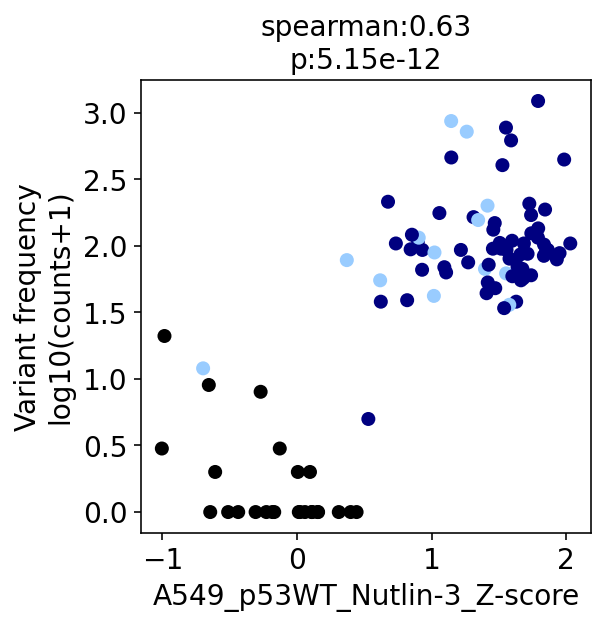

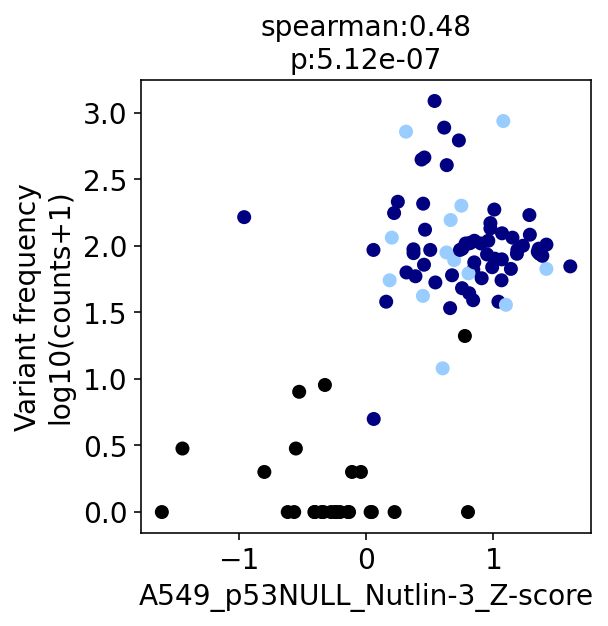

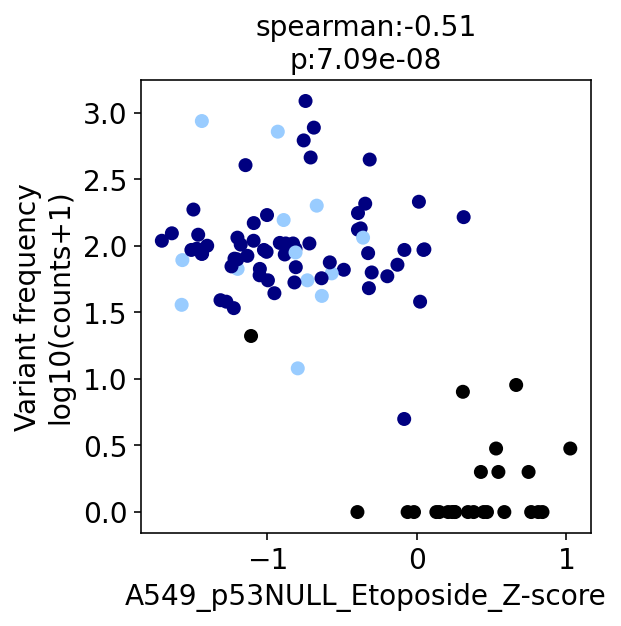

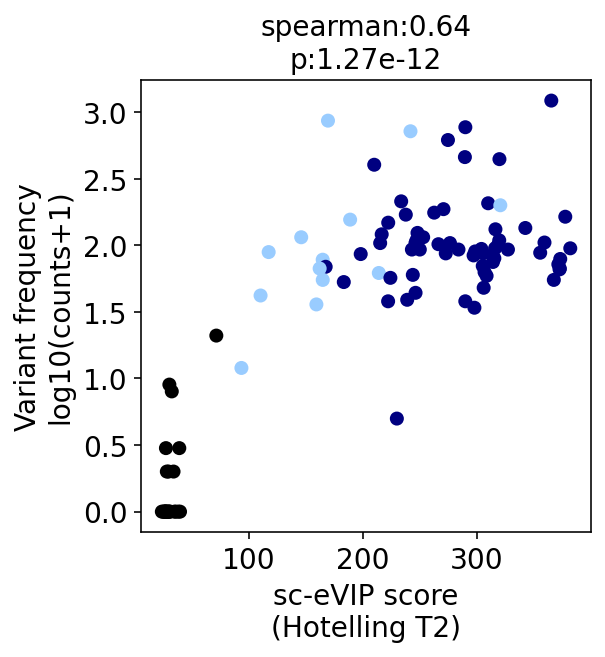

In [7]:
for f1 in ['A549_p53WT_Nutlin-3_Z-score',
           'A549_p53NULL_Nutlin-3_Z-score',
           'A549_p53NULL_Etoposide_Z-score',
           'HotellingT2']:
    mutcount='IARC_Mutation_Counts'
    fun_scatter(anno.loc[overlapping,f1],
                np.log10(mutsig.loc[overlapping,mutcount]+1),
               color=anno.loc[overlapping,'cluster_color'],
                xname=f1,yname='log counts',corrtype='spearman')
    plt.grid(False)
    plt.ylabel('Variant frequency\nlog10(counts+1)')
    if f1=='HotellingT2':
        plt.xlabel('sc-eVIP score\n(Hotelling T2)')
    
    plt.savefig(FIGS+'/'+PROTEIN+'.'+f1+'_vs_mutfreq.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.'+f1+'_vs_mutfreq.png',bbox_inches = "tight")
    plt.show()

In [8]:
#restrict to variants with features. excludes synonymous variants
f='/ahg/regevdata/projects/bn10_cancer_variants/bn10_oana_2018-06-22/results/2018-06-22/results/2019-06-07/TP53/mutational_signatures/TP53_mutationalSignatures_Giacomelli.txt'
mutsig_init=pd.read_csv(f,sep='\t',skiprows=1)
mutsig_init=mutsig_init.iloc[:,:41]
mutsig_restricted=mutsig_init.dropna(axis='index')####### remove items without mutational signatures
mutsig_restricted.index=mutsig_restricted['Allele']

print(mutsig_restricted.head())
print(mutsig_restricted.shape)


       Allele AA_wt AA_variant  Position  A549_p53WT_Nutlin-3_Z-score  \
Allele                                                                  
R175H   R175H     R          H       175                     1.791388   
R248Q   R248Q     R          Q       248                     1.233480   
R273H   R273H     R          H       273                     1.145501   
R248W   R248W     R          W       248                     1.552718   
R273C   R273C     R          C       273                     1.261347   

        A549_p53NULL_Nutlin-3_Z-score  A549_p53NULL_Etoposide_Z-score  \
Allele                                                                  
R175H                        0.538396                       -0.744765   
R248Q                        0.217053                       -0.985385   
R273H                        1.077844                       -1.438387   
R248W                        0.613931                       -0.689231   
R273C                        0.314304             

In [9]:
len(sorted_variants)

100

       IARC_Mutation_Counts  effect size cluster_color color_mutant_freq
T170T                   0.0    23.551053         black         lightgray
R158R                   0.0    24.664666         black         lightgray
P359P                   0.0    25.465183         black         lightgray
P301P                   0.0    26.051759         black         lightgray
D21D                    0.0    26.840234         black         lightgray
(98, 4)


/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


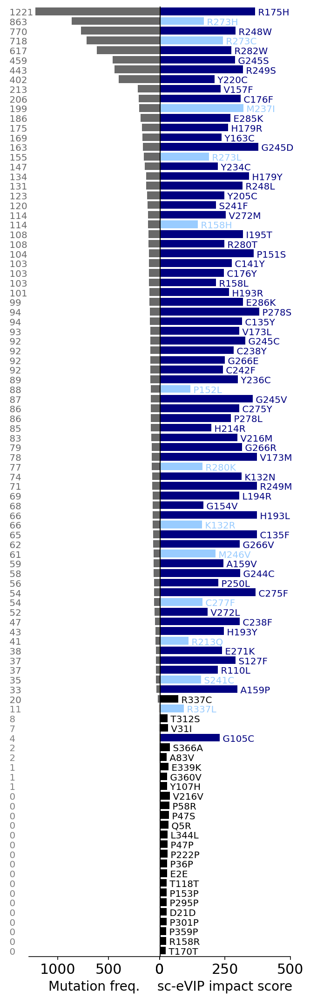

In [10]:
#effect size vs mut freq

#plot impact score vs mutation frequency

mutcount='IARC_Mutation_Counts'

#- get the data
score='HotellingT2'
mutdata=pd.DataFrame({mutcount:mutsig.loc[sorted_variants,mutcount],
                     'effect size':anno.loc[sorted_variants,score],
                     'cluster_color':anno.loc[sorted_variants,'cluster_color']},
                    index=sorted_variants)
mutdata=mutdata.dropna(subset=[mutcount])
mutdata=mutdata.sort_values(by=[mutcount,'effect size'])
mutdata[mutcount]=pd.DataFrame(mutdata[mutcount],dtype=float)
mutdata['color_mutant_freq']='lightgray'
mutdata.loc[mutdata[mutcount]>=20,'color_mutant_freq']='dimgray'
print(mutdata.head())
print(mutdata.shape)

#- make the plot
multiply_impact_score=1

fig,plots=plt.subplots(1,2)
fig.set_size_inches(5,18)
fig.subplots_adjust(wspace=0, hspace=0)

plots[1].barh(mutdata.index,
           mutdata['effect size']*multiply_impact_score,
           color=mutdata['cluster_color'])

plots[0].barh(mutdata.index,
           mutdata[mutcount],
          color=mutdata['color_mutant_freq'])
#plots[0].set_xscale('log')
plots[0].invert_xaxis()


plots[1].axvline(x=0,color='black')
for i in range(2):
    plots[i].set_ylim(-0.6,mutdata.shape[0]-0.5)
    plots[i].spines['right'].set_visible(False)
    plots[i].spines['left'].set_visible(False)
    plots[i].spines['top'].set_visible(False)
    plots[i].set_yticks([])
    

#annotate the number of mutations and the variants
n=mutdata.shape[0]
for i in range(n):
    variant=list(mutdata.index)[i]
    effect_size=list(mutdata['effect size'])[i]
    effect_size_plot=multiply_impact_score*effect_size
    effect_size_color=list(mutdata['cluster_color'])[i]
    mutfreq=int(list(mutdata[mutcount])[i])
    mutfreq_plot=mutfreq
    mutfreq_color=list(mutdata['color_mutant_freq'])[i]
    if mutfreq_color=='lightgray':
        mutfreq_color='gray'
    
    plots[0].text(1500,i-0.4,' '+str(int(mutfreq)),
                 color=mutfreq_color,fontsize=10)
    
    variant_text=' '+variant
    if anno.loc[variant,'mutation_type']=='Multiple':
        variant_text=variant_text+' (multi)'
    plots[1].text(effect_size_plot,i-0.4,variant_text,
                 color=effect_size_color,fontsize=10)

plots[1].set_xticks([0,250,500])
plots[1].set_xticklabels([0,int(250.0/multiply_impact_score),
                          int(500.0/multiply_impact_score)],fontsize=15)
plots[0].tick_params(axis='x', labelsize=15)
plots[0].set_xlabel('Mutation freq.')
plots[1].set_xlabel('sc-eVIP impact score')
plots[0].grid(False)
plots[1].grid(False)



plt.savefig(FIGS+'/'+PROTEIN+'.EffectSize_vs_mutfreq.pdf',bbox_inches = "tight") 
plt.savefig(FIGS+'/'+PROTEIN+'.EffectSize_vs_mutfreq.png',bbox_inches = "tight")
plt.show()

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


       Mutational_Signatures_Model  effect size cluster_color  IARC  \
T170T                          0.0    23.551053         black   0.0   
R158R                          0.0    24.664666         black   0.0   
P359P                          0.0    25.465183         black   0.0   
P301P                          0.0    26.051759         black   0.0   
D21D                           0.0    26.840234         black   0.0   

      color_mutant_freq  
T170T         lightgray  
R158R         lightgray  
P359P         lightgray  
P301P         lightgray  
D21D          lightgray  
(98, 5)


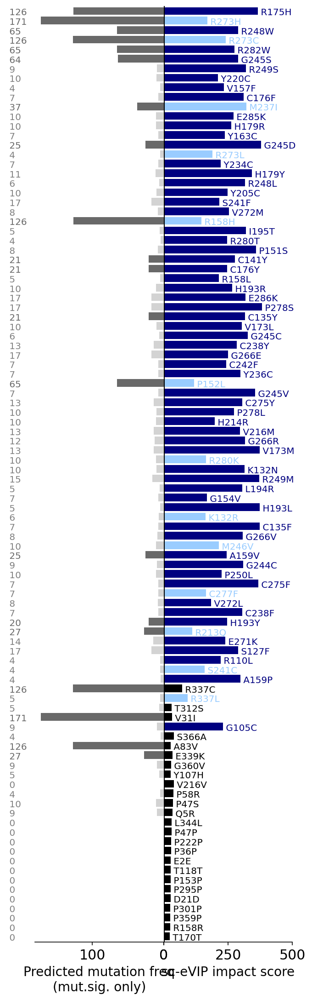

In [11]:
#effect size vs mut freq

#plot impact score vs mutation frequency

mutcount='Mutational_Signatures_Model'

#- get the data
score='HotellingT2'
mutdata=pd.DataFrame({mutcount:mutsig.loc[sorted_variants,mutcount],
                     'effect size':anno.loc[sorted_variants,score],
                     'cluster_color':anno.loc[sorted_variants,'cluster_color'],
                     'IARC':mutsig.loc[sorted_variants,'IARC_Mutation_Counts']},
                    index=sorted_variants)
mutdata=mutdata.dropna(subset=['IARC'])
mutdata=mutdata.fillna(0)
mutdata=mutdata.sort_values(by=['IARC','effect size'])
mutdata[mutcount]=pd.DataFrame(mutdata[mutcount],dtype=float)
mutdata['color_mutant_freq']='lightgray'
mutdata.loc[mutdata[mutcount]>=20,'color_mutant_freq']='dimgray'
print(mutdata.head())
print(mutdata.shape)

#- make the plot
multiply_impact_score=1

fig,plots=plt.subplots(1,2)
fig.set_size_inches(5,18)
fig.subplots_adjust(wspace=0, hspace=0)

plots[1].barh(mutdata.index,
           mutdata['effect size']*multiply_impact_score,
           color=mutdata['cluster_color'])

plots[0].barh(mutdata.index,
           mutdata[mutcount],
          color=mutdata['color_mutant_freq'])
#plots[0].set_xscale('log')
plots[0].invert_xaxis()


plots[1].axvline(x=0,color='black')
for i in range(2):
    plots[i].set_ylim(-0.6,mutdata.shape[0]-0.5)
    plots[i].spines['right'].set_visible(False)
    plots[i].spines['left'].set_visible(False)
    plots[i].spines['top'].set_visible(False)
    plots[i].set_yticks([])
    

#annotate the number of mutations and the variants
n=mutdata.shape[0]
for i in range(n):
    variant=list(mutdata.index)[i]
    effect_size=list(mutdata['effect size'])[i]
    effect_size_plot=multiply_impact_score*effect_size
    effect_size_color=list(mutdata['cluster_color'])[i]
    mutfreq=int(list(mutdata[mutcount])[i])
    mutfreq_plot=mutfreq
    mutfreq_color=list(mutdata['color_mutant_freq'])[i]
    if mutfreq_color=='lightgray':
        mutfreq_color='gray'
    
    plots[0].text(220,i-0.4,' '+str(int(mutfreq)),
                 color=mutfreq_color,fontsize=10)
    
    variant_text=' '+variant
    if anno.loc[variant,'mutation_type']=='Multiple':
        variant_text=variant_text+' (multi)'
    plots[1].text(effect_size_plot,i-0.4,variant_text,
                 color=effect_size_color,fontsize=10)

plots[1].set_xticks([0,250,500])
plots[1].set_xticklabels([0,int(250.0/multiply_impact_score),
                          int(500.0/multiply_impact_score)],fontsize=15)
plots[0].tick_params(axis='x', labelsize=15)
plots[0].set_xlabel('Predicted mutation freq\n(mut.sig. only)')
plots[1].set_xlabel('sc-eVIP impact score')
plots[0].grid(False)
plots[1].grid(False)



plt.savefig(FIGS+'/'+PROTEIN+'.EffectSize_vs_mutfreq.mutSigOnly.pdf',bbox_inches = "tight") 
plt.savefig(FIGS+'/'+PROTEIN+'.EffectSize_vs_mutfreq.mutSigOnly.png',bbox_inches = "tight")
plt.show()

Data for the model
===

Keep only variants with mutational signatures annotated. That removed the synonymous variants.

In [12]:
#define data
data=pd.DataFrame(mutsig_restricted)
# need to add HotellingT2
data['HotellingT2']=anno.loc[data.index,'HotellingT2']

#check which of our variants are in the Giacomelli dataset
overlapping=set(mutsig_restricted.index).intersection(set(anno.index))
print('variants in Giacomelli',len(overlapping))
print(overlapping)
missed=set(anno.index).difference(set(mutsig_restricted.index))
print('variants not in Giacomelli',len(missed))
print(missed)

data['has_effsize']=False
data.loc[list(overlapping),'has_effsize']=True

print('Data',data.columns)

variants in Giacomelli 84
{'T312S', 'R248W', 'S241C', 'H179Y', 'C135Y', 'P47S', 'E271K', 'G245S', 'V173L', 'P152L', 'Y220C', 'Y163C', 'C141Y', 'P250L', 'G105C', 'R337C', 'G245D', 'R280T', 'C242F', 'H214R', 'M237I', 'R280K', 'G244C', 'R273C', 'R273H', 'R248L', 'H193Y', 'S241F', 'R337L', 'A159P', 'H193R', 'G360V', 'Y107H', 'R249M', 'R273L', 'C176Y', 'C275Y', 'C238Y', 'C176F', 'R249S', 'P278L', 'K132N', 'G154V', 'P151S', 'C135F', 'G266V', 'I195T', 'P58R', 'C238F', 'G245C', 'A159V', 'V216M', 'R110L', 'V173M', 'S366A', 'R158H', 'G245V', 'G266E', 'R282W', 'R175H', 'Y234C', 'E339K', 'Y205C', 'V31I', 'R213Q', 'E285K', 'P278S', 'V157F', 'Q5R', 'R158L', 'K132R', 'V272L', 'M246V', 'H179R', 'Y236C', 'G266R', 'V272M', 'E286K', 'S127F', 'H193L', 'C277F', 'C275F', 'L194R', 'A83V'}
variants not in Giacomelli 15
{'P222P', 'T118T', 'V216V', 'P295P', 'P359P', 'P36P', 'R158R', 'P47P', 'WT', 'T170T', 'L344L', 'D21D', 'P153P', 'P301P', 'E2E'}
Data Index(['Allele', 'AA_wt', 'AA_variant', 'Position',
       '

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


In [20]:
#===================================================================================

signature_cols=['Signature_1',
       'Signature_5',
       'Signature_2',
       'Signature_4',
       'Signature_6',
       'Signature_7',
       'Signature_13',
       'Signature_24',]
signature_cols=['Signature_1', 'Signature_2', 'Signature_3',
       #'Signature_4', 
                'Signature_4*','Signature_5', 'Signature_6', 'Signature_7',
       'Signature_8', 'Signature_9', 'Signature_10', 'Signature_11',
       'Signature_12', 'Signature_13', 'Signature_14', 'Signature_15',
       'Signature_16', 'Signature_17', 'Signature_18', 'Signature_19',
       'Signature_20', 'Signature_21', 'Signature_22', 'Signature_23',
       'Signature_24', 'Signature_25', 'Signature_26', 'Signature_27',
       'Signature_28', 'Signature_29', 'Signature_30']
impact_cols=['HotellingT2']
pheno_cols=['A549_p53WT_Nutlin-3_Z-score', 
       'A549_p53NULL_Nutlin-3_Z-score',
       'A549_p53NULL_Etoposide_Z-score']
yname='IARC_Mutation_Counts'

#record model performances here
performances=pd.DataFrame(columns=['condition','pearson','spearman','r2','fold'])

Recapitulate Giacomelli results
===

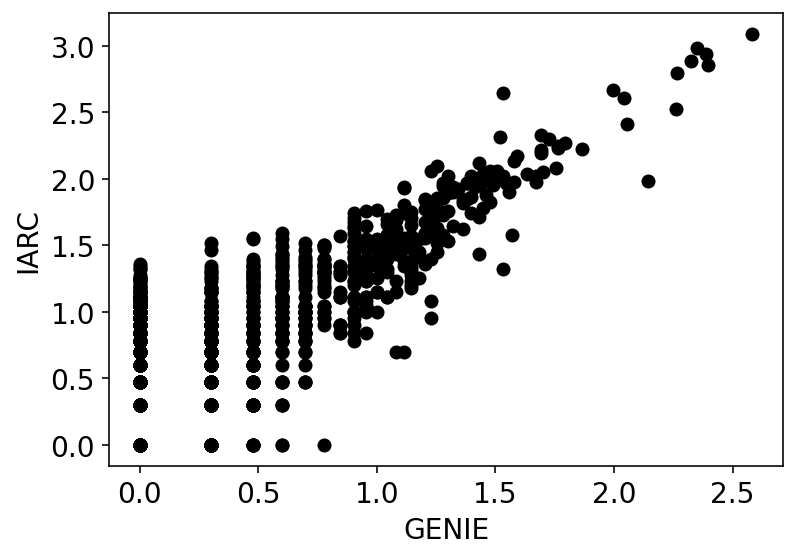

In [21]:
#check out concordance between GENIE and IARC
plt.scatter(np.log10(1+data['GENIE_Mutation_Counts']),
            np.log10(1+data['IARC_Mutation_Counts']),
            color='black')
plt.xlabel('GENIE')
plt.ylabel('IARC')
plt.grid(False)
plt.show()

In [22]:
def get_positions_train_valid(data_pos,rng):
    
    positions=list(set(data_pos))
    train_positions=rng.choice(positions,size=int(len(positions)/2),replace=False)
    
    train_col=[]
    for j in range(len(data_pos)):
        curr_pos=data_pos[j]
        if curr_pos in train_positions:
            train_col.append(True)
        else:
            train_col.append(False)
    return(train_col)

def get_train_valid_datasets(data_here,
                            features,
                            training_pos_col,valid_pos_col,
                         training_y_name,valid_y_name,
                            offset_col=None):
    
    #subset data
    d={}
    d['x_train']=data_here.loc[data_here[training_pos_col]==True,features]
    d['y_train']=data_here.loc[data_here[training_pos_col]==True,training_y_name]
    d['x_valid']=data_here.loc[data_here[valid_pos_col]==True,features]
    d['y_valid']=data_here.loc[data_here[valid_pos_col]==True,valid_y_name]
    if offset_col is not None:
        d['offset_train']=data_here.loc[data_here[training_pos_col]==True,offset_col]
        d['offset_valid']=data_here.loc[data_here[valid_pos_col]==True,offset_col]
    return(d)


def get_model(d):
    import statsmodels.api as sm
    
    #train the model
    if 'offset_train' in d.keys():
        glm_binom=sm.GLM(d['y_train'], d['x_train'],family=sm.families.Poisson(),
                        offset=d['offset_train'])
    else:
        glm_binom = sm.GLM(d['y_train'], d['x_train'],family=sm.families.Poisson())
    res=glm_binom.fit_regularized()
    #res=glm_binom.fit()
    return(res)

def get_pred_by_position(y_here,data_with_position):
    df=pd.DataFrame(y_here,index=y_here.index)
    df['posi']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('posi').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)

def model_performance_by_position(y_true_train,y_true_valid,y_train_pred,y_valid_pred,data_with_position,ax1,ax2):
    y_true_train_pos=get_pred_by_position(y_true_train,data_with_position)
    ax1.plot(y_true_train_pos['pos'],y_true_train_pos.iloc[:,0],color='gray')
    
    y_true_valid_pos=get_pred_by_position(y_true_valid,data_with_position)
    ax2.plot(y_true_valid_pos['pos'],y_true_valid_pos.iloc[:,0],color='black')
    
    y_train_pos=get_pred_by_position(y_train_pred,data_with_position)
    ax1.plot(y_train_pos['pos'],-y_train_pos.iloc[:,0],color='deepskyblue')
    
    y_valid_pos=get_pred_by_position(y_valid_pred,data_with_position)
    ax2.plot(y_valid_pos['pos'],-y_valid_pos.iloc[:,0],color='blue')
    
    ax1.grid(False)
    ax2.grid(False)
    
def model_performance(x,y,model_res,toprint,ax,mycolor,log_it=True):
    #should return the predictions
    y_pred=model_res.predict(x)
    y2=y
    y2_pred=y_pred
    
    pred_df=pd.DataFrame({'obs':y,
                         'pred':y_pred})
    if log_it:
        y2=np.log10(y+1)
        y2_pred=np.log10(y_pred+1)
    
    from scipy.stats import spearmanr,pearsonr
    from sklearn.metrics import r2_score
    p=pearsonr(y2,y2_pred)[0]
    p=str(int(100*p)/100)
    r2=r2_score(y2,y2_pred)
    r2=str(int(100*r2)/100)
    sp=spearmanr(y2,y2_pred)[0]
    sp=str(int(100*sp)/100)
    
    return(y_pred,p,sp,r2,pred_df)

def model_full(data_here,
               features,
                training_pos_col,valid_pos_col,
                training_y_name,valid_y_name,
                offset_col=None,
              toprint=''):
    
    import copy
    
    fig,plots=plt.subplots(1,5)
    fig.set_size_inches(25,3)
    
    
    d_here={}
    
    #setup dataset, training, test
    d_here['data']=get_train_valid_datasets(data_here,
                features,
                training_pos_col,valid_pos_col,
                training_y_name,valid_y_name,
                offset_col)
    
    #train the model
    d_here['model']=get_model(d_here['data'])
    
    #get the model performance, for the training and validation sets
    d_here['pred_train'],p_train,sp_train,r2_train,y_train_pred=model_performance(d_here['data']['x_train'],
                                     d_here['data']['y_train'],
                                     d_here['model'],
                                   'training',
                                    plots[0],'lightblue')
    
    d_here['pred_valid'],p_valid,sp_valid,r2_valid,y_valid_pred=model_performance(d_here['data']['x_valid'],
                                     d_here['data']['y_valid'],
                                     d_here['model'],
                                   toprint+'\ntrain: '+str(d_here['data']['x_train'].shape[0])+
                                            ', test: '+str(d_here['data']['x_valid'].shape[0])+'\nvalidation',
                                    plots[1],'blue')
    
    #make a prediction with the model on the entire dataset
    data_here_cp=copy.deepcopy(data_here)
    data_here_cp['all']=True
    totals={}
    totals['data']=get_train_valid_datasets(data_here_cp,
                features,
                'all','all',
                training_y_name,valid_y_name,
                offset_col)
    
    #######
    '''
    data_here_cp[toprint],p_total,sp_total,r2_total,y_total_pred=model_performance(totals['data']['x_valid'],
                                     totals['data']['y_valid'],
                                     d_here['model'],
                                   'all data',
                                    plots[2],'purple')
    '''
    
    model_performance_by_position(d_here['data']['y_train'],
                                  d_here['data']['y_valid'],
                                  y_train_pred,
                                  y_valid_pred,
                                  data_here,
                                  plots[3],plots[4])
    
    performance_here=pd.DataFrame({'condition':toprint,
                                  'pearson':p_valid,
                                  'spearman':sp_valid,
                                  'r2':r2_valid},index=[0])
    plt.show()
    
    to_return={}
    #to_return['dataset']=data_here_cp
    to_return['model']=d_here['model']
    to_return['obs_train']=d_here['data']['y_train']
    to_return['obs_valid']=d_here['data']['y_valid']
    to_return['pred_train']=d_here['pred_train']
    to_return['pred_valid']=d_here['pred_valid']
    to_return['obs_all']=totals['data']['y_valid']
    #to_return['pred_all']=data_here_cp[toprint]
    return(to_return,p_valid,sp_valid,r2_valid,performance_here)

def plot_performance(preds,titlename='',mini=-0.5,maxi=5):
    fig,ax=plt.subplots(1)
    fig.set_size_inches(2,2)
    
    for item in ['train','valid']:
        if item=='train':
            c='lightgray'
        if item=='valid':
            c='black'
        ax.scatter(np.log10(preds['pred_'+item]+1),
            np.log10(preds['obs_'+item].loc[preds['pred_'+item].index]+1),s=5,color=c,
                          alpha=0.5)

        ###ax.set_xlim(mini,maxi)
        ###ax.set_ylim(mini,maxi)        
        ###ax.set_xticks([])
        
        ax.set_yticks([0,maxi/2,maxi])
        ax.set_ylabel('observed counts\n(log10(counts+1))')
        ax.set_ylabel('')
        ax.grid(False)
        
    ax.set_xticks([0,maxi/2,maxi])
    ax.set_xlabel('predicted counts\n(log10(counts+1))')
    ax.set_title(titlename)
    ax.set_ylabel('observed counts\nlog10(counts+1)')
    return(ax)


phenoMut_traintestAllvariants ['Signature_27', 'Signature_17', 'Signature_16', 'Signature_1', 'Signature_9', 'Signature_2', 'Signature_6', 'Signature_30', 'A549_p53NULL_Etoposide_Z-score', 'Signature_18', 'A549_p53NULL_Nutlin-3_Z-score', 'Signature_13', 'Signature_11', 'Signature_22', 'Signature_26', 'Signature_19', 'Signature_20', 'Signature_12', 'Signature_14', 'Signature_28', 'Signature_21', 'Signature_25', 'Signature_7', 'A549_p53WT_Nutlin-3_Z-score', 'Signature_3', 'Signature_8', 'Signature_29', 'Signature_4*', 'Signature_24', 'Signature_15', 'Signature_5', 'Signature_10', 'Signature_23']


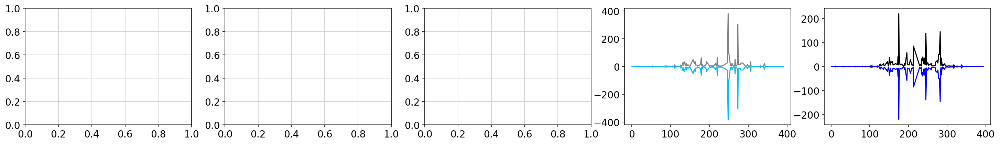

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:38: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



In [23]:
#record model performances here
performances=pd.DataFrame(columns=['condition','fold','pearson','spearman','r2'])

for i in range(1):
    #define train, validation sets
    #==============================
    #randomize train/test - by position
    foldname='fold'+str(i)
    rng=np.random.RandomState(1234)
    data[foldname]=get_positions_train_valid(copy.deepcopy(data['Position']),rng)
    
    data[foldname+'not']=(data[foldname]==False)
    
    #train each model of interest
    #============================
    model2features={}
    model2features['phenoMut_traintestAllvariants']=list(set(pheno_cols).union(set(signature_cols)))

    model2train={}
    model2train['phenoMut_traintestAllvariants']=foldname

    model2valid={}
    model2valid['phenoMut_traintestAllvariants']=foldname+'not'

    for model_name in model2features.keys(): 
        
        features=model2features[model_name]
        print(model_name,features)
        output=model_full(data,
                    features,
                    training_pos_col=model2train[model_name],
                    valid_pos_col=model2valid[model_name],
                    training_y_name=yname,
                    valid_y_name=yname,
                  toprint=model_name)
        performance_current=output[4]
        performance_current['fold']=foldname
        performances=pd.concat([performances,performance_current],axis=0)
        


In [24]:
model=output[0]['model']
dir(model)
model.params

model.save('TP53model.mutsig')

In [25]:
model.params

Signature_27                       0.728535
Signature_17                      -2.007626
Signature_16                      46.980838
Signature_1                        9.605506
Signature_9                        6.794481
Signature_2                        0.984115
Signature_6                       38.862583
Signature_30                      -5.039973
A549_p53NULL_Etoposide_Z-score    -0.885343
Signature_18                     -16.872994
A549_p53NULL_Nutlin-3_Z-score      0.221847
Signature_13                       3.596078
Signature_11                       2.130542
Signature_22                       0.906550
Signature_26                     -30.729923
Signature_19                     -18.782310
Signature_20                     -15.521072
Signature_12                      31.875297
Signature_14                       3.512513
Signature_28                      -5.621410
Signature_21                       9.625218
Signature_25                      -3.955912
Signature_7                     

In [33]:
mutsig.shape

(8258, 46)

In [35]:
corr=perturb.util.corr_mat(mutsig.loc[:,signature_cols].T.fillna(0),corr_type='pearson')

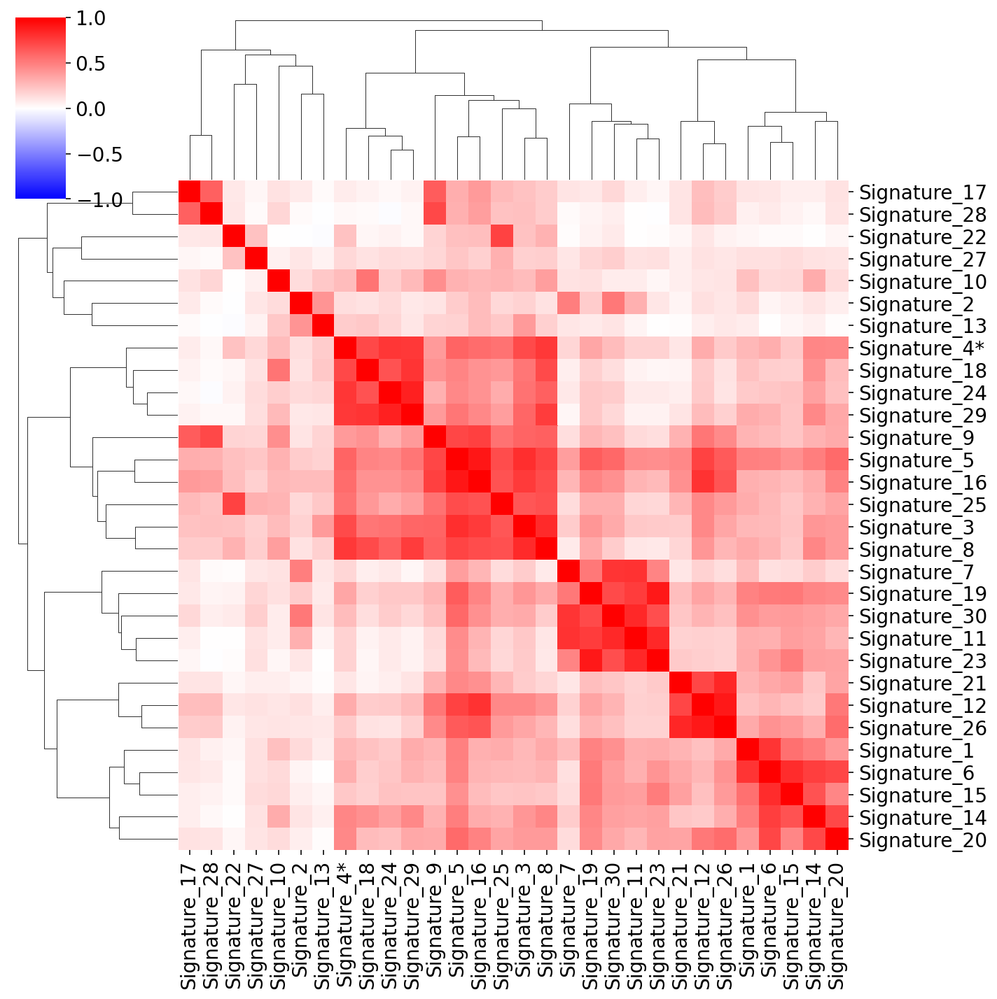

In [38]:
sns.clustermap(corr,
               cmap='bwr',vmin=-1,vmax=1,
               xticklabels=True,yticklabels=True,
              )

In [19]:
#make data with 0-ed func data
#predict => from mutational 

def predict_from_mutational(data,features,func_data,mymodel):
    mut_data=data.loc[:,features]
    for c in func_data:
        mut_data[c]=0
    #now, predict
    mut_preds=mymodel.predict(mut_data)
    return(mut_preds)

mut_preds=predict_from_mutational(data,model2features['phenoMut_traintestAllvariants'],pheno_cols,model)

In [20]:
mutsig['mut.pred']=0
mutsig.loc[mut_preds.index,'mut.pred']=mut_preds

In [21]:
mutsig.columns

Index(['Allele', 'AA_wt', 'AA_variant', 'Position',
       'A549_p53WT_Nutlin-3_Z-score', 'A549_p53NULL_Nutlin-3_Z-score',
       'A549_p53NULL_Etoposide_Z-score', 'Signature_1', 'Signature_2',
       'Signature_3', 'Signature_4', 'Signature_4*', 'Signature_5',
       'Signature_6', 'Signature_7', 'Signature_8', 'Signature_9',
       'Signature_10', 'Signature_11', 'Signature_12', 'Signature_13',
       'Signature_14', 'Signature_15', 'Signature_16', 'Signature_17',
       'Signature_18', 'Signature_19', 'Signature_20', 'Signature_21',
       'Signature_22', 'Signature_23', 'Signature_24', 'Signature_25',
       'Signature_26', 'Signature_27', 'Signature_28', 'Signature_29',
       'Signature_30', 'IARC_Mutation_Counts', 'GENIE_Mutation_Counts',
       'Phenotypic_Selection_Model', 'Mutational_Signatures_Model',
       'Combined_Model', 'Unnamed: 43', 'Unnamed: 44', 'Unnamed: 45',
       'mut.pred'],
      dtype='object')

In [22]:
anno.loc['unassigned','cluster_color']='slateblue'

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  from ipykernel import kernelapp as app


(0.8214814049001418, 100)

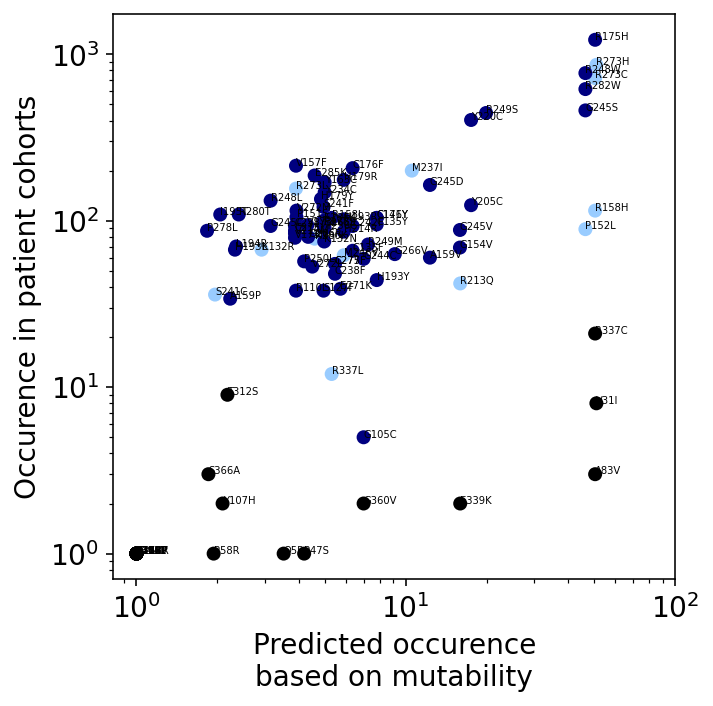

In [23]:
anno.loc['unassigned','cluster_color']='slateblue'
fig,plots=plt.subplots()
fig.set_size_inches(5,5)
plots.scatter(mutsig.loc[sorted_variants,'mut.pred']+1,
           mutsig.loc[sorted_variants,'IARC_Mutation_Counts']+1,
           c=anno.loc[sorted_variants,'cluster_color'])
plots.set_xlabel('Predicted occurence\nbased on mutability')
plots.set_ylabel('Occurence in patient cohorts')
plots.grid(False)
for i, txt in enumerate(sorted_variants):
        plots.annotate(txt, (mutsig.loc[sorted_variants,'mut.pred'][i]+1, 
                             mutsig.loc[sorted_variants,'IARC_Mutation_Counts'][i]+1),fontsize=5)
plots.set_yscale('log')
plots.set_xscale('log')
plots.set_xlim(0,100)

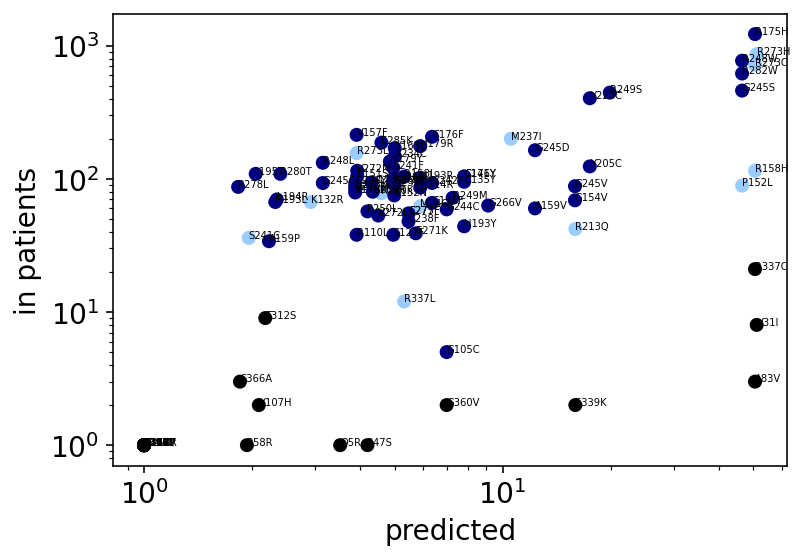

In [24]:
plt.scatter(mutsig.loc[sorted_variants,'mut.pred']+1,
           mutsig.loc[sorted_variants,'IARC_Mutation_Counts']+1,
           c=anno.loc[sorted_variants,'cluster_color'])
plt.xlabel('predicted')
plt.ylabel('in patients')
plt.grid(False)
for i, txt in enumerate(sorted_variants):
        plt.annotate(txt, (mutsig.loc[sorted_variants,'mut.pred'][i]+1, 
                             mutsig.loc[sorted_variants,'IARC_Mutation_Counts'][i]+1),fontsize=5)
plt.yscale('log')
plt.xscale('log')

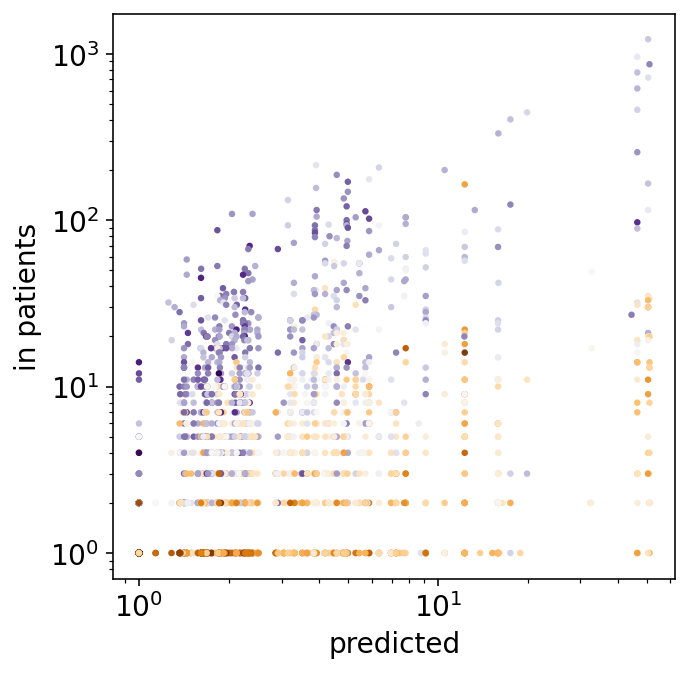

In [25]:
fig,plots=plt.subplots()
fig.set_size_inches(5,5)

plots.scatter(mutsig.loc[:,'mut.pred']+1,
           mutsig.loc[:,'IARC_Mutation_Counts']+1,
           c=mutsig.loc[:,'A549_p53NULL_Nutlin-3_Z-score'],cmap='PuOr',vmin=-2,vmax=2,
           s=5)
plots.set_xlabel('predicted')
plots.set_ylabel('in patients')
plots.grid(False)
#for i, txt in enumerate(mutsig.index):
#        plt.annotate(txt, (mutsig.loc[:,'mut.pred'][i]+1, 
#                             mutsig.loc[:,'IARC_Mutation_Counts'][i]+1),fontsize=5)
plots.set_yscale('log')
plots.set_xscale('log')

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


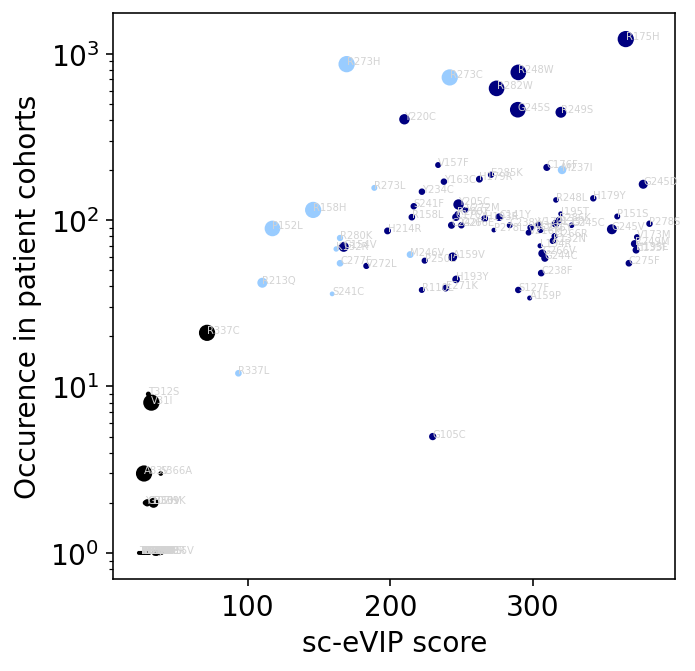

In [31]:
anno.loc['unassigned','cluster_color']='slateblue'
fig,plots=plt.subplots()
fig.set_size_inches(5,5)
plots.scatter(anno.loc[sorted_variants,'HotellingT2'],
           mutsig.loc[sorted_variants,'IARC_Mutation_Counts']+1,
           s=mutsig.loc[sorted_variants,'mut.pred']+1,
              c=anno.loc[sorted_variants,'cluster_color'],
              vmax=20,cmap='viridis')
plots.set_xlabel('sc-eVIP score')
plots.set_ylabel('Occurence in patient cohorts')
plots.grid(False)
for i, txt in enumerate(sorted_variants):
        plots.annotate(txt, (anno.loc[sorted_variants,'HotellingT2'][i], 
                             mutsig.loc[sorted_variants,'IARC_Mutation_Counts'][i]+1),
                       fontsize=5,color='lightgray')
plots.set_yscale('log')
#plots.set_xscale('log')
plt.savefig(FIGS+'/'+PROTEIN+'.EffectSize_vs_mutfreq.pdf',bbox_inches = "tight") 
plt.savefig(FIGS+'/'+PROTEIN+'.EffectSize_vs_mutfreq.png',bbox_inches = "tight")


       mut.pred  effect size cluster_color  IARC color_mutant_freq
T170T       0.0    23.551053         black   0.0         lightgray
R158R       0.0    24.664666         black   0.0         lightgray
P359P       0.0    25.465183         black   0.0         lightgray
P301P       0.0    26.051759         black   0.0         lightgray
D21D        0.0    26.840234         black   0.0         lightgray
(98, 5)


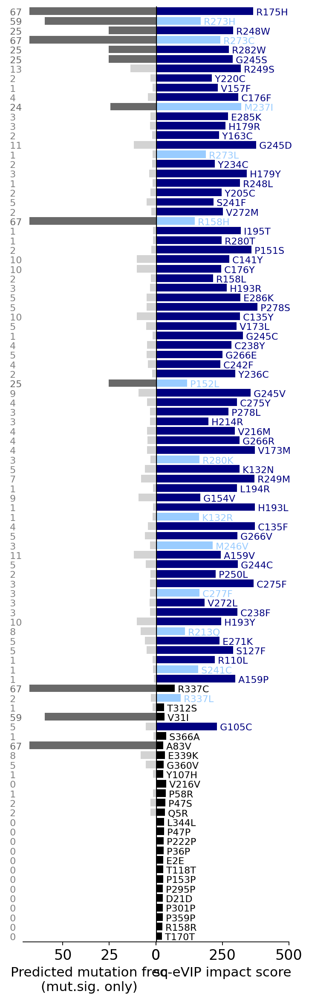

In [122]:
#effect size vs mut freq

#plot impact score vs mutation frequency

mutcount='mut.pred'

#- get the data
score='HotellingT2'
mutdata=pd.DataFrame({mutcount:mutsig.loc[sorted_variants,mutcount],
                     'effect size':anno.loc[sorted_variants,score],
                     'cluster_color':anno.loc[sorted_variants,'cluster_color'],
                     'IARC':mutsig.loc[sorted_variants,'IARC_Mutation_Counts']},
                    index=sorted_variants)
mutdata=mutdata.dropna(subset=['IARC'])
mutdata=mutdata.fillna(0)
mutdata=mutdata.sort_values(by=['IARC','effect size'])
mutdata[mutcount]=pd.DataFrame(mutdata[mutcount],dtype=float)
mutdata['color_mutant_freq']='lightgray'
mutdata.loc[mutdata[mutcount]>=20,'color_mutant_freq']='dimgray'
print(mutdata.head())
print(mutdata.shape)

#- make the plot
multiply_impact_score=1

fig,plots=plt.subplots(1,2)
fig.set_size_inches(5,18)
fig.subplots_adjust(wspace=0, hspace=0)

plots[1].barh(mutdata.index,
           mutdata['effect size']*multiply_impact_score,
           color=mutdata['cluster_color'])

plots[0].barh(mutdata.index,
           mutdata[mutcount],
          color=mutdata['color_mutant_freq'])
#plots[0].set_xscale('log')
plots[0].invert_xaxis()


plots[1].axvline(x=0,color='black')
for i in range(2):
    plots[i].set_ylim(-0.6,mutdata.shape[0]-0.5)
    plots[i].spines['right'].set_visible(False)
    plots[i].spines['left'].set_visible(False)
    plots[i].spines['top'].set_visible(False)
    plots[i].set_yticks([])
    

#annotate the number of mutations and the variants
n=mutdata.shape[0]
for i in range(n):
    variant=list(mutdata.index)[i]
    effect_size=list(mutdata['effect size'])[i]
    effect_size_plot=multiply_impact_score*effect_size
    effect_size_color=list(mutdata['cluster_color'])[i]
    mutfreq=int(list(mutdata[mutcount])[i])
    mutfreq_plot=mutfreq
    mutfreq_color=list(mutdata['color_mutant_freq'])[i]
    if mutfreq_color=='lightgray':
        mutfreq_color='gray'
    
    plots[0].text(80,i-0.4,' '+str(int(mutfreq)),
                 color=mutfreq_color,fontsize=10)
    
    variant_text=' '+variant
    if anno.loc[variant,'mutation_type']=='Multiple':
        variant_text=variant_text+' (multi)'
    plots[1].text(effect_size_plot,i-0.4,variant_text,
                 color=effect_size_color,fontsize=10)

plots[1].set_xticks([0,250,500])
plots[1].set_xticklabels([0,int(250.0/multiply_impact_score),
                          int(500.0/multiply_impact_score)],fontsize=15)
plots[0].tick_params(axis='x', labelsize=15)
plots[0].set_xlabel('Predicted mutation freq\n(mut.sig. only)')
plots[1].set_xlabel('sc-eVIP impact score')
plots[0].grid(False)
plots[1].grid(False)



plt.show()

In [126]:
#make 1 of each plot

def plot_performance(preds,titlename='',mini=-0.5,maxi=5):
    fig,ax=plt.subplots(1)
    fig.set_size_inches(2,2)
    
    for item in ['train','valid']:
        if item=='train':
            c='lightgray'
        if item=='valid':
            c='black'
        ax.scatter(np.log10(preds['pred_'+item]+1),
            np.log10(preds['obs_'+item].loc[preds['pred_'+item].index]+1),s=5,color=c,
                          alpha=0.5)

        ###ax.set_xlim(mini,maxi)
        ###ax.set_ylim(mini,maxi)        
        ###ax.set_xticks([])
        
        ax.set_yticks([0,maxi/2,maxi])
        ax.set_ylabel('observed counts\n(log10(counts+1))')
        ax.set_ylabel('')
        ax.grid(False)
        
    ax.set_xticks([0,maxi/2,maxi])
    ax.set_xlabel('predicted counts\n(log10(counts+1))')
    ax.set_title(titlename)
    ax.set_ylabel('observed counts\nlog10(counts+1)')
    return(ax)

def get_pred_by_position(y_here,data_with_position):
    df=pd.DataFrame(y_here,index=y_here.index)
    df['posi']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('posi').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)


    
def avg_by_position(named_scores,data_with_position):
    
    df=pd.DataFrame(named_scores,index=named_scores.index)
    df['position']=data_with_position.loc[df.index,'Position']
    #collapse to average
    pos_scores=df.groupby('position').mean()
    pos_scores['pos']=pos_scores.index
    pos_scores=pos_scores.sort_values(by='pos')
    return(pos_scores)
    
    


=============== iteration 0


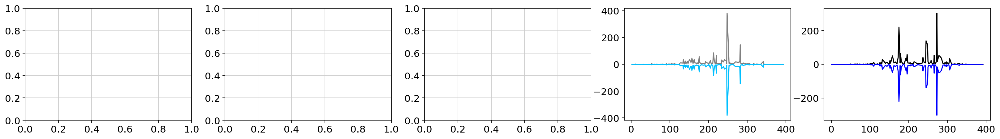

model name Cell. + 
 Mut. + 
 sc-eVIP - 
Train L 
 Test L
mut pred === Allele
R175H     8.496146
R248Q    58.530098
R273H    72.945245
R248W    58.530098
R273C     8.496146
R282W    58.530098
G245S    58.530098
R249S     7.725797
Y220C    10.636962
R213Z    34.449103
R196Z    58.530098
V157F     1.894033
C176F    12.446553
M237I    10.558246
E285K     3.910483
H179R     3.236024
Y163C     4.882098
R306Z     8.496146
G245D     6.248483
R273L     1.894033
Y234C     4.882098
H179Y     4.670075
R248L     2.120247
Y205C    10.636962
S241F     4.085377
W146Z    42.390583
R158H     8.496146
V272M     2.645075
Q192Z     6.444157
I195T     1.386585
           ...    
T387I     1.541784
T387K     8.269484
T387R     0.828114
T387S     0.995428
E388D     0.576103
E388G     1.491202
E388K     3.910483
E388V     1.203761
E388Z     4.233928
G389E     9.077067
G389R     2.474466
G389V     2.754376
P390A     1.049279
P390H     4.718964
P390L     2.474466
P390R     0.975951
P390S     6.248483
P390T     

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:150: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


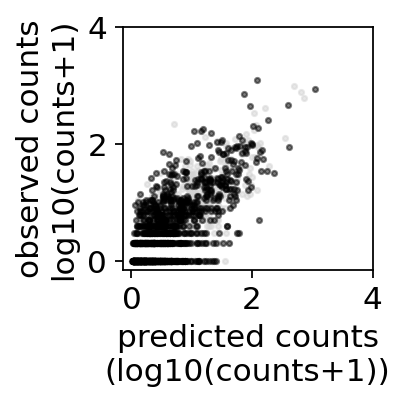

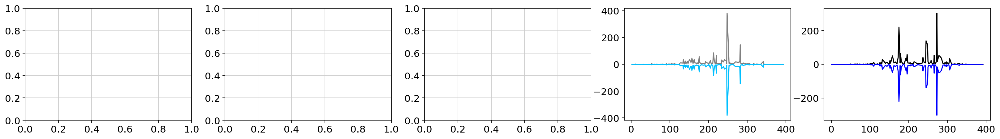

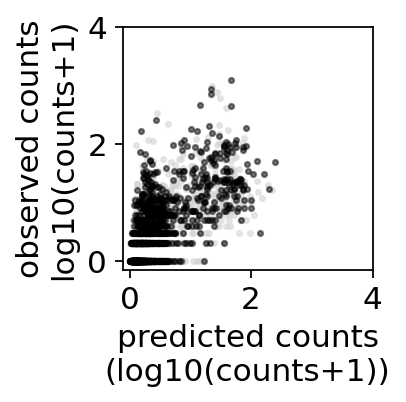

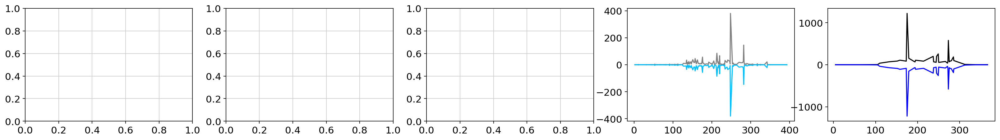

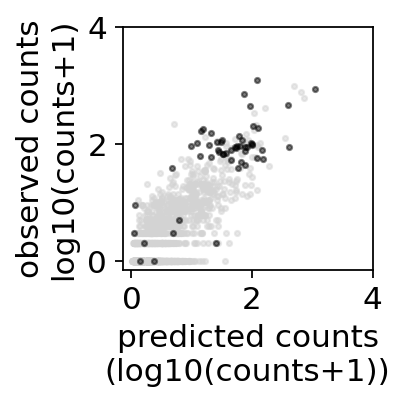

...

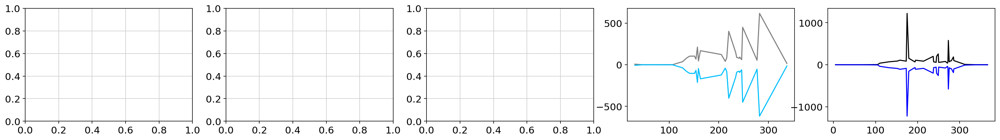

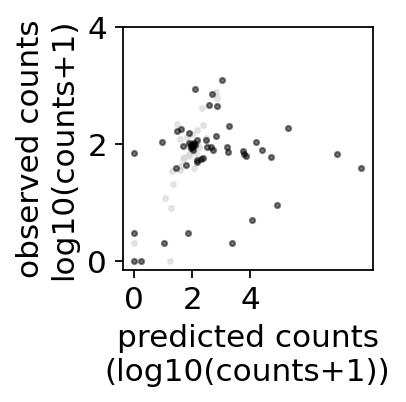

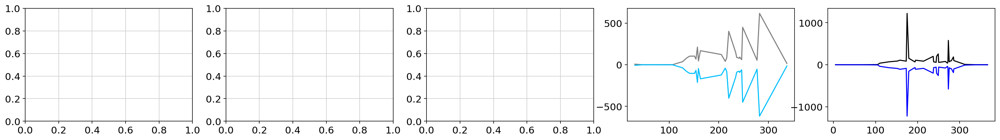

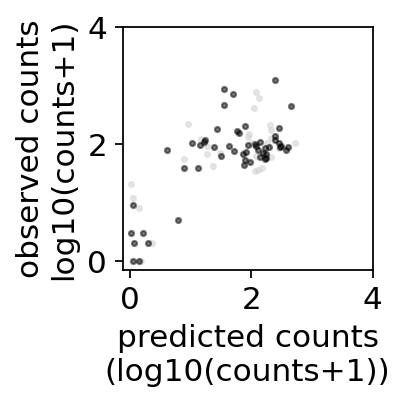

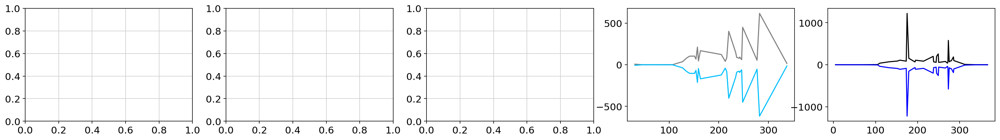

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


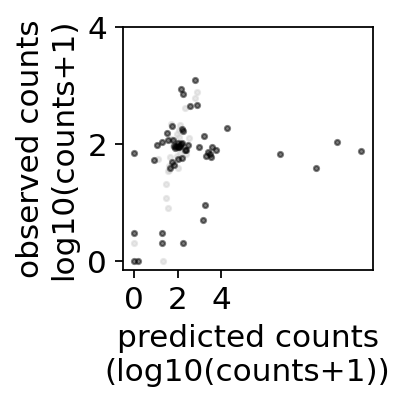

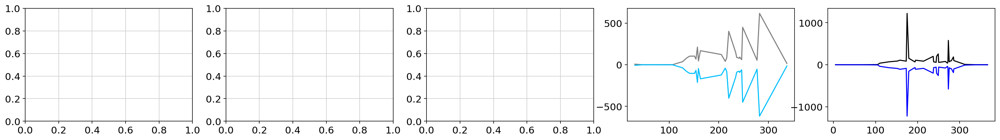

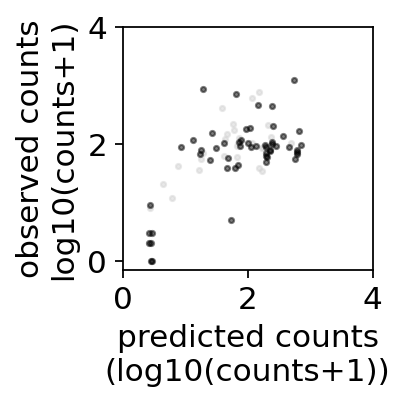

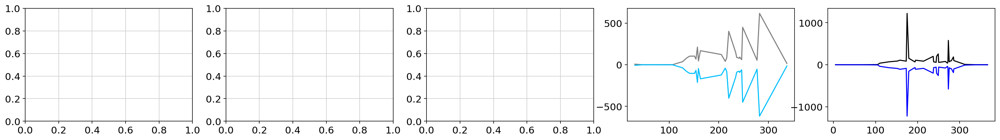

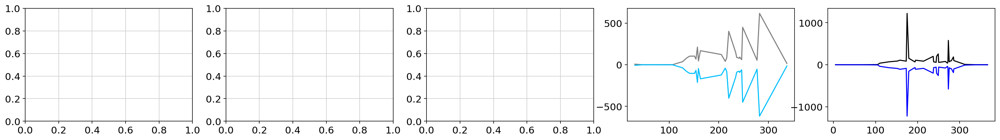

R248W    147
R282W     65
Y220C    402
V157F    103
C176F     94
Name: 0, dtype: int64
R175H     86
R273H    101
R273C     92
G245S    108
R249S      1
Name: 0, dtype: int64
R175H     3
R248Q    23
R273H     5
R248W     6
R273C     5
Name: 0, dtype: int64
=============== iteration 1


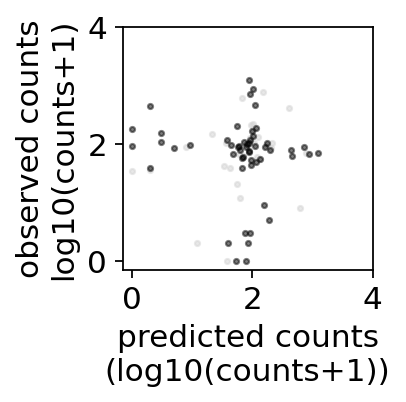

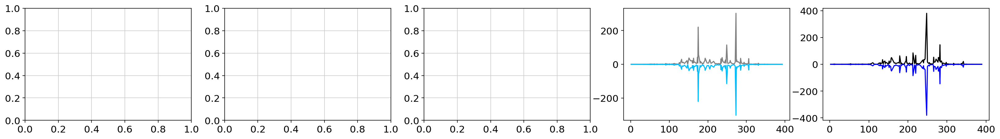

model name Cell. + 
 Mut. + 
 sc-eVIP - 
Train L 
 Test L
mut pred === Allele
R175H    79.902729
R248Q     4.509451
R273H    56.104428
R248W     4.509451
R273C    79.902729
R282W     4.509451
G245S     4.509451
R249S    15.289499
Y220C     4.406754
R213Z     4.252693
R196Z     4.509451
V157F     2.157412
C176F     4.924536
M237I    14.125726
E285K     5.587605
H179R     2.782944
Y163C     3.948689
R306Z    79.902729
G245D     6.013094
R273L     2.157412
Y234C     3.948689
H179Y     4.673550
R248L     1.335923
Y205C     4.406754
S241F     4.164758
W146Z    31.261083
R158H    79.902729
V272M     6.471549
Q192Z     5.765388
I195T     2.599914
           ...    
T387I     3.369059
T387K     4.634949
T387R     0.904601
T387S     0.925965
E388D     0.796955
E388G     2.071926
E388K     5.587605
E388V     1.809867
E388Z     4.307063
G389E     6.688938
G389R     4.548893
G389V     4.249334
P390A     1.063760
P390H     3.593755
P390L     4.548893
P390R     0.967329
P390S     6.013094
P390T    1

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:150: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


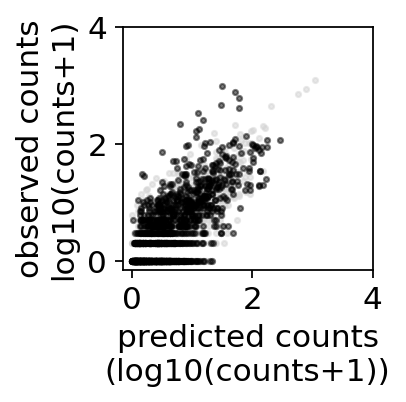

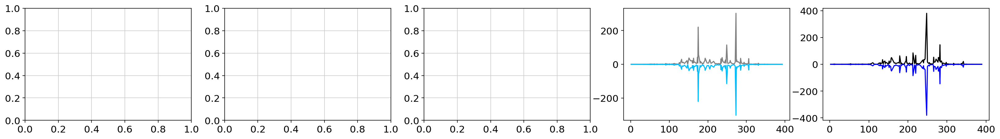

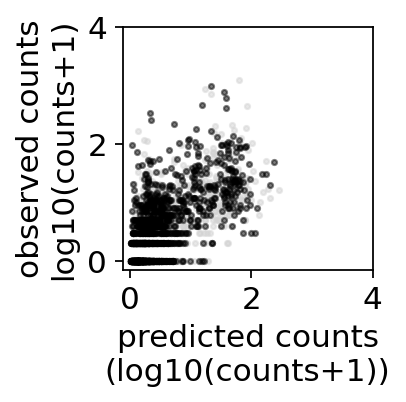

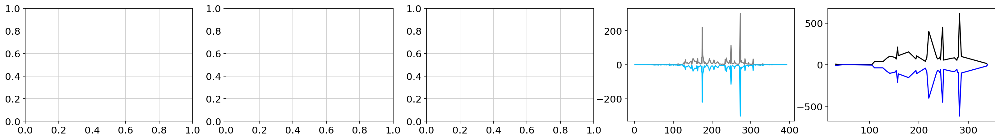

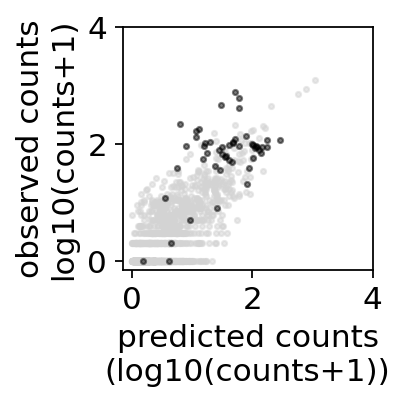

...

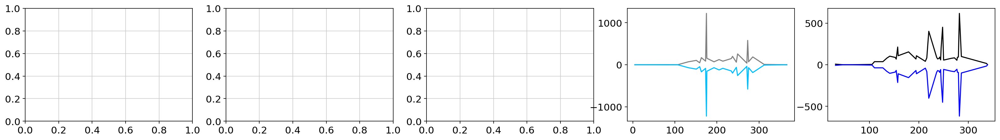

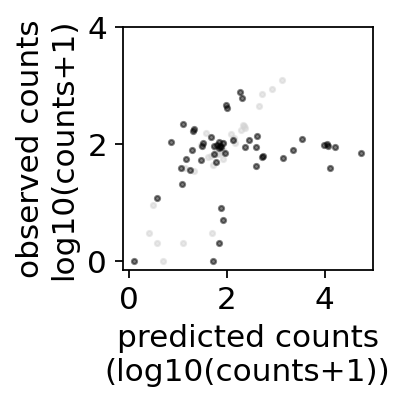

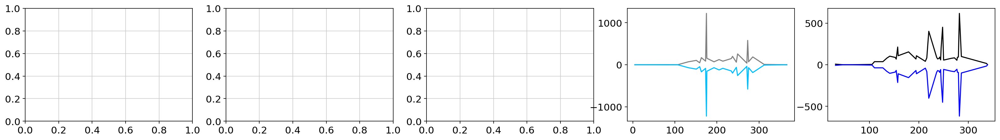

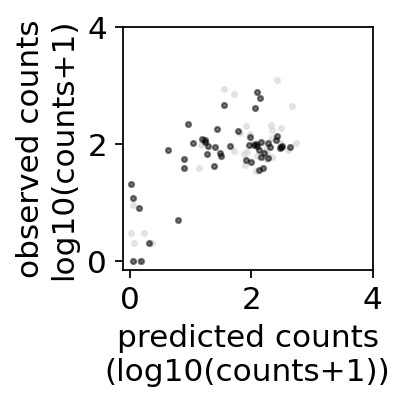

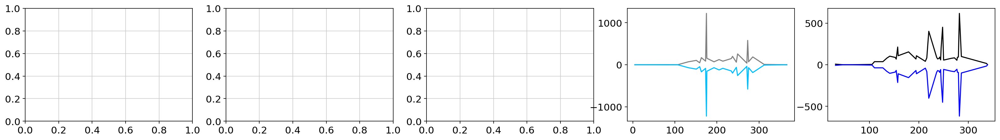

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


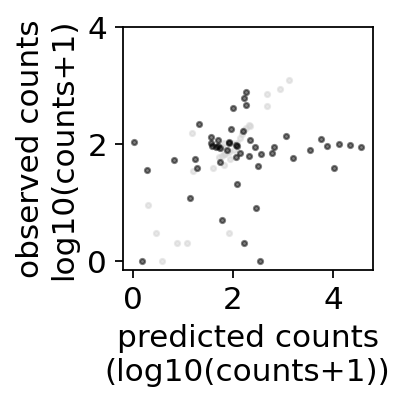

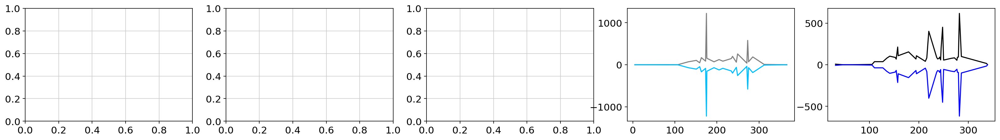

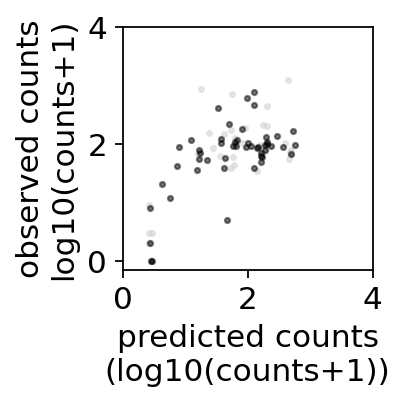

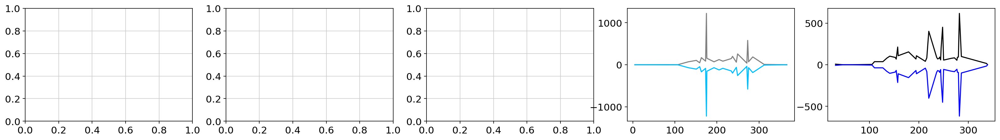

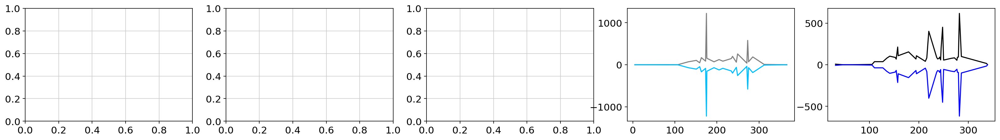

R175H     74
R273H    101
R273C    443
R249S     61
C176F     66
Name: 0, dtype: int64
R248W     69
R282W     94
G245S     37
Y220C      7
V157F    103
Name: 0, dtype: int64
R175H    0
R248Q    1
R273H    0
R248W    6
R273C    2
Name: 0, dtype: int64
=============== iteration 2


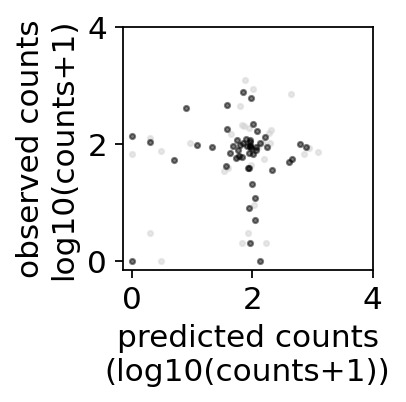

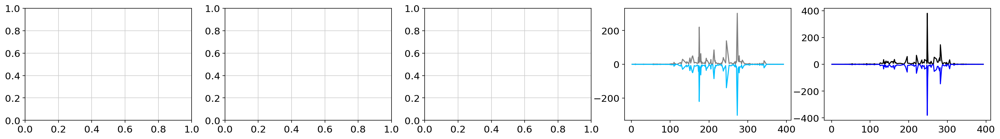

model name Cell. + 
 Mut. + 
 sc-eVIP - 
Train L 
 Test L
mut pred === Allele
R175H    64.892015
R248Q    17.390336
R273H    59.875443
R248W    17.390336
R273C    64.892015
R282W    17.390336
G245S    17.390336
R249S     7.664828
Y220C     4.489509
R213Z    33.226341
R196Z    17.390336
V157F     2.245302
C176F     7.036266
M237I    16.737155
E285K     3.357533
H179R     4.380546
Y163C     2.182109
R306Z    64.892015
G245D    14.496169
R273L     2.245302
Y234C     2.182109
H179Y     6.861591
R248L     1.647659
Y205C     4.489509
S241F     3.731124
W146Z    54.484411
R158H    64.892015
V272M     4.310843
Q192Z     4.678076
I195T     2.020998
           ...    
T387I     2.558979
T387K     6.678894
T387R     0.979288
T387S     0.859028
E388D     0.804523
E388G     1.443191
E388K     3.357533
E388V     1.050081
E388Z     4.976039
G389E     7.940493
G389R     2.303770
G389V     4.398241
P390A     1.072041
P390H     2.646752
P390L     2.303770
P390R     0.871271
P390S    14.496169
P390T     

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:150: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


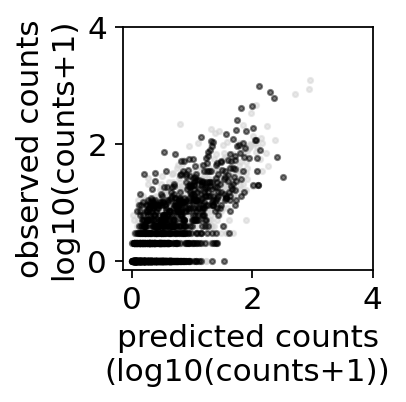

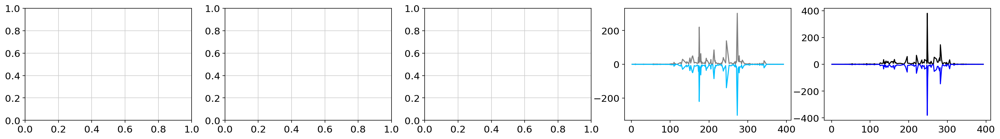

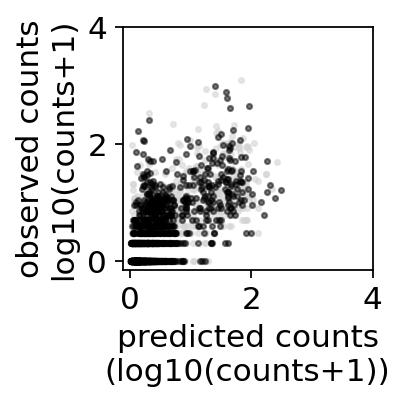

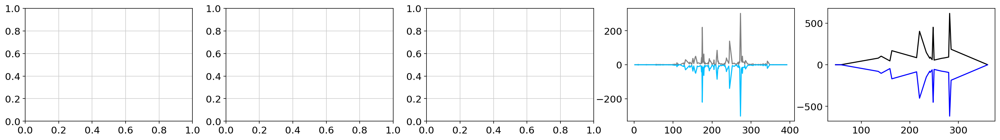

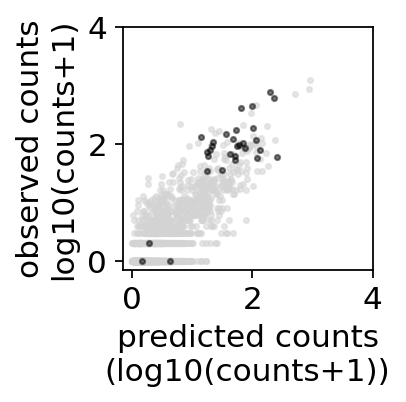

...

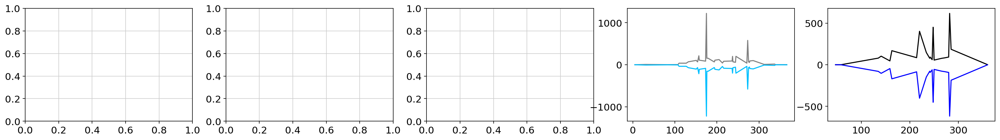

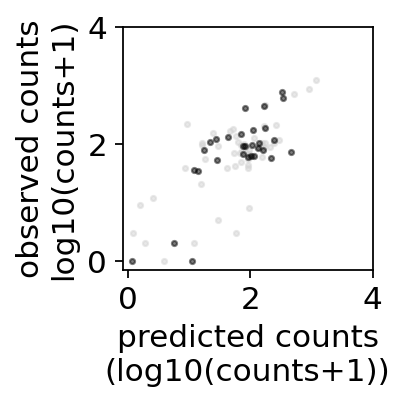

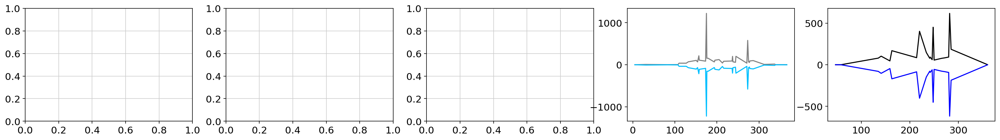

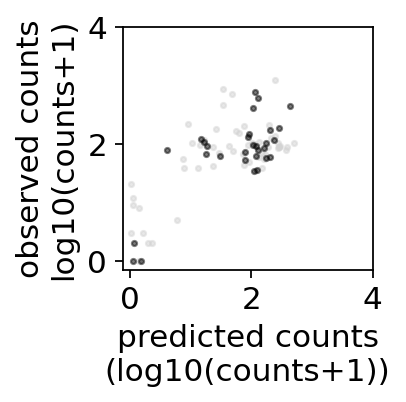

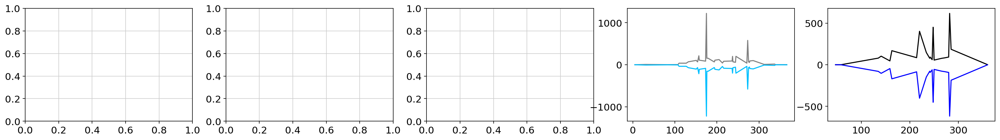

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


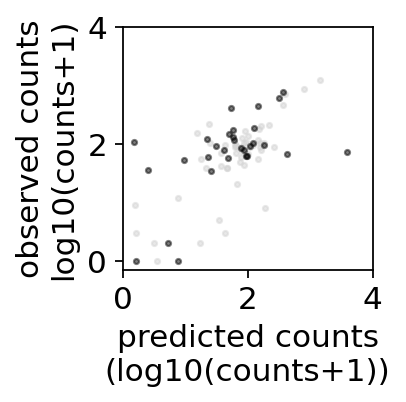

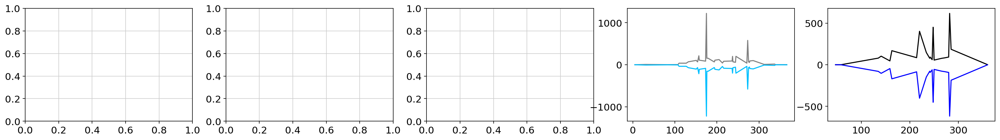

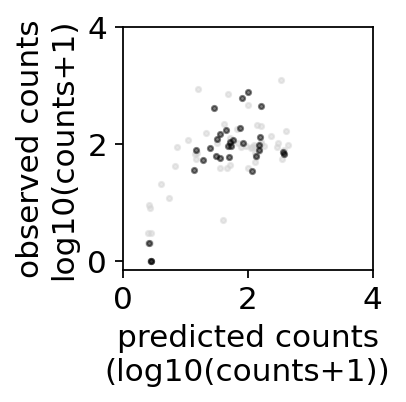

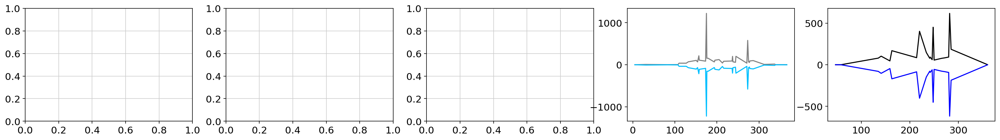

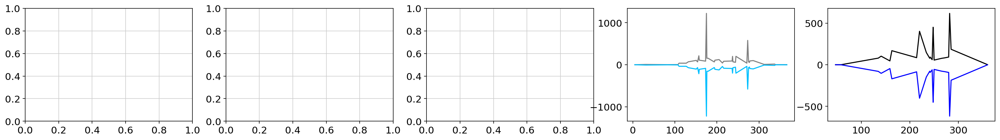

R175H     69
R273H     54
R273C    134
G245S     43
V157F      2
Name: 0, dtype: int64
R248W    147
R282W    103
R249S      0
Y220C    402
E285K     61
Name: 0, dtype: int64
R175H    0
R248Q    1
R273H    1
R248W    0
R273C    0
Name: 0, dtype: int64
=============== iteration 3


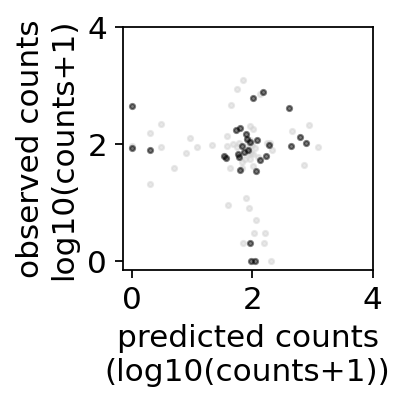

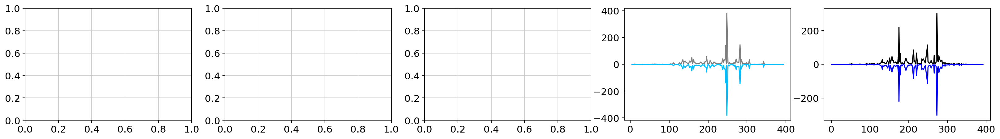

model name Cell. + 
 Mut. + 
 sc-eVIP - 
Train L 
 Test L
mut pred === Allele
R175H    31.446303
R248Q    50.978430
R273H    71.819203
R248W    50.978430
R273C    31.446303
R282W    50.978430
G245S    50.978430
R249S     7.914024
Y220C     3.619259
R213Z    14.910934
R196Z    50.978430
V157F     1.838249
C176F     7.548140
M237I    14.878587
E285K     6.007490
H179R     2.538800
Y163C     2.926036
R306Z    31.446303
G245D    15.916724
R273L     1.838249
Y234C     2.926036
H179Y     3.383959
R248L     2.243470
Y205C     3.619259
S241F     4.787100
W146Z    18.745195
R158H    31.446303
V272M     3.447632
Q192Z     6.745600
I195T     1.574288
           ...    
T387I     2.509179
T387K     5.237232
T387R     1.132213
T387S     1.151044
E388D     0.937564
E388G     1.446640
E388K     6.007490
E388V     1.516690
E388Z     1.949619
G389E     5.539427
G389R     2.058195
G389V     4.847145
P390A     1.170905
P390H     3.551011
P390L     2.058195
P390R     1.198317
P390S    15.916724
P390T     

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:150: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


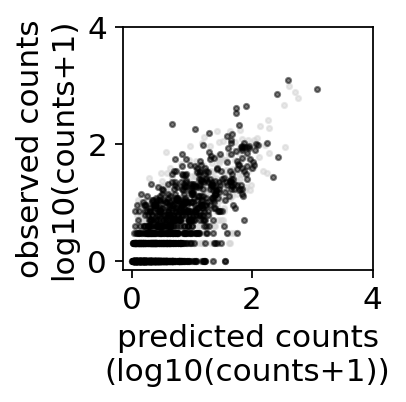

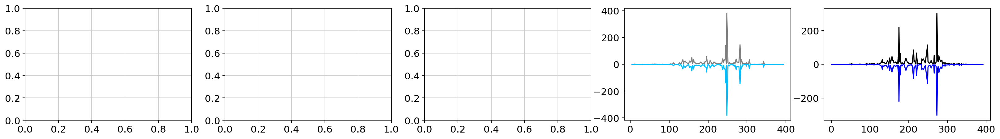

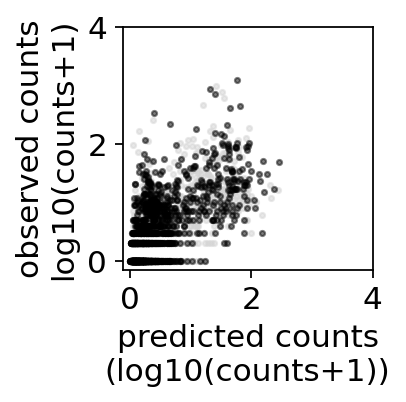

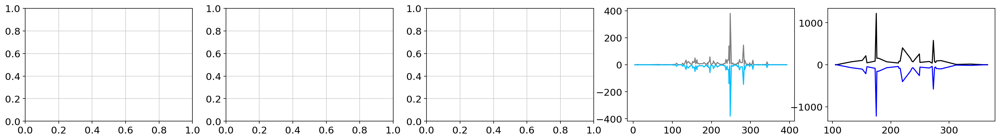

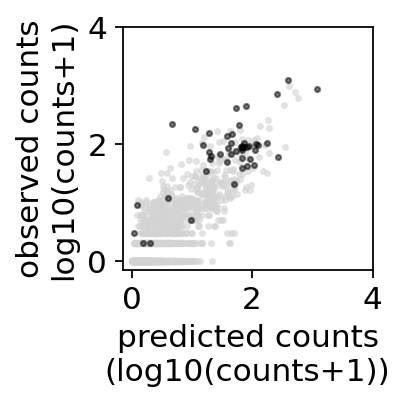

...

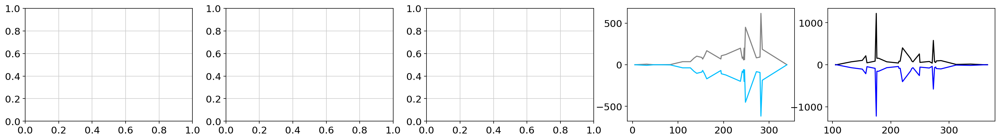

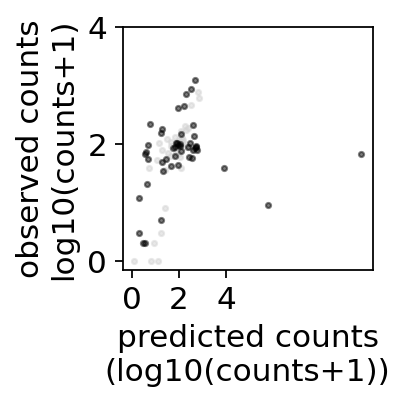

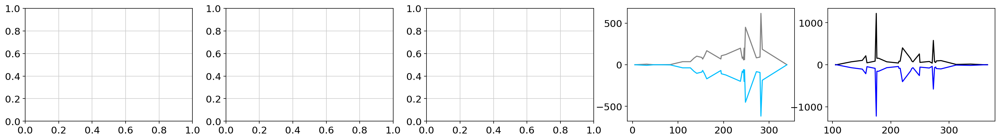

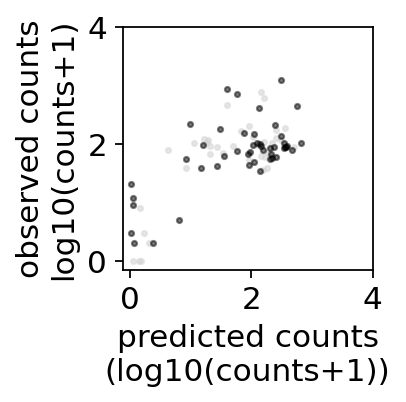

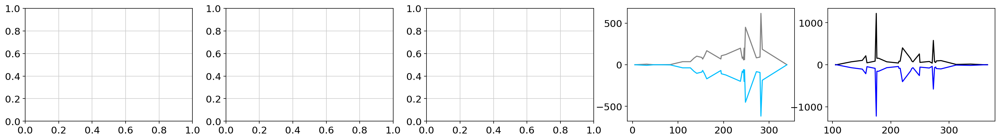

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


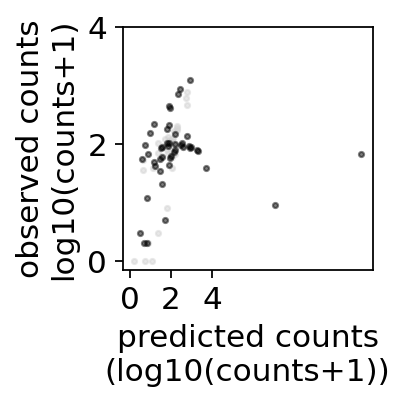

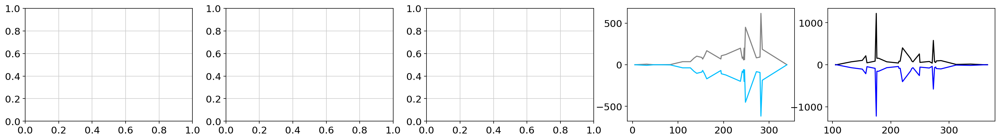

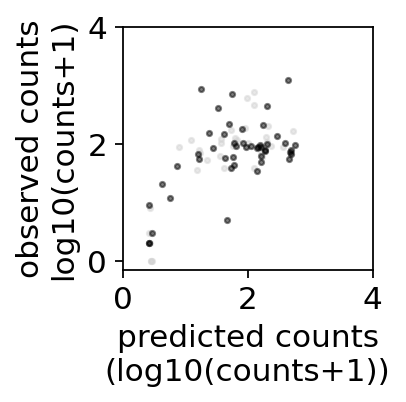

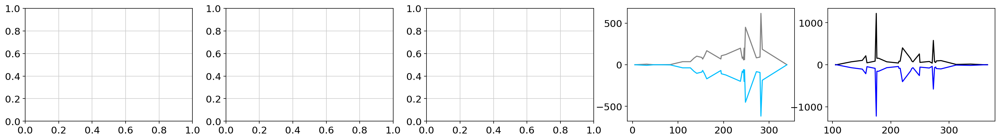

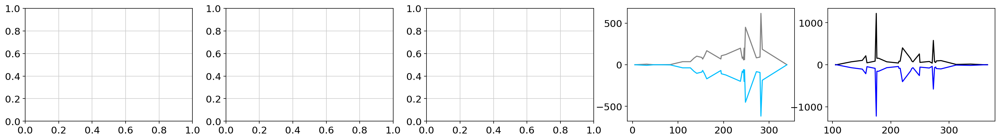

R248W     37
R282W    186
G245S     37
M237I     92
E285K     94
Name: 0, dtype: int64
R175H    147
R273H     41
R273C    443
R249S      2
Y220C    175
Name: 0, dtype: int64
R175H    1
R248Q    0
R273H    7
R248W    0
R273C    0
Name: 0, dtype: int64
=============== iteration 4


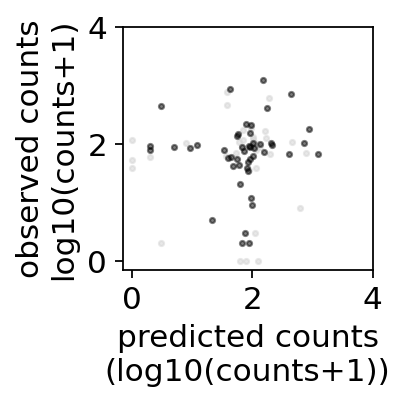

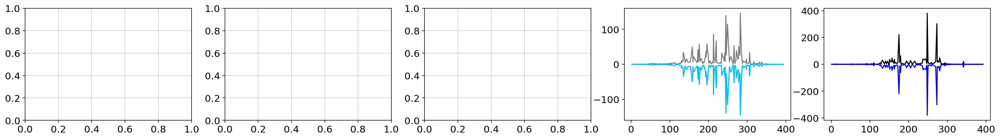

model name Cell. + 
 Mut. + 
 sc-eVIP - 
Train L 
 Test L
mut pred === Allele
R175H    34.713122
R248Q    42.392425
R273H    56.683226
R248W    42.392425
R273C    34.713122
R282W    42.392425
G245S    42.392425
R249S    17.544657
Y220C    29.896321
R213Z    30.434018
R196Z    42.392425
V157F     2.077489
C176F     9.500064
M237I    16.962790
E285K     4.935660
H179R     4.051755
Y163C     4.633104
R306Z    34.713122
G245D    23.644390
R273L     2.077489
Y234C     4.633104
H179Y     3.947872
R248L     2.249328
Y205C    29.896321
S241F     4.492808
W146Z    30.837969
R158H    34.713122
V272M     3.651842
Q192Z     7.227422
I195T     1.590787
           ...    
T387I     2.196044
T387K     8.968149
T387R     0.861298
T387S     1.292480
E388D     1.135099
E388G     1.554234
E388K     4.935660
E388V     1.520139
E388Z     4.117352
G389E     7.811289
G389R     2.022486
G389V     3.784141
P390A     1.148414
P390H     3.157235
P390L     2.022486
P390R     1.053050
P390S    23.644390
P390T    1

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:150: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


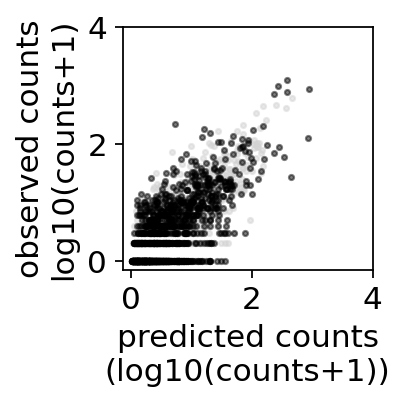

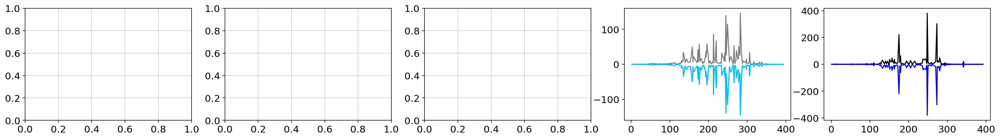

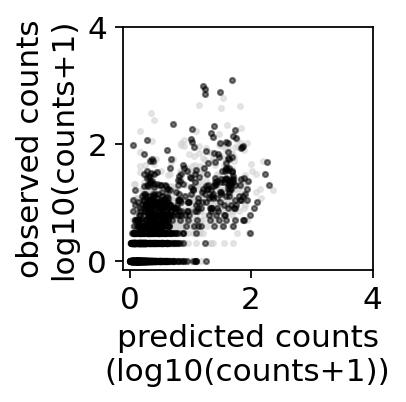

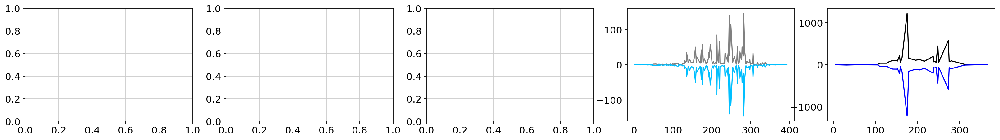

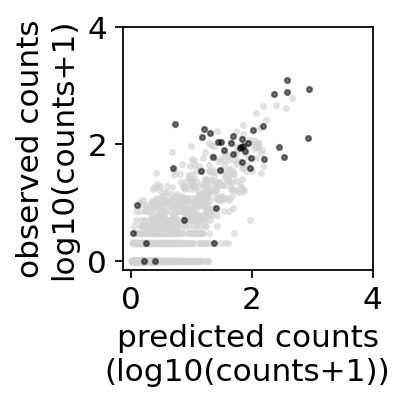

...

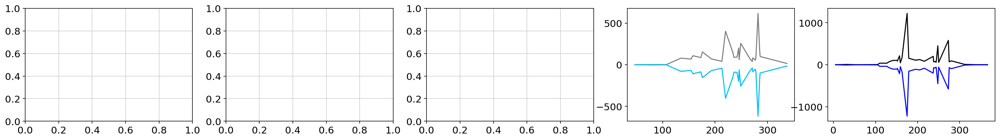

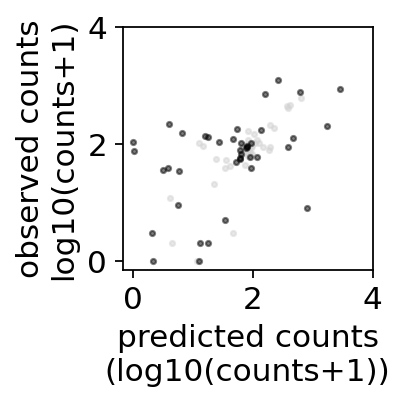

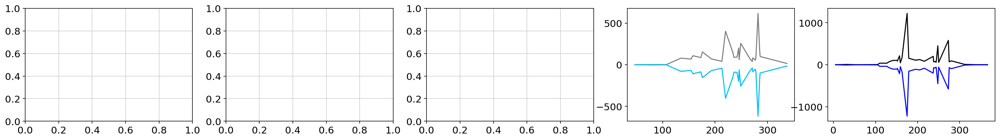

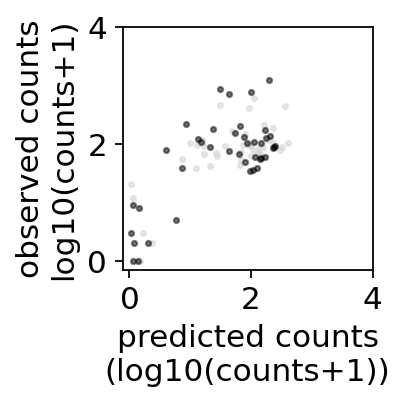

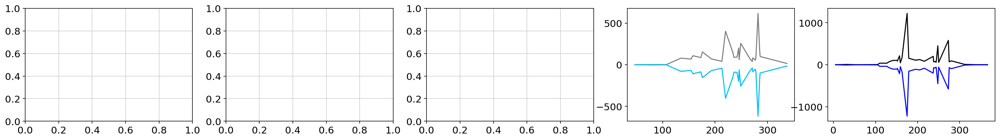

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


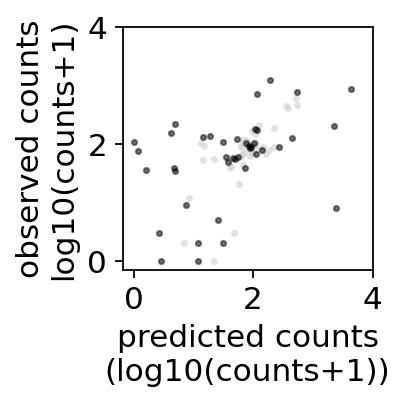

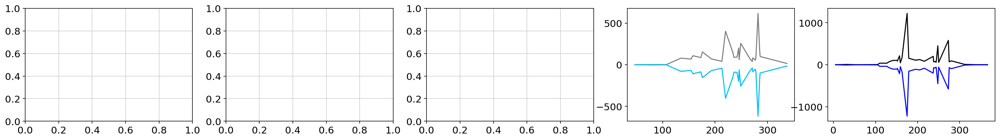

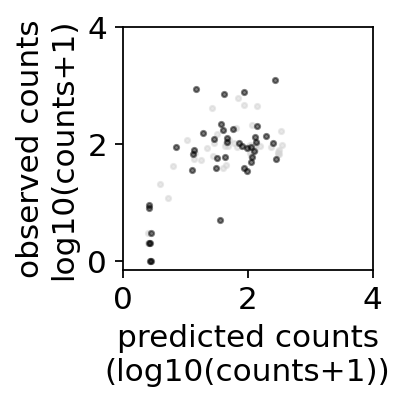

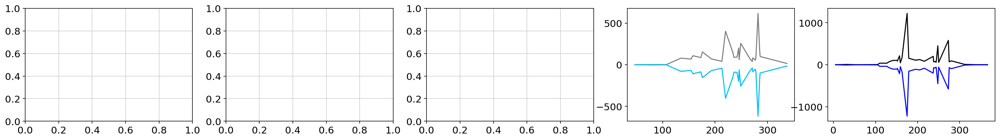

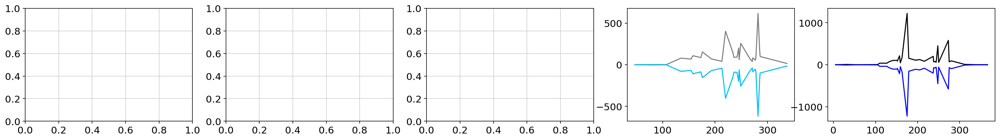

R282W     62
G245S    443
R249S     94
Y220C     52
C176F     61
Name: 0, dtype: int64
R175H    103
R273H      8
R248W    155
R273C    120
V157F    104
Name: 0, dtype: int64
R175H    1
R248Q    0
R273H    0
R248W    5
R273C    2
Name: 0, dtype: int64
=============== iteration 5


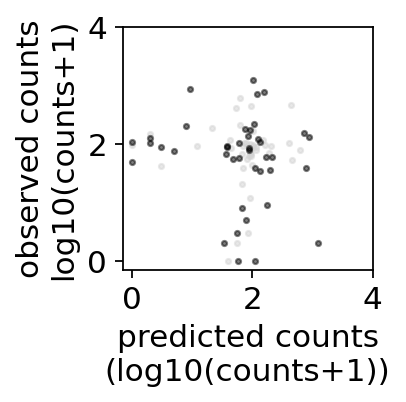

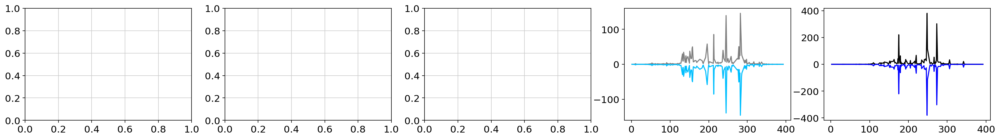

model name Cell. + 
 Mut. + 
 sc-eVIP - 
Train L 
 Test L
mut pred === Allele
R175H    20.147367
R248Q    43.449194
R273H    64.153503
R248W    43.449194
R273C    20.147367
R282W    43.449194
G245S    43.449194
R249S    10.956657
Y220C     1.311559
R213Z    28.162000
R196Z    43.449194
V157F     1.968111
C176F     5.711529
M237I    15.254474
E285K     6.416956
H179R     3.000114
Y163C     2.947925
R306Z    20.147367
G245D    13.088498
R273L     1.968111
Y234C     2.947925
H179Y     2.893912
R248L     2.296778
Y205C     1.311559
S241F     3.780822
W146Z    23.795571
R158H    20.147367
V272M     5.216292
Q192Z     6.824280
I195T     1.685321
           ...    
T387I     2.771168
T387K     4.510448
T387R     1.220435
T387S     1.053526
E388D     1.343036
E388G     1.238465
E388K     6.416956
E388V     1.402978
E388Z     2.960570
G389E     8.222631
G389R     2.533187
G389V     3.936756
P390A     1.076339
P390H     3.020996
P390L     2.533187
P390R     0.915594
P390S    13.088498
P390T    1

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:150: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


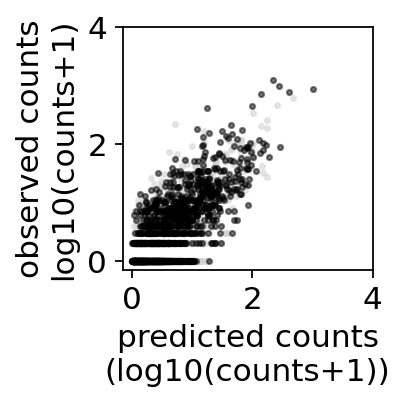

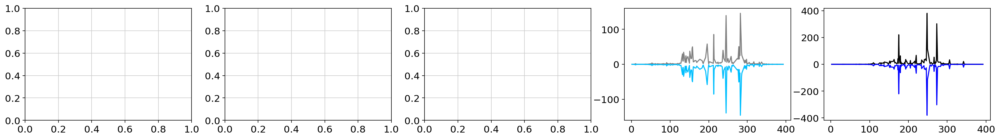

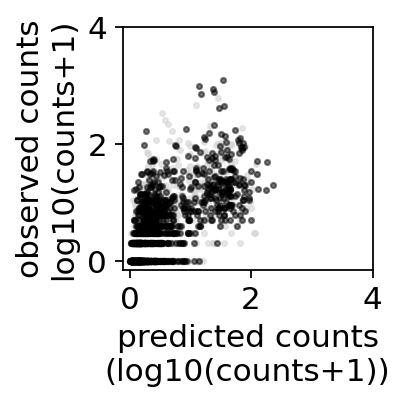

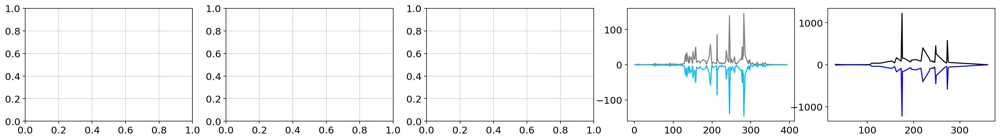

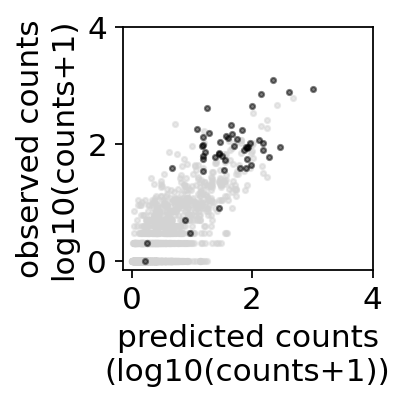

...

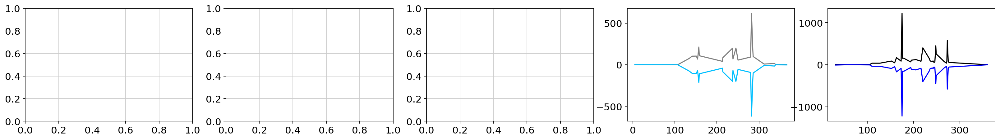

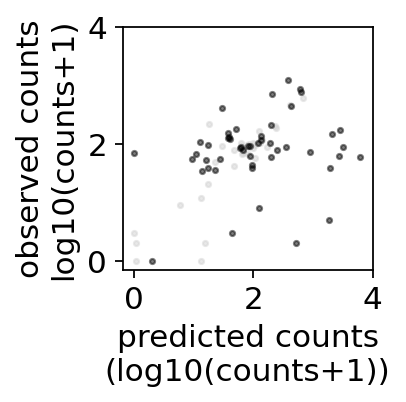

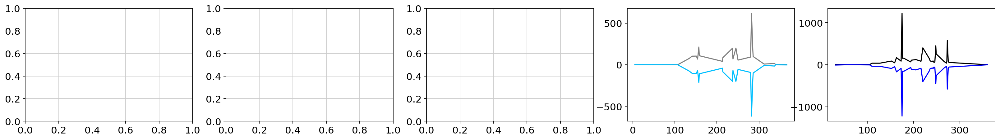

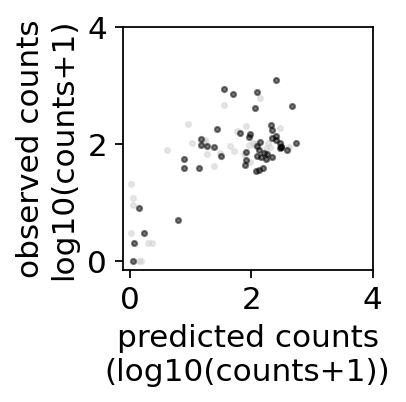

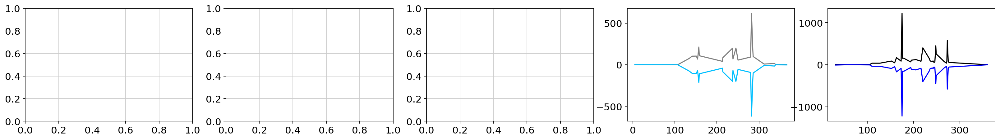

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


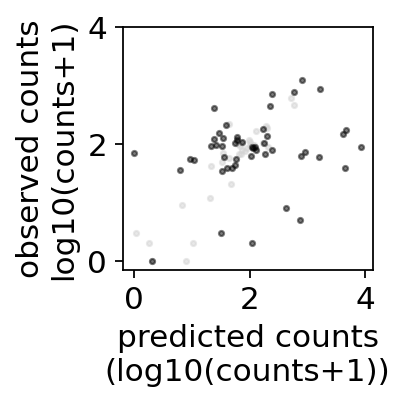

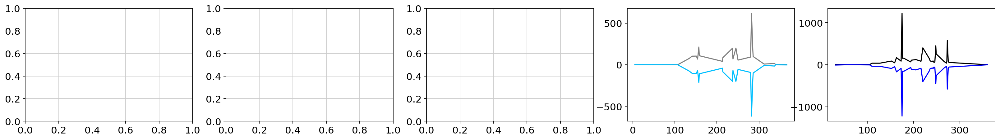

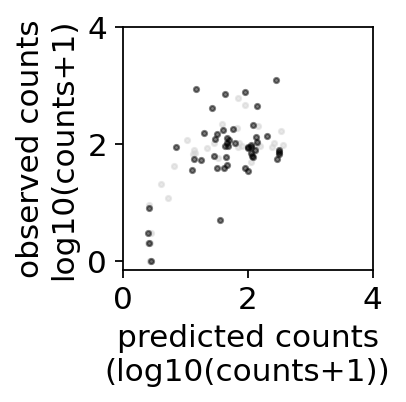

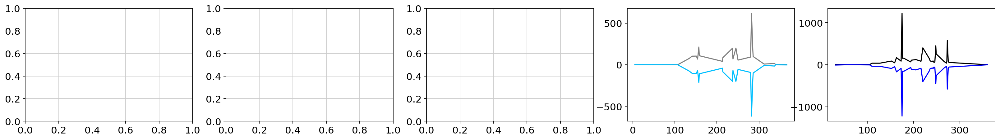

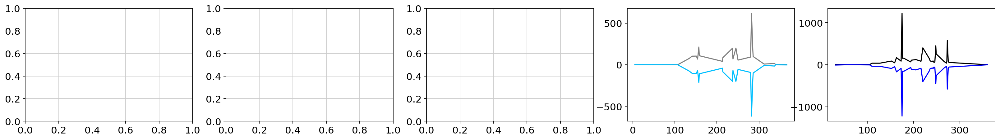

R282W      0
G245S     65
V157F    108
M237I    199
E285K    186
Name: 0, dtype: int64
R175H    770
R273H    120
R248W     92
R273C     35
R249S    443
Name: 0, dtype: int64
R175H      1
R248Q     20
R273H      4
R248W      5
R273C    206
Name: 0, dtype: int64
=============== iteration 6


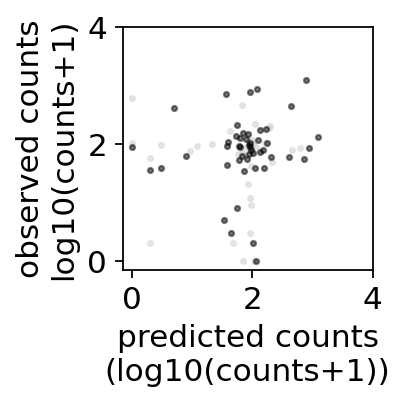

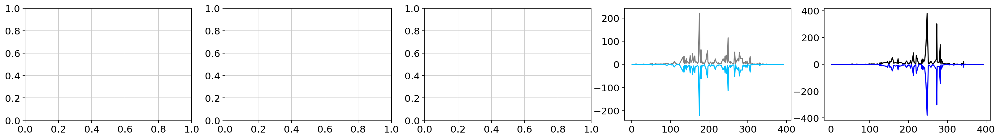

model name Cell. + 
 Mut. + 
 sc-eVIP - 
Train L 
 Test L
mut pred === Allele
R175H    79.237802
R248Q    17.203065
R273H    59.358924
R248W    17.203065
R273C    79.237802
R282W    17.203065
G245S    17.203065
R249S    14.812269
Y220C     9.604625
R213Z     8.738526
R196Z    17.203065
V157F     2.217145
C176F     6.288501
M237I    14.234108
E285K     6.039005
H179R     4.536195
Y163C     4.753271
R306Z    79.237802
G245D     8.075417
R273L     2.217145
Y234C     4.753271
H179Y     4.555168
R248L     1.830282
Y205C     9.604625
S241F     5.373392
W146Z    22.618426
R158H    79.237802
V272M     4.069625
Q192Z     6.226143
I195T     2.094697
           ...    
T387I     2.533196
T387K     4.788950
T387R     1.173333
T387S     0.938763
E388D     0.675416
E388G     2.137190
E388K     6.039005
E388V     1.361233
E388Z     2.702747
G389E     4.965442
G389R     3.115884
G389V     4.954961
P390A     1.214330
P390H     4.012008
P390L     3.115884
P390R     1.185411
P390S     8.075417
P390T    1

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:150: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


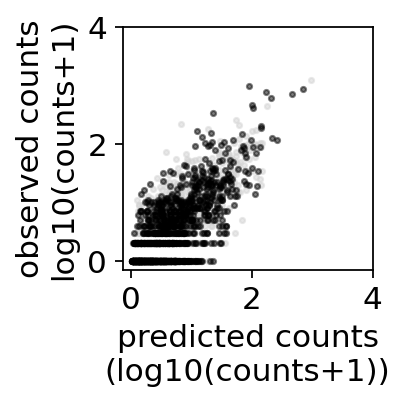

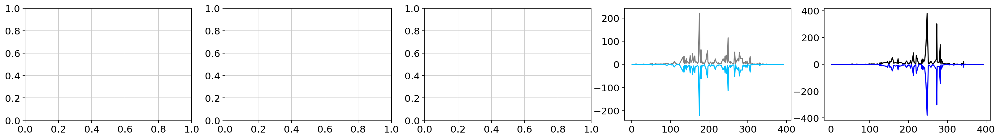

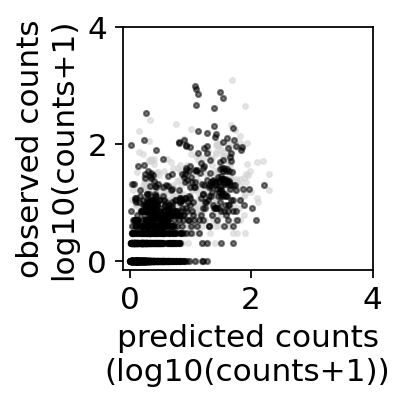

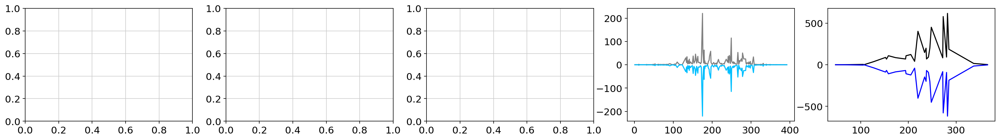

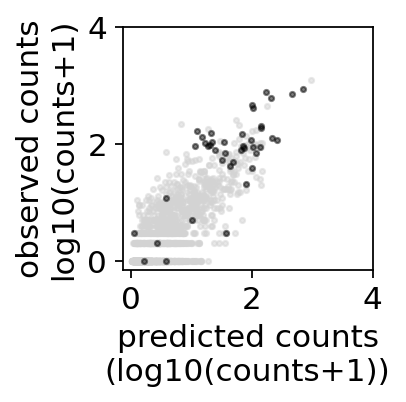

...

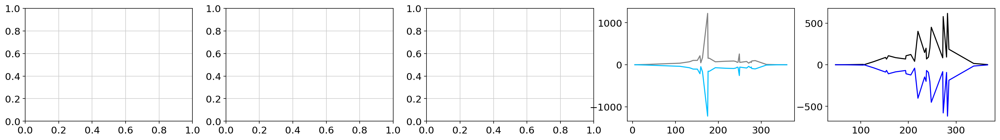

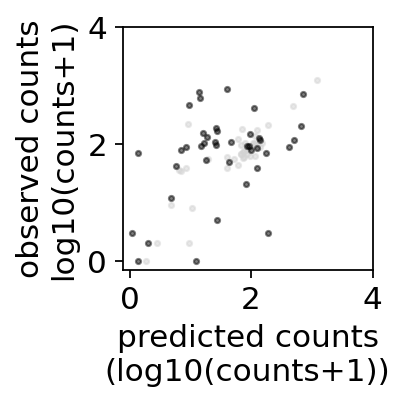

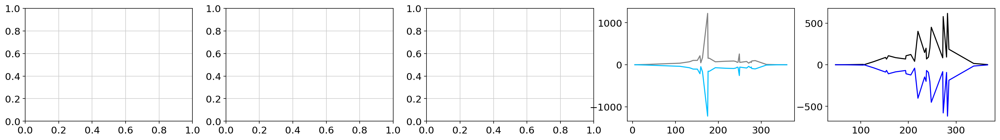

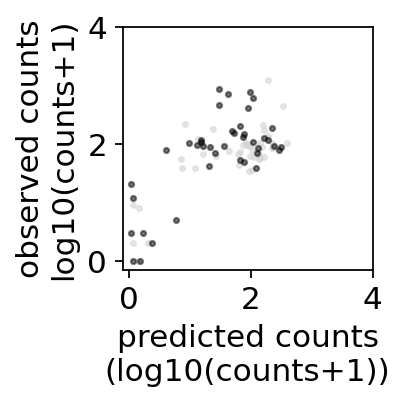

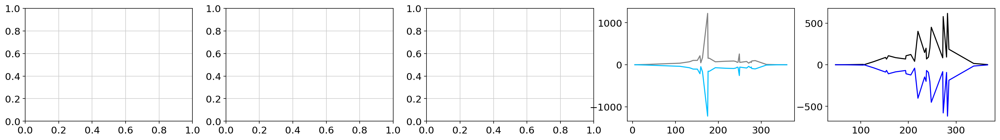

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


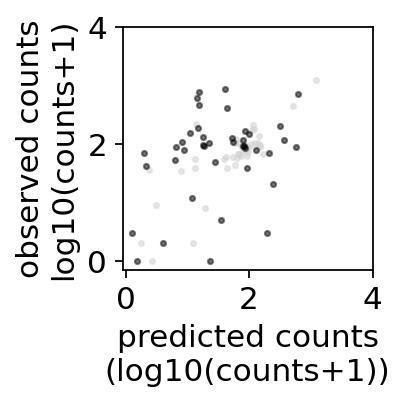

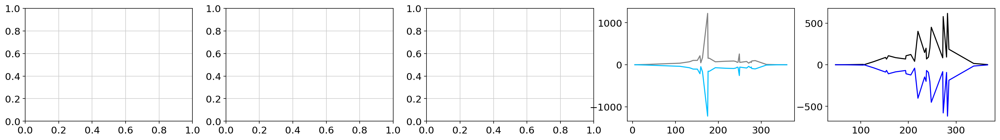

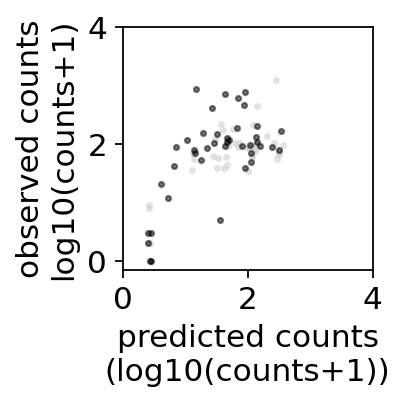

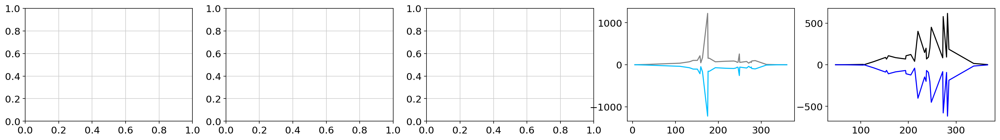

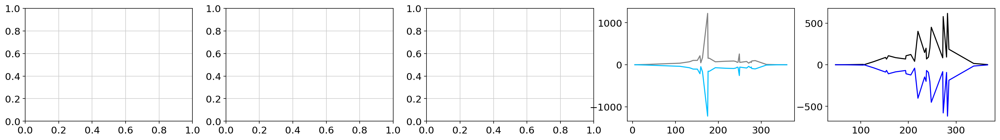

R175H    120
R249S     92
V157F     86
C176F     54
H179R     56
Name: 0, dtype: int64
R273H    163
R248W    147
R273C     78
R282W      2
G245S     52
Name: 0, dtype: int64
R175H     1
R248Q    16
R273H     0
R248W     6
R273C     0
Name: 0, dtype: int64
=============== iteration 7


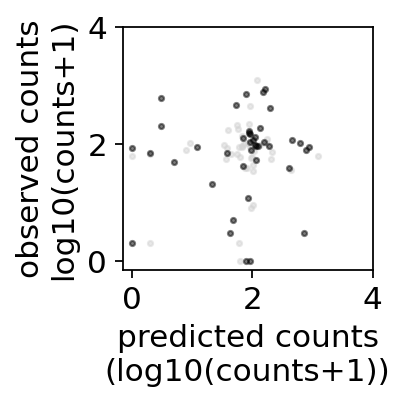

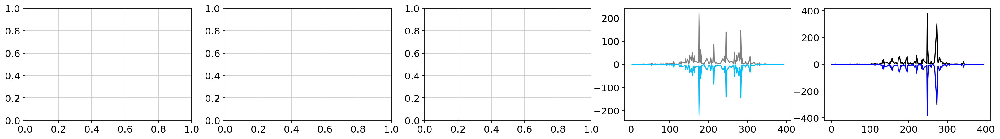

model name Cell. + 
 Mut. + 
 sc-eVIP - 
Train L 
 Test L
mut pred === Allele
R175H     66.790791
R248Q     33.900468
R273H    109.690149
R248W     33.900468
R273C     66.790791
R282W     33.900468
G245S     33.900468
R249S      6.765836
Y220C      5.171285
R213Z     40.044767
R196Z     33.900468
V157F      1.993314
C176F      5.980663
M237I      8.160860
E285K      4.622785
H179R      3.828810
Y163C      3.074718
R306Z     66.790791
G245D     11.482144
R273L      1.993314
Y234C      3.074718
H179Y      4.424217
R248L      1.847462
Y205C      5.171285
S241F      4.647082
W146Z     27.706283
R158H     66.790791
V272M      3.459505
Q192Z      4.914774
I195T      1.779422
            ...    
T387I      1.983109
T387K      4.442680
T387R      0.926284
T387S      0.881802
E388D      0.629506
E388G      1.525255
E388K      4.622785
E388V      1.119829
E388Z      4.672072
G389E      6.262414
G389R      2.495197
G389V      4.371337
P390A      1.072163
P390H      2.204706
P390L      2.495197
P3

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:150: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


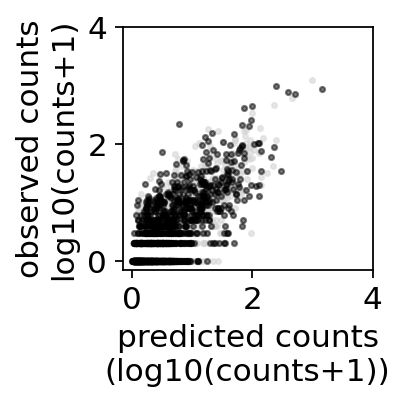

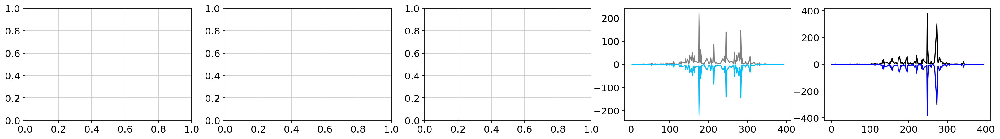

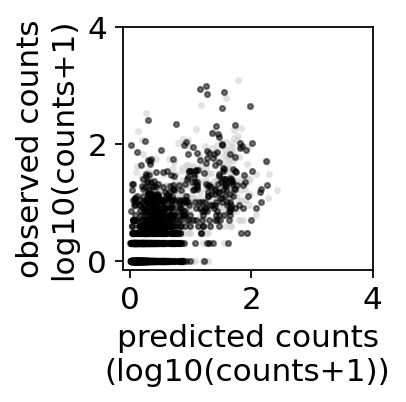

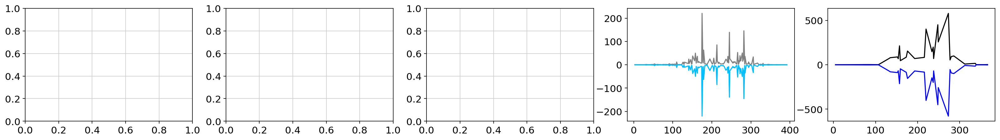

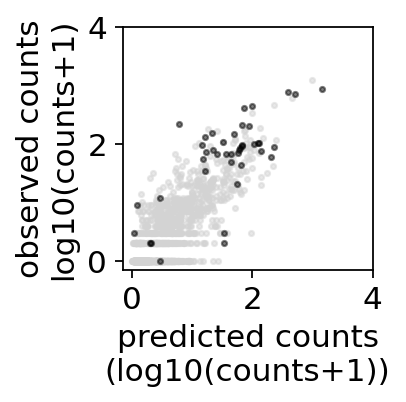

...

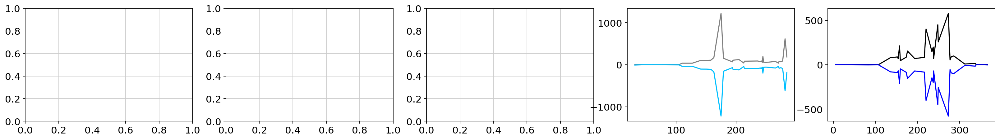

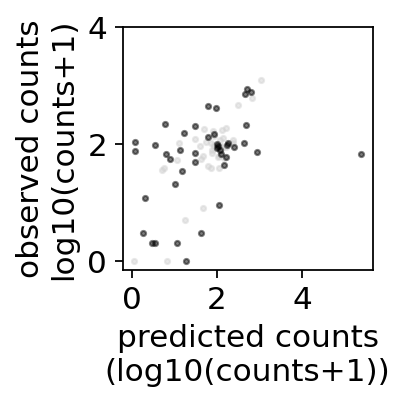

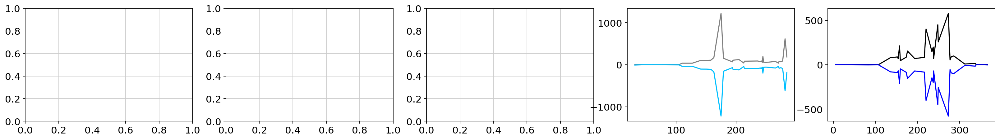

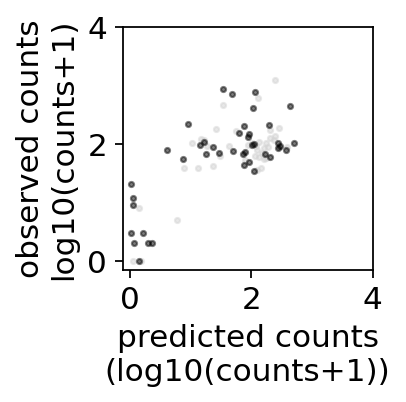

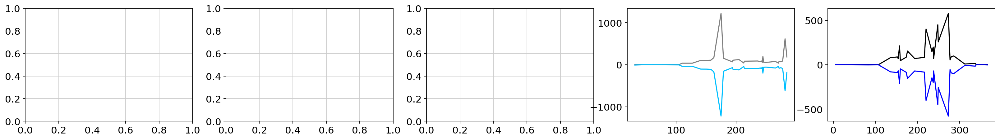

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


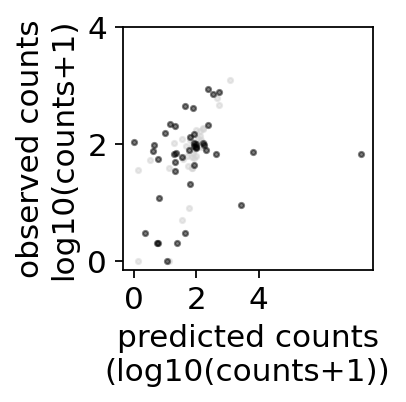

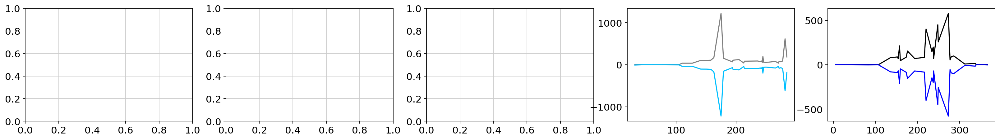

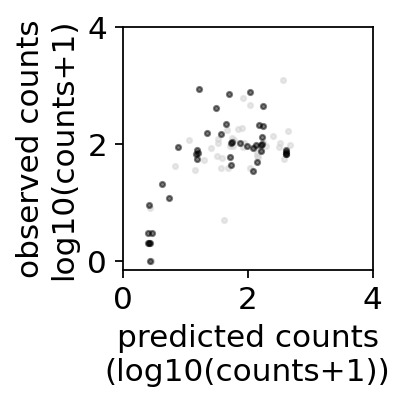

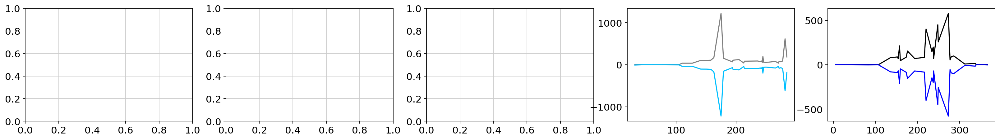

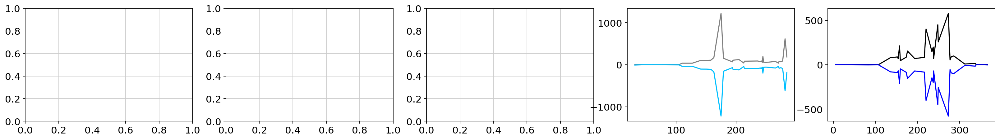

R175H     41
R282W    617
G245S    104
E285K     54
H179R    103
Name: 0, dtype: int64
R273H     43
R248W    147
R273C    206
R249S     88
Y220C     71
Name: 0, dtype: int64
R175H     0
R248Q    11
R273H     1
R248W     0
R273C     6
Name: 0, dtype: int64
=============== iteration 8


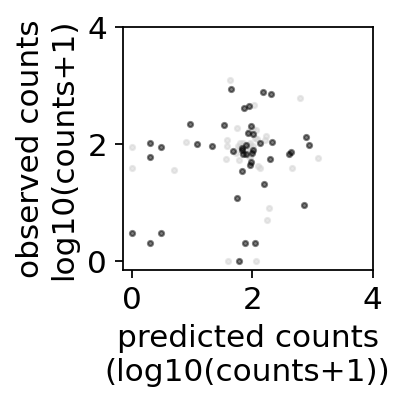

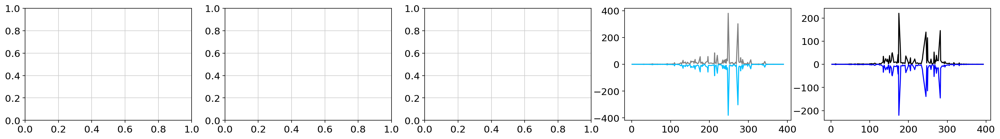

model name Cell. + 
 Mut. + 
 sc-eVIP - 
Train L 
 Test L
mut pred === Allele
R175H    55.254946
R248Q    47.888317
R273H    59.188340
R248W    47.888317
R273C    55.254946
R282W    47.888317
G245S    47.888317
R249S     3.989785
Y220C    21.215975
R213Z    24.763988
R196Z    47.888317
V157F     1.716680
C176F    15.477906
M237I     5.898562
E285K     4.525540
H179R     4.000845
Y163C     5.163140
R306Z    55.254946
G245D     7.899027
R273L     1.716680
Y234C     5.163140
H179Y     3.209422
R248L     2.114814
Y205C    21.215975
S241F     4.530872
W146Z    11.686878
R158H    55.254946
V272M     1.717607
Q192Z     4.364795
I195T     1.442507
           ...    
T387I     0.973594
T387K     7.915509
T387R     0.765401
T387S     0.904849
E388D     0.634291
E388G     1.189907
E388K     4.525540
E388V     1.047828
E388Z     3.278164
G389E     3.641428
G389R     2.314108
G389V     3.211536
P390A     0.904906
P390H     3.983426
P390L     2.314108
P390R     0.912668
P390S     7.899027
P390T     

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:150: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


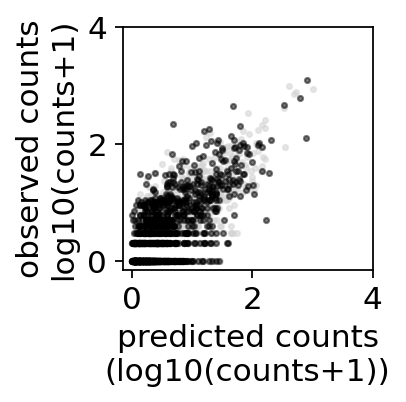

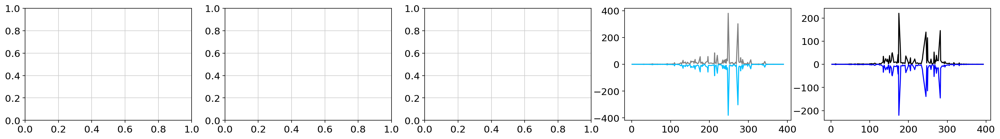

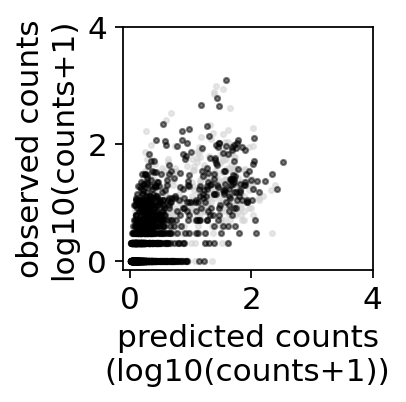

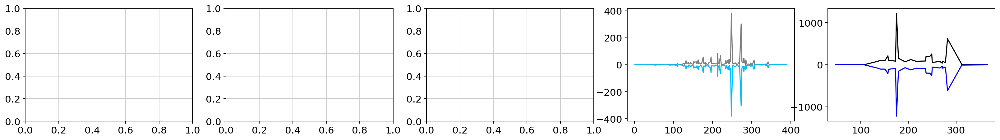

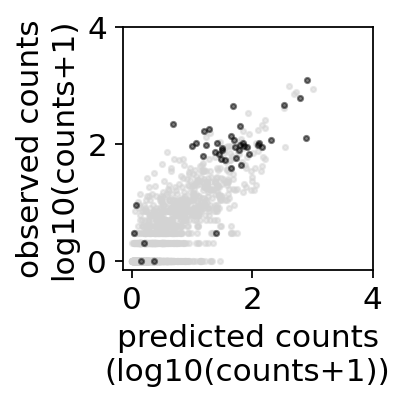

...

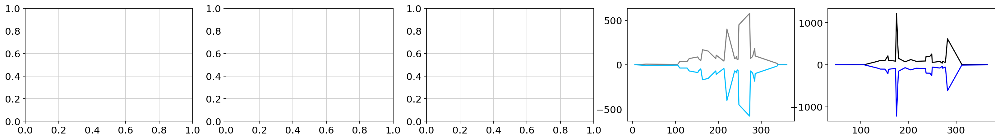

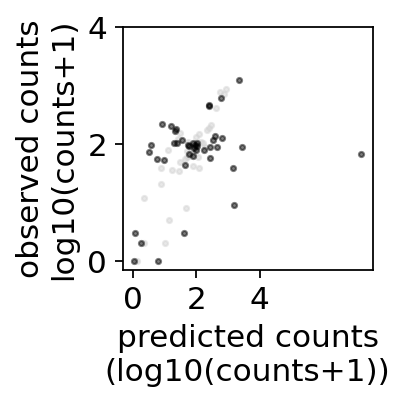

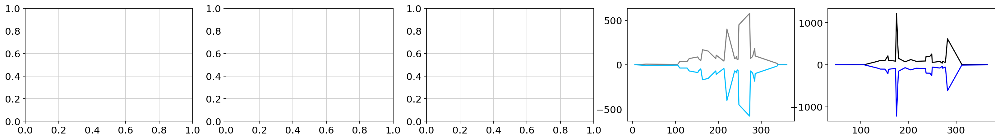

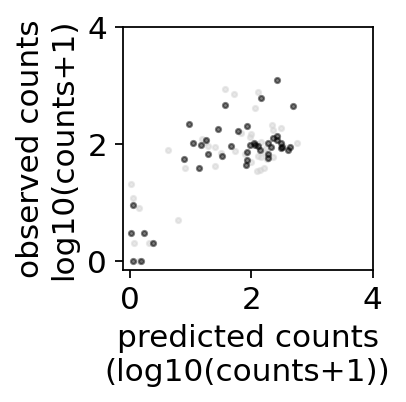

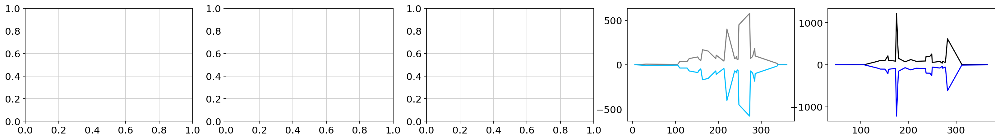

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


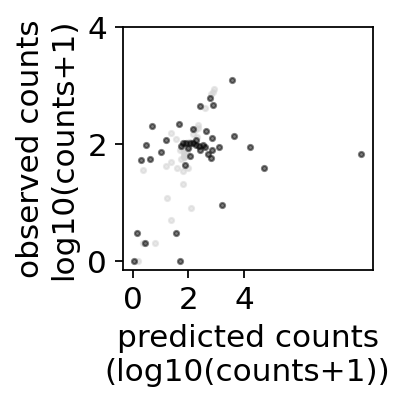

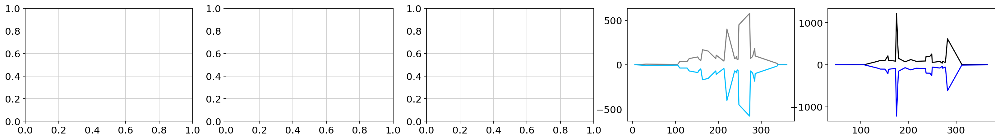

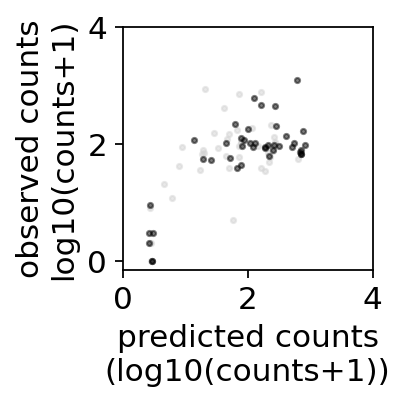

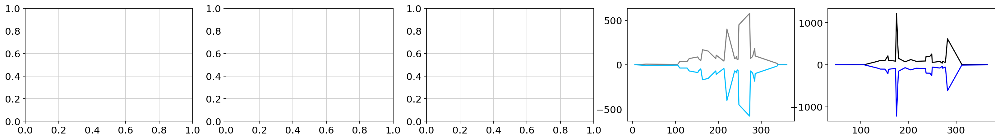

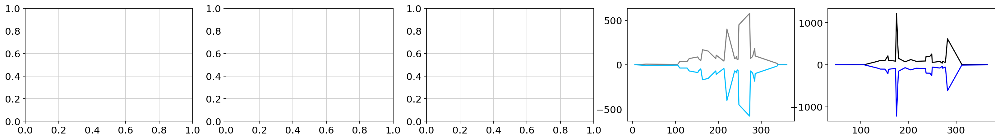

R273H     92
R248W    120
R273C    863
Y220C    718
C176F     66
Name: 0, dtype: int64
R175H      0
R282W      2
G245S    134
R249S     83
V157F     38
Name: 0, dtype: int64
R175H    0
R248Q    5
R273H    4
R248W    0
R273C    0
Name: 0, dtype: int64
=============== iteration 9


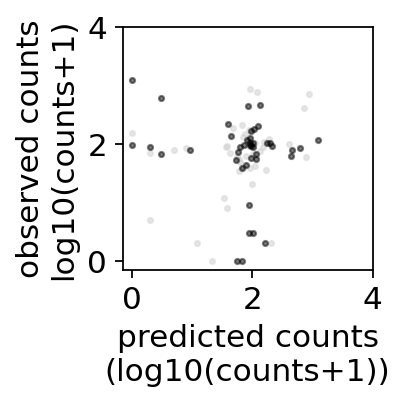

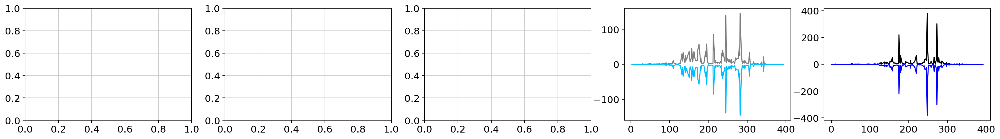

model name Cell. + 
 Mut. + 
 sc-eVIP - 
Train L 
 Test L
mut pred === Allele
R175H    35.510652
R248Q    48.879379
R273H    52.780908
R248W    48.879379
R273C    35.510652
R282W    48.879379
G245S    48.879379
R249S     8.649373
Y220C     2.929155
R213Z    29.622066
R196Z    48.879379
V157F     1.845239
C176F     8.009004
M237I    23.010889
E285K     5.850322
H179R     3.305146
Y163C     5.953878
R306Z    35.510652
G245D    13.517275
R273L     1.845239
Y234C     5.953878
H179Y     2.625163
R248L     2.259651
Y205C     2.929155
S241F     5.701031
W146Z    24.315140
R158H    35.510652
V272M     5.589569
Q192Z     3.292058
I195T     1.781623
           ...    
T387I     2.191936
T387K     7.516267
T387R     1.396700
T387S     1.054018
E388D     0.919084
E388G     1.860363
E388K     5.850322
E388V     1.741610
E388Z     3.890023
G389E     9.262334
G389R     2.040001
G389V     3.053462
P390A     1.133421
P390H     2.844093
P390L     2.040001
P390R     1.365792
P390S    13.517275
P390T     

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:150: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


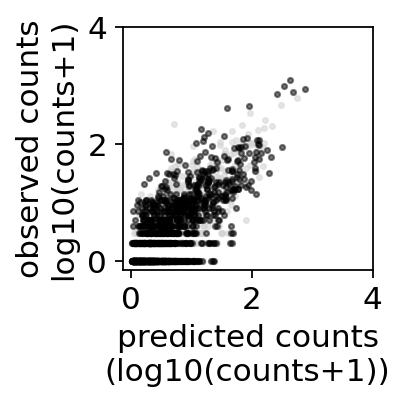

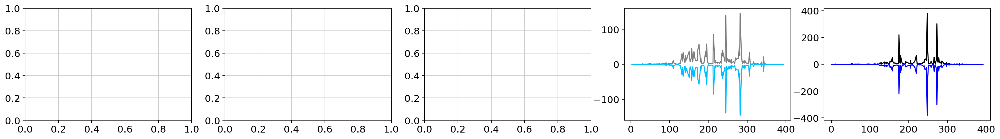

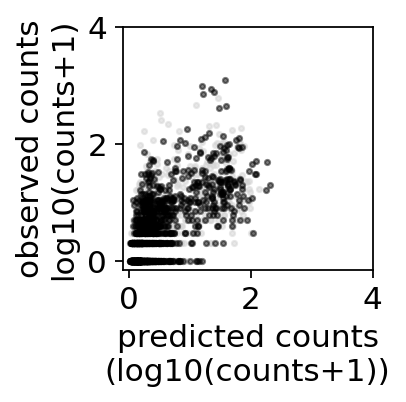

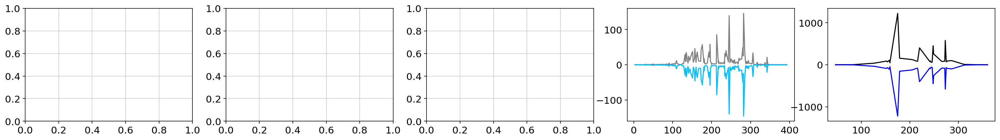

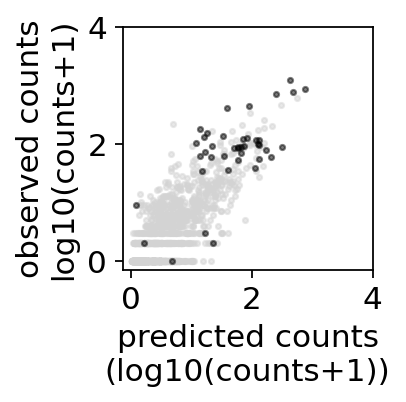

...

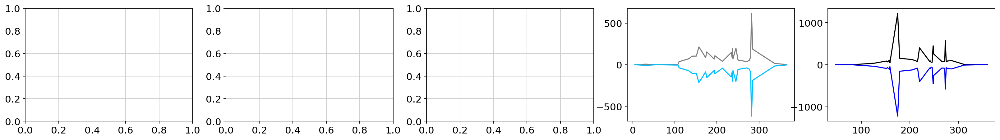

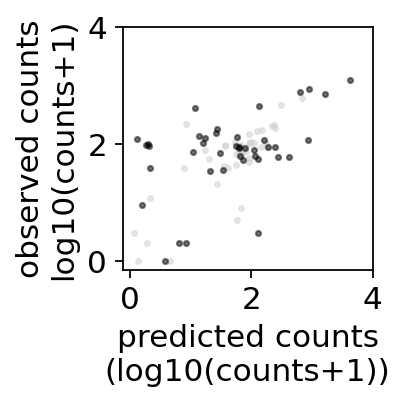

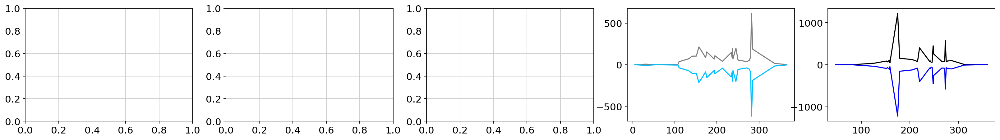

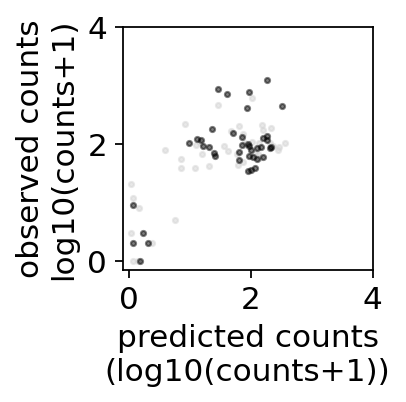

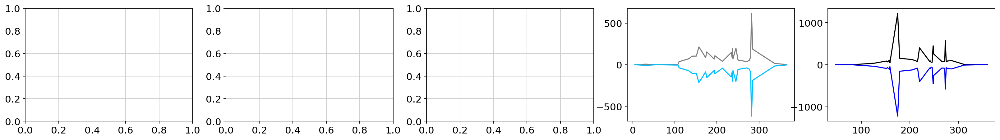

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:460: RuntimeWarning: divide by zero encountered in log
  return var_weights / scale * (endog * np.log(mu) - mu -
/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:1985: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


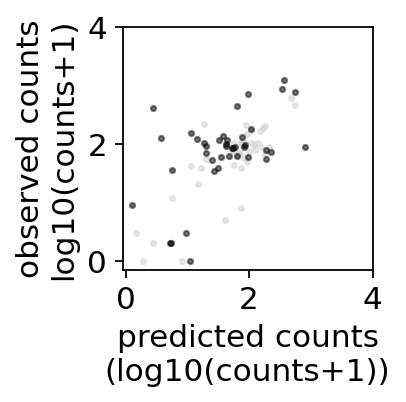

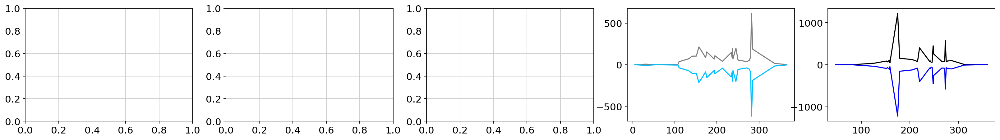

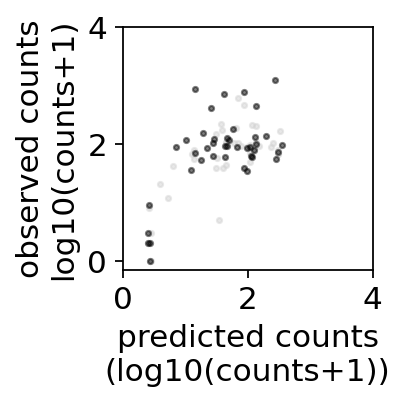

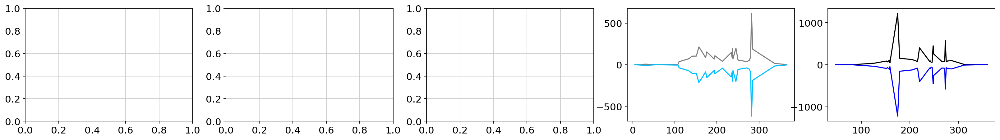

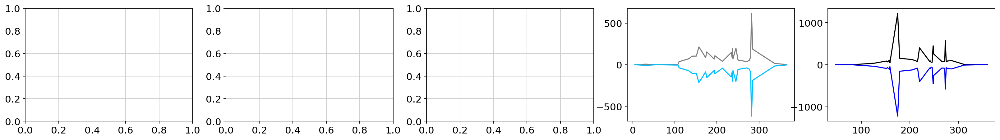

R282W    163
G245S     37
V157F     66
C176F     93
M237I      7
Name: 0, dtype: int64
R175H     103
R273H    1221
R248W      33
R273C     863
R249S      94
Name: 0, dtype: int64
R175H     2
R248Q    15
R273H     0
R248W    14
R273C     1
Name: 0, dtype: int64


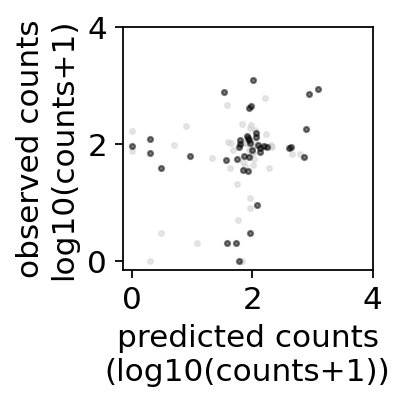

In [182]:
def predict_from_mutational(data,features,func_data,mymodel):
    mut_data=data.loc[:,features]
    for c in func_data:
        mut_data[c]=0
    #now, predict
    mut_preds=mymodel.predict(mut_data)
    return(mut_preds)

signature_cols=['Signature_1',
       'Signature_5',
       'Signature_2',
       'Signature_4',
       'Signature_6',
       'Signature_7',
       'Signature_13',
       'Signature_24',]
impact_cols=['HotellingT2']
pheno_cols=['A549_p53WT_Nutlin-3_Z-score', 
       'A549_p53NULL_Nutlin-3_Z-score',
       'A549_p53NULL_Etoposide_Z-score']
yname='IARC_Mutation_Counts'

#record model performances here
performances=pd.DataFrame(columns=['condition','pearson','spearman','r2','fold'])
results={}


signature_cols=['Signature_1', 'Signature_2', 'Signature_3',
       'Signature_4', 'Signature_5', 'Signature_6', 'Signature_7',
       'Signature_8', 'Signature_9', 'Signature_10', 'Signature_11',
       'Signature_12', 'Signature_13', 'Signature_14', 'Signature_15',
       'Signature_16', 'Signature_17', 'Signature_18', 'Signature_19',
       'Signature_20', 'Signature_21', 'Signature_22', 'Signature_23',
       'Signature_24', 'Signature_25', 'Signature_26', 'Signature_27',
       'Signature_28', 'Signature_29', 'Signature_30']
mut_prediction_data=pd.DataFrame(index=sorted_variants)


for i in range(10):
    print('=============== iteration',i)
    #define train, validation sets
    #==============================
    #randomize train/test - by position
    foldname='fold'+str(i)
    rng=np.random.RandomState(i)
    data[foldname]=get_positions_train_valid(copy.deepcopy(data['Position']),rng)
    
    data[foldname+'not']=(data[foldname]==False)
    
    data['train'+foldname]=np.multiply(data['has_effsize'],data[foldname])
    data['valid'+foldname]=np.multiply(data['has_effsize'],data[foldname+'not'])
    
    #train each model of interest
    #============================
    model2features={}
    model2features['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=pheno_cols
    
    model2features['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']=list(set(pheno_cols).union(set([])))
    
    model2features['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']=list(set(pheno_cols).union(set(signature_cols)))
    model2features['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']=list(set(pheno_cols).union(set([])))
     
    model2features['Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S \n Test S']=list(set(['A549_p53WT_Nutlin-3_Z-score']).union(set(signature_cols)))
    model2features['Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S \n Test S']=['A549_p53WT_Nutlin-3_Z-score']
    
    model2features['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']=list(set(impact_cols).union(set(signature_cols)))
    model2features['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']=impact_cols
    
    
    
    model2train={}
    model2train['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=foldname
    model2train['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=foldname
    
    model2train['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']=foldname
    model2train['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']=foldname
    
    model2train['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']='train'+foldname
    model2train['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']='train'+foldname
     
    model2train['Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S \n Test S']='train'+foldname
    model2train['Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S \n Test S']='train'+foldname
    
    model2train['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']='train'+foldname
    model2train['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']='train'+foldname
    
       
    model2valid={}

    model2valid['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=foldname+'not'
    model2valid['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=foldname+'not'
    
    model2valid['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']='valid'+foldname
    model2valid['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']='valid'+foldname
    
    model2valid['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']='valid'+foldname
    model2valid['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']='valid'+foldname
     
    model2valid['Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S \n Test S']='valid'+foldname
    model2valid['Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S \n Test S']='valid'+foldname
    
    model2valid['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']='valid'+foldname
    model2valid['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']='valid'+foldname

       
    model2num={}
    model2num['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L']=1
    model2num['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L']=2
    
    model2num['Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S']=3
    model2num['Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S']=4
    
    model2num['Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S']=5
    model2num['Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S']=6
     
    model2num['Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain S \n Test S']=7
    model2num['Cell. Nutlin3 \n Mut. - \n sc-eVIP - \nTrain S \n Test S']=8
    
    model2num['Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']=9
    model2num['Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']=10
    
    
    results[i]={}
    
    model_names=list(model2features.keys())
    for idx in range(len(model_names)): #['impact_train100variants']:#
        model_name=model_names[idx]
        
        features=model2features[model_name]
        performance_current_full=model_full(data,
                    features,
                    training_pos_col=model2train[model_name],
                    valid_pos_col=model2valid[model_name],
                    training_y_name=yname,
                    valid_y_name=yname,
                                            
                  toprint=model_name)
        
        
        #predictions from mutational signatures coefficients, trained using mutsig and func data
        if model_name=='Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L':
            print('model name',model_name)
            model_here=performance_current_full[0]['model']
            mut_pred=predict_from_mutational(data,
                                             model2features[model_name],pheno_cols,
                                            model_here)
            print('mut pred ===',mut_pred)
            mut_prediction_data['iter'+str(i)]=mut_pred.loc[sorted_variants]
            model_here.save('TP53model.iter'+str(i))
        #=================    
            
        plot_performance(performance_current_full[0],'',-0.5,4)
        
        import copy
        results[i][model_name]=copy.deepcopy(performance_current_full)
        
        performance_current=performance_current_full[4]
        performance_current['fold']=foldname
        performances=pd.concat([performances,performance_current],axis=0)
        
        
        
    import copy
    import random
    model_name='Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S'
    features=model2features[model_name]
    out=model_full(data,
                    features,
                    training_pos_col=model2train[model_name],
                    valid_pos_col=model2valid[model_name],
                    training_y_name=yname,
                    valid_y_name=yname,
                  toprint=model_name)
    out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)


    
    for item in ['train','valid','all']:
        idx=list(out[0]['obs_'+item].index)
        stuff=copy.deepcopy(list(out[0]['obs_'+item]))
        #shuffle
        stuff=rng.choice(stuff,size=len(stuff),replace=False)
        out[0]['pred_'+item]=pd.DataFrame(stuff,index=idx)[0]
        print(out[0]['pred_'+item].head())
    results[i]['shuffled']=copy.deepcopy(out)
    y_pred=np.array(out[0]['pred_valid']).flatten()
    y=out[0]['obs_valid']
    
    plot_performance(out[0],'',-0.5,4)
    
    
    from scipy.stats import spearmanr,pearsonr
    from sklearn.metrics import r2_score
    p=pearsonr(y,y_pred)[0]
    p=str(int(100*p)/100)
    r2=r2_score(y,y_pred)
    r2=str(int(100*r2)/100)
    sp=spearmanr(y,y_pred)[0]
    sp=str(int(100*sp)/100)
    performances_shuffled=pd.DataFrame({'condition':['shuffled'],
                                       'pearson':p,
                                       'spearman':sp,
                                       'r2':r2,
                                       'fold':[foldname]})
    performances=pd.concat([performances,performances_shuffled],axis=0)

In [172]:
mutsig.columns

Index(['Allele', 'AA_wt', 'AA_variant', 'Position',
       'A549_p53WT_Nutlin-3_Z-score', 'A549_p53NULL_Nutlin-3_Z-score',
       'A549_p53NULL_Etoposide_Z-score', 'Signature_1', 'Signature_2',
       'Signature_3', 'Signature_4', 'Signature_4*', 'Signature_5',
       'Signature_6', 'Signature_7', 'Signature_8', 'Signature_9',
       'Signature_10', 'Signature_11', 'Signature_12', 'Signature_13',
       'Signature_14', 'Signature_15', 'Signature_16', 'Signature_17',
       'Signature_18', 'Signature_19', 'Signature_20', 'Signature_21',
       'Signature_22', 'Signature_23', 'Signature_24', 'Signature_25',
       'Signature_26', 'Signature_27', 'Signature_28', 'Signature_29',
       'Signature_30', 'IARC_Mutation_Counts', 'GENIE_Mutation_Counts',
       'Phenotypic_Selection_Model', 'Mutational_Signatures_Model',
       'Combined_Model', 'Unnamed: 43', 'Unnamed: 44', 'Unnamed: 45',
       'mut.pred'],
      dtype='object')

In [170]:
means=np.mean(mut_prediction_data,axis=1)
sds=np.std(mut_prediction_data,axis=1)
mut_prediction_data2=pd.DataFrame({'mean':means,'sd':sds},index=mut_prediction_data.index)
print(mut_prediction_data2)

                  mean         sd
P359P              NaN        NaN
T170T              NaN        NaN
D21D               NaN        NaN
A83V         63.102691   2.537733
P295P              NaN        NaN
P153P              NaN        NaN
E2E                NaN        NaN
P47P               NaN        NaN
R158R              NaN        NaN
T118T              NaN        NaN
Q5R           2.559889   0.117878
G360V         5.433584   0.175115
V31I        103.578927  52.805757
P36P               NaN        NaN
P58R          1.490481   0.010479
P301P              NaN        NaN
L344L              NaN        NaN
P47S          3.334375   0.331142
P222P              NaN        NaN
T312S         1.859201   0.148679
WT                 NaN        NaN
E339K        11.042393   1.947025
Y107H         1.581138   0.078900
S366A         1.206719   0.002759
V216V              NaN        NaN
R337C        63.102691   2.537733
R337L         2.331199   0.273563
unassigned         NaN        NaN
R280K         

/ahg/regevdata/users/oursu/software/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1017: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


Index(['T170T', 'R158R', 'P359P', 'P301P', 'D21D', 'P295P', 'P153P', 'T118T',
       'E2E', 'P36P', 'P222P', 'P47P', 'L344L', 'Q5R', 'P47S', 'P58R', 'V216V',
       'Y107H', 'G360V', 'E339K', 'A83V', 'S366A', 'G105C', 'V31I', 'T312S',
       'R337L', 'R337C', 'A159P', 'S241C', 'R110L', 'S127F', 'E271K', 'R213Q',
       'H193Y', 'C238F', 'V272L', 'C277F', 'C275F', 'P250L', 'G244C', 'A159V',
       'M246V', 'G266V', 'C135F', 'K132R', 'H193L', 'G154V', 'L194R', 'R249M',
       'K132N', 'R280K', 'V173M', 'G266R', 'V216M', 'H214R', 'P278L', 'C275Y',
       'G245V', 'P152L', 'Y236C', 'C242F', 'G266E', 'C238Y', 'G245C', 'V173L',
       'C135Y', 'P278S', 'E286K', 'H193R', 'R158L', 'C176Y', 'C141Y', 'P151S',
       'R280T', 'I195T', 'R158H', 'V272M', 'S241F', 'Y205C', 'R248L', 'H179Y',
       'Y234C', 'R273L', 'G245D', 'Y163C', 'H179R', 'E285K', 'M237I', 'C176F',
       'V157F', 'Y220C', 'R249S', 'G245S', 'R282W', 'R273C', 'R248W', 'R273H',
       'R175H'],
      dtype='object')


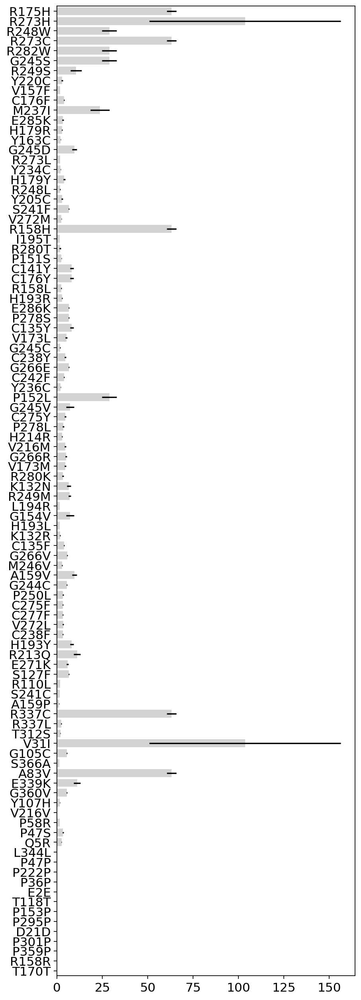

In [183]:
#effect size vs mut freq

#plot impact score vs mutation frequency

mutcount='mut.pred'

#- get the data
score='HotellingT2'
mutdata=pd.DataFrame({mutcount:mutsig.loc[sorted_variants,mutcount],
                     'effect size':anno.loc[sorted_variants,score],
                     'cluster_color':anno.loc[sorted_variants,'cluster_color'],
                     'IARC':mutsig.loc[sorted_variants,'IARC_Mutation_Counts']},
                    index=sorted_variants)
mutdata=mutdata.dropna(subset=['IARC'])
mutdata=mutdata.fillna(0)
mutdata=mutdata.sort_values(by=['IARC','effect size'])
print(mutdata.index)
mut_prediction_data2=mut_prediction_data2.loc[mutdata.index,:]
mut_prediction_data2=mut_prediction_data2.fillna(0)

fig,plots=plt.subplots(1)
fig.set_size_inches(6,20)
plots.barh(mut_prediction_data2.index,mut_prediction_data2['mean'],
           color='lightgray'
          )
plots.errorbar(mut_prediction_data2['mean'], mut_prediction_data2.index,
             xerr=mut_prediction_data2['sd'],
             linestyle='None',#marker='o',
               color='black')
plots.set_ylim(-0.5,mut_prediction_data2.shape[0]-0.5)
plt.grid(False)

In [ ]:
performances['spearman']=pd.DataFrame(performances['spearman'],dtype=float)
performances['pearson']=pd.DataFrame(performances['pearson'],dtype=float)
performances['r2']=pd.DataFrame(performances['r2'],dtype=float)
grouped_performances=performances.groupby('condition').median()
grouped_performances['condition']=list(grouped_performances.index)
grouped_performances.index=range(grouped_performances.shape[0])
pd.set_option('display.max_colwidth', 100)
print(grouped_performances)

In [ ]:
color_dict={}
for m in model_names:
    if 'Mut. +' in m:
        if 'sc-eVIP -' in m:
            co='royalblue'
        if 'sc-eVIP +' in m:
            co='red'
    elif 'Mut. -' in m:
        if 'sc-eVIP -' in m:
            co='lightblue'
        if 'sc-eVIP +' in m:
            co='pink'
    else:
        co='lightgray'
    color_dict[m]=co
    
color_dict['shuffled']='lightgray'

myorder=['shuffled',
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L', 
         'Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L',
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S',  
         'Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S', 
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S',  
         'Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S',  
         
         'Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S',  
         'Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S']
myorder=myorder[::-1]

pairs=[]
comparison='Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S'
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
def pairwise_ttests(df,condition,value):

    pval_m=pd.DataFrame(0.0,index=conditions,columns=conditions)

    for m1 in conditions:
        m1_values=df.loc[df[condition]==m1,value]
        for m2 in conditions:
            m2_values=df.loc[df[condition]==m2,value]

            from scipy.stats import ttest_ind
            res=ttest_ind(m1_values,m2_values,nan_policy='omit')

            pval_m.loc[m1,m2]=res[1]
            pval_m.loc[m2,m1]=pval_m.loc[m1,m2]
            
    #correct for multiple testing
    from statsmodels.stats.multitest import multipletests
    pvals=np.array(pval_m).flatten()
    new_pvals=multipletests(pvals,method='fdr_bh')[1]
    pval_m2=pd.DataFrame(new_pvals.reshape(pval_m.shape),index=pval_m.index,columns=pval_m.columns)
    return(pval_m2)

    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    
    df=pd.DataFrame({'condition':performances['condition'],
                'value':performances[item]})

    condition='condition'
    value='value'
    conditions=set(df[condition])
    pval_m=pairwise_ttests(df,'condition','value')
    print(item,pval_m.loc[myorder,:])
    pvals_anno=[]
    for pair_idx in range(len(pairs)):
        #pvals_anno.append('{:0.2e}'.format(pval_m.loc[pairs[pair_idx][0],pairs[pair_idx][1]]))
        pvals_anno.append(pval_m.loc[pairs[pair_idx][0],pairs[pair_idx][1]])
        
    
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=3)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([-0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)
    g.ax.set_xticklabels(myorder,fontsize=10)
    
    
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                       pvalues=pvals_anno,
                                       perform_stat_test=False,
                                       #text_annot_custom=pvals_anno,
                                   text_format='star',
                                   loc='outside', verbose=2)
    
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_full.'+item+'.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_full.'+item+'.png',bbox_inches = "tight")


In [ ]:
color_dict={}
for m in model_names:
    if 'Mut. +' in m:
        if 'sc-eVIP -' in m:
            co='royalblue'
        if 'sc-eVIP +' in m:
            co='red'
    elif 'Mut. -' in m:
        if 'sc-eVIP -' in m:
            co='lightblue'
        if 'sc-eVIP +' in m:
            co='pink'
    else:
        co='lightgray'
    color_dict[m]=co
    
color_dict['shuffled']='lightgray'

myorder=['shuffled',
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L', 
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S',  
         
         'Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S',    
         
         'Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S']
myorder=myorder[::-1]

pairs=[]
comparison='Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S'
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
def pairwise_ttests(df,condition,value):

    pval_m=pd.DataFrame(0.0,index=conditions,columns=conditions)

    for m1 in conditions:
        m1_values=df.loc[df[condition]==m1,value]
        for m2 in conditions:
            m2_values=df.loc[df[condition]==m2,value]

            from scipy.stats import ttest_ind
            res=ttest_ind(m1_values,m2_values,nan_policy='omit')

            pval_m.loc[m1,m2]=res[1]
            pval_m.loc[m2,m1]=pval_m.loc[m1,m2]
            
    #correct for multiple testing
    from statsmodels.stats.multitest import multipletests
    pvals=np.array(pval_m).flatten()
    new_pvals=multipletests(pvals,method='fdr_bh')[1]
    pval_m2=pd.DataFrame(new_pvals.reshape(pval_m.shape),index=pval_m.index,columns=pval_m.columns)
    return(pval_m2)

    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    
    df=pd.DataFrame({'condition':performances['condition'],
                'value':performances[item]})

    condition='condition'
    value='value'
    conditions=set(df[condition])
    pval_m=pairwise_ttests(df,'condition','value')
    print(item,pval_m.loc[myorder,:])
    pvals_anno=[]
    for pair_idx in range(len(pairs)):
        #pvals_anno.append('{:0.2e}'.format(pval_m.loc[pairs[pair_idx][0],pairs[pair_idx][1]]))
        pvals_anno.append(pval_m.loc[pairs[pair_idx][0],pairs[pair_idx][1]])
        
    
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=3)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([-0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)
    g.ax.set_xticklabels(myorder,fontsize=10)
    
    
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                       pvalues=pvals_anno,
                                       perform_stat_test=False,
                                       #text_annot_custom=pvals_anno,
                                   text_format='star',
                                   loc='outside', verbose=2)
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.'+item+'.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.'+item+'.png',bbox_inches = "tight")

In [22]:
?add_stat_annotation

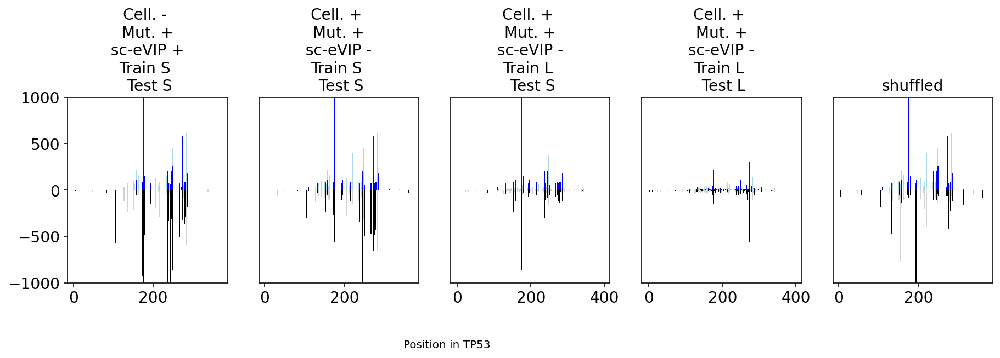

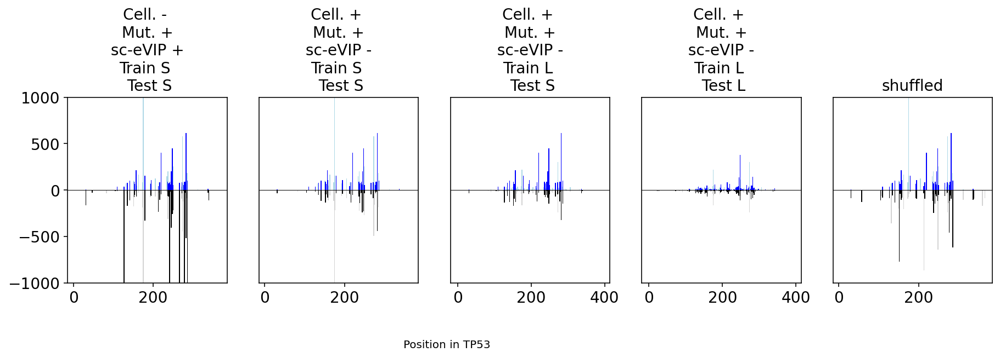

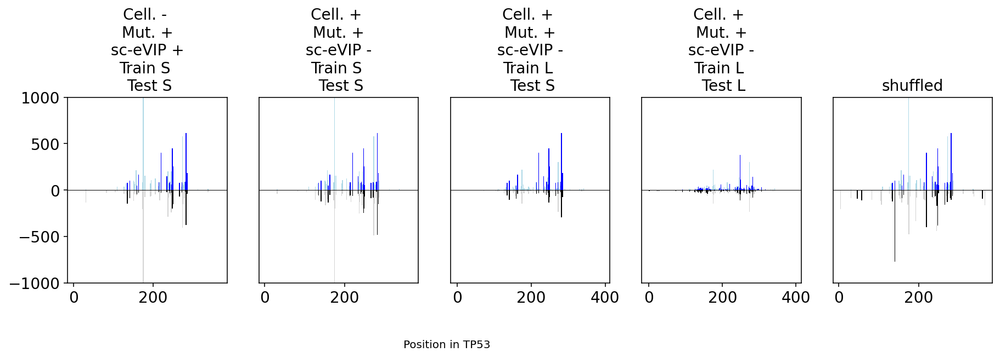

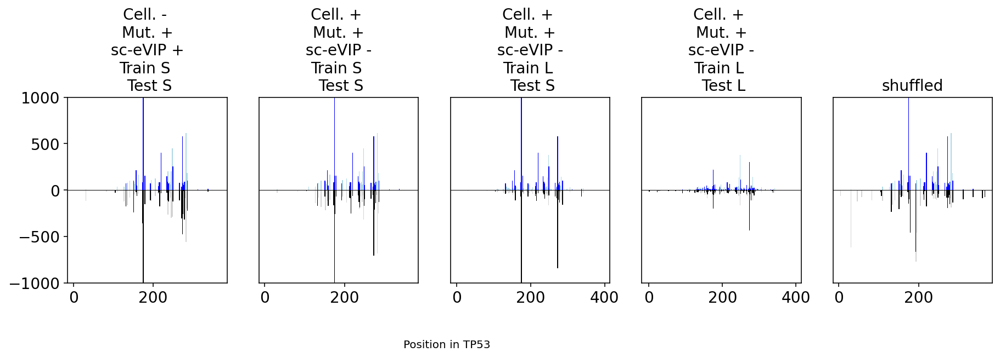

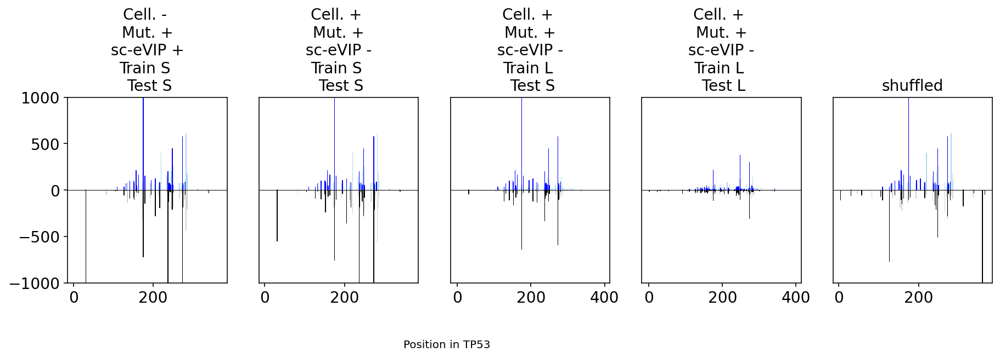

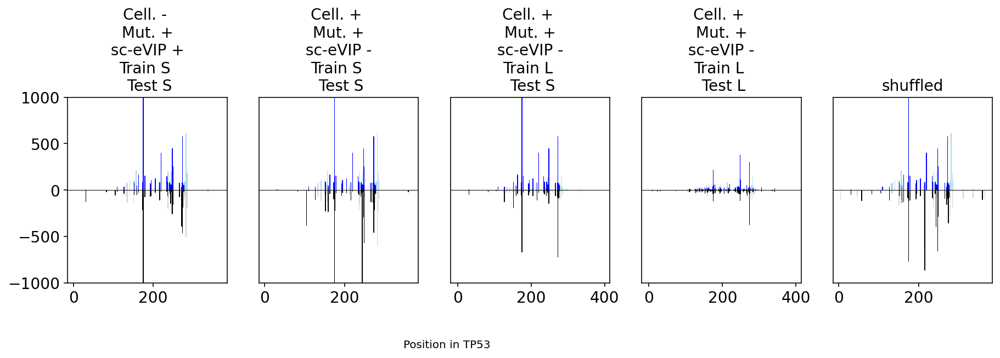

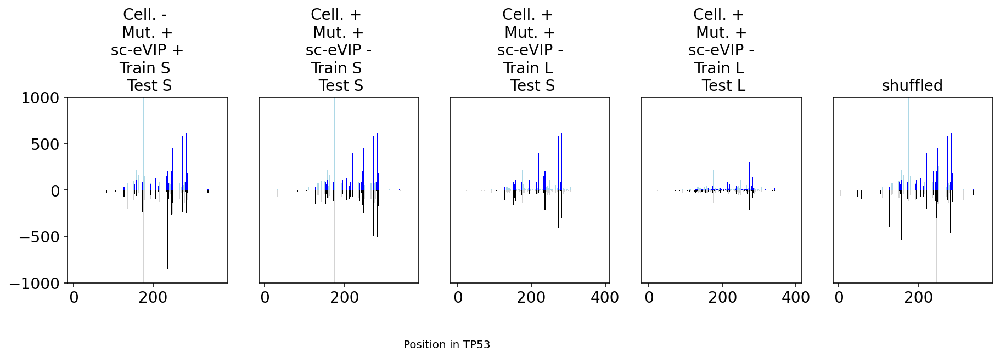

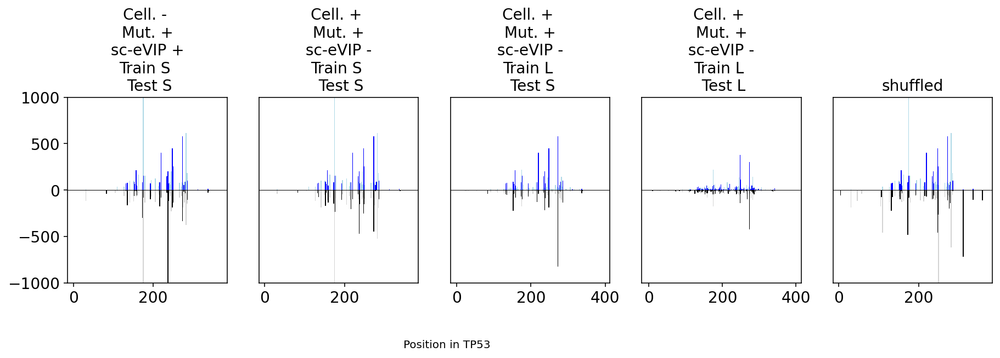

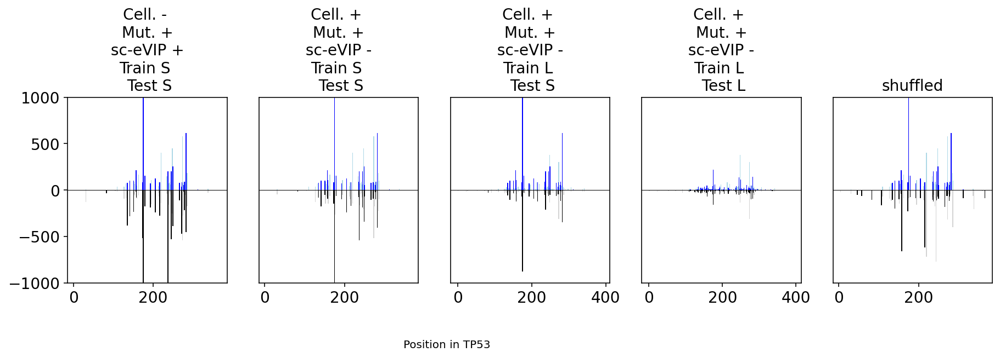

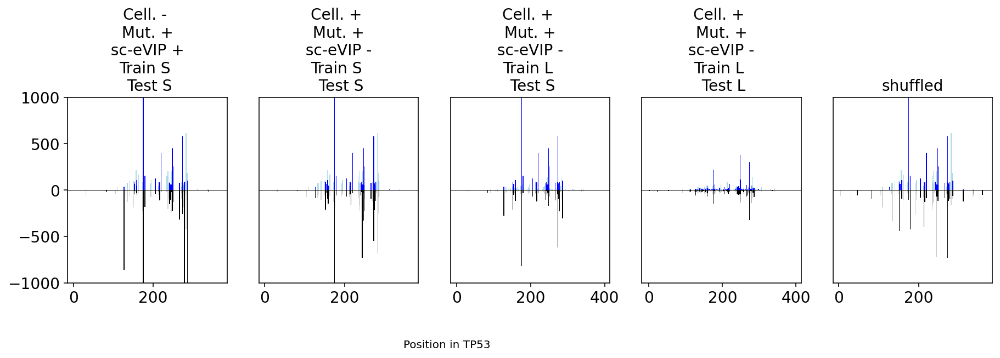

In [23]:
def plot_pos_pred(pred_train,obs_train,pred_valid,obs_valid,data_with_position,ax):
    
    pred_train_pos=avg_by_position(pred_train,data_with_position)
    obs_train_pos=avg_by_position(obs_train,data_with_position)
    pred_valid_pos=avg_by_position(pred_valid,data_with_position)
    obs_valid_pos=avg_by_position(obs_valid,data_with_position)
    
    lw=2
    ax.bar(pred_train_pos.loc[:,'pos'],
           -pred_train_pos.iloc[:,0],color='lightgray',width=lw)
    ax.bar(obs_train_pos.loc[:,'pos'],
           obs_train_pos.iloc[:,0],color='lightblue',width=lw)
    ax.bar(pred_valid_pos.loc[:,'pos'],
           -pred_valid_pos.iloc[:,0],color='black',width=lw)
    ax.bar(obs_valid_pos.loc[:,'pos'],
           obs_valid_pos.iloc[:,0],color='blue',width=lw)
    ax.grid(False)
    ax.axhline(y=0,color='black',linewidth=0.5)


for i in range(10):
    fig_pos,plots_pos=plt.subplots(1,len(myorder))
    x=3
    fig_pos.set_size_inches(len(myorder)*x,x)
    
    for idx in range(len(myorder)):
        model_name=myorder[idx]
        plot_pos_pred(results[i][model_name][0]['pred_train'],
                      results[i][model_name][0]['obs_train'],
                    results[i][model_name][0]['pred_valid'],
                      results[i][model_name][0]['obs_valid'],
                  data,
                    plots_pos[idx])
        if idx!=0:
            plots_pos[idx].set_yticks([])
        plots_pos[idx].set_title(model_name)
        plots_pos[idx].set_ylim(-1000,1000)
    fig_pos.text(0.5, -0.15, 'Position in TP53', ha='center')
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.pos'+str(i)+'.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.pos'+str(i)+'.png',bbox_inches = "tight")
    
    

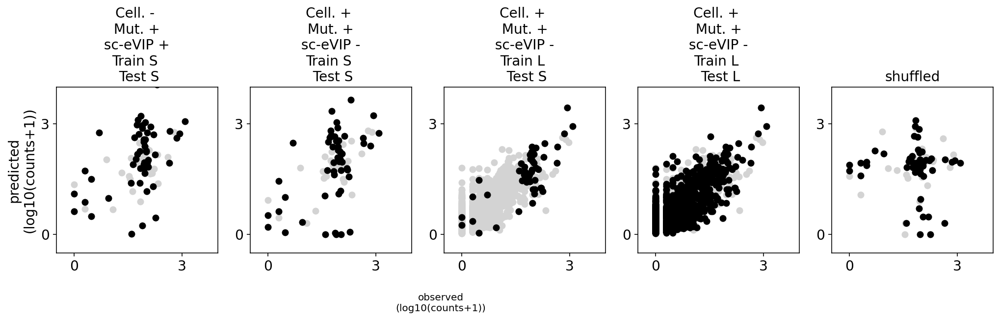

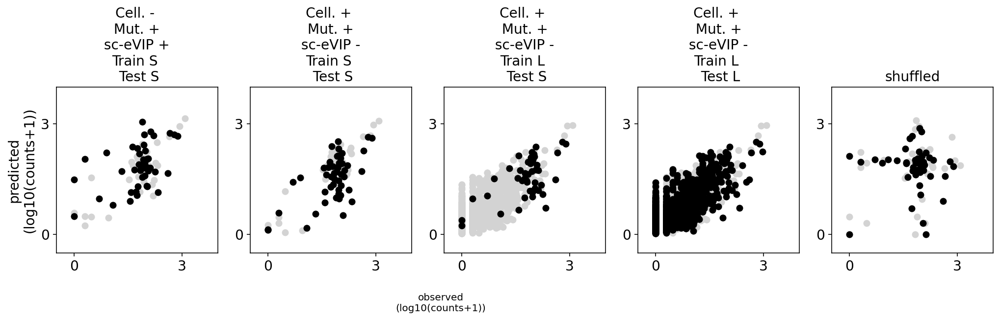

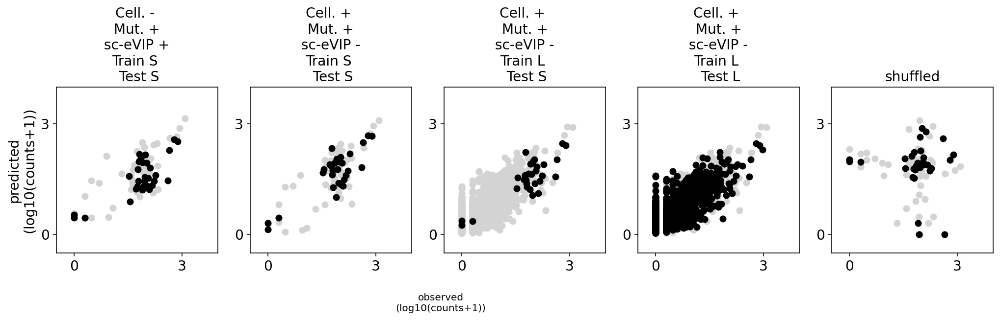

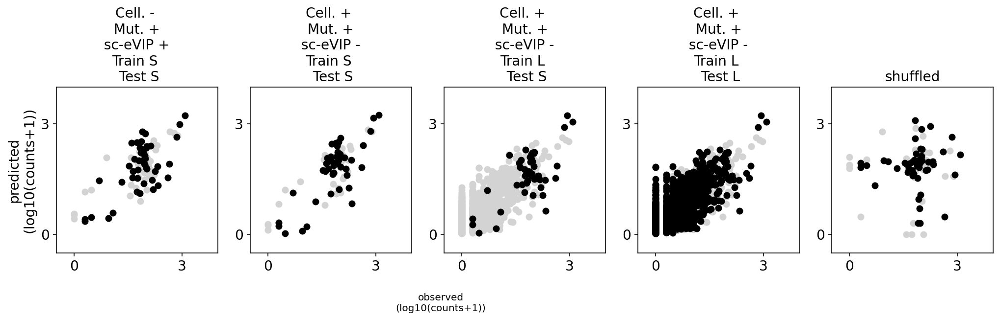

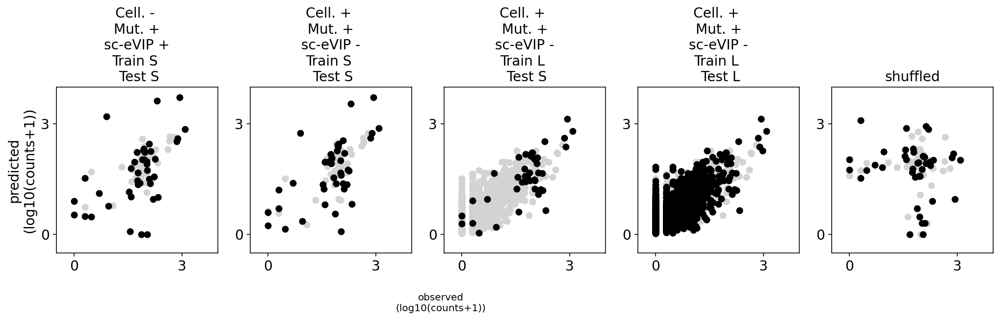

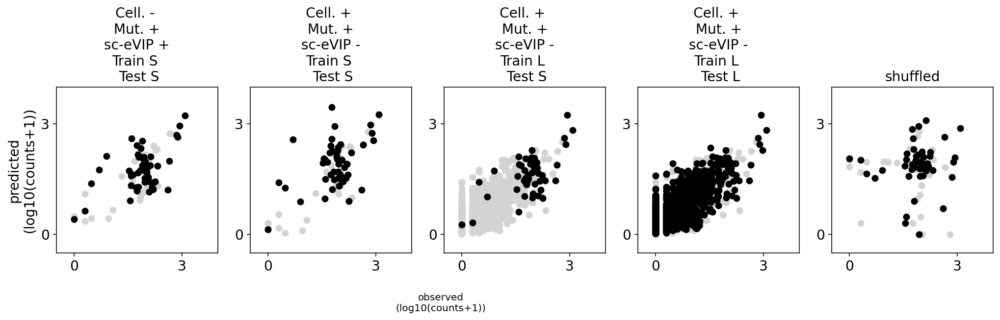

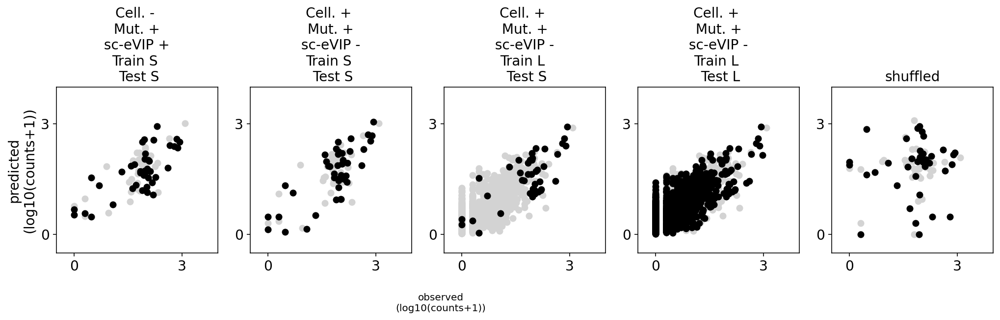

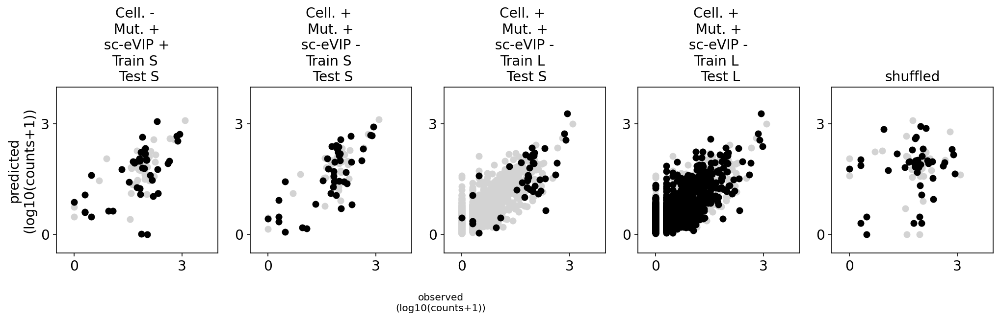

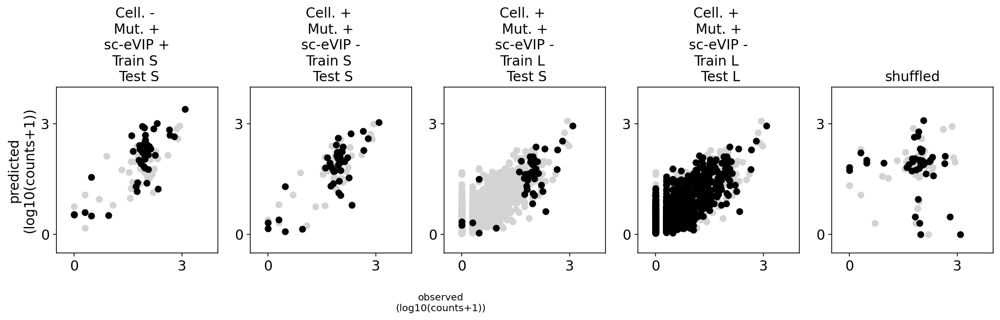

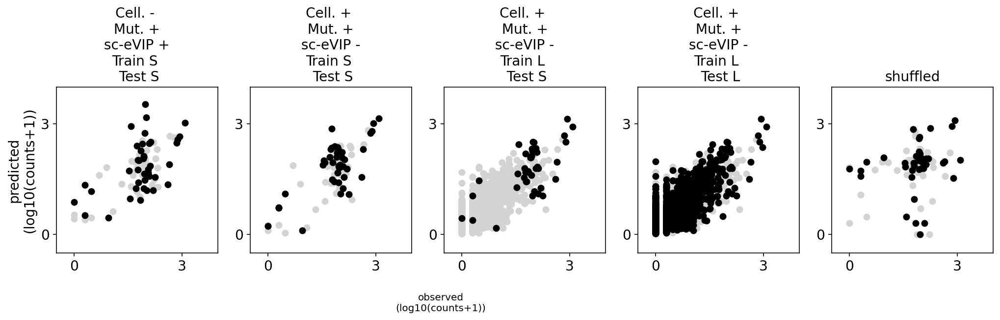

In [24]:
def scatter_pred_obs(pred_train,obs_train,pred_valid,obs_valid,ax,log_it=False):
    
    if not log_it:
        ax.scatter(obs_train,pred_train,color='lightgray')
        ax.scatter(obs_valid,pred_valid,color='black')
    if log_it:
        
        ax.scatter(np.log10(obs_train+1),np.log10(pred_train+1),color='lightgray')
        ax.scatter(np.log10(obs_valid+1),np.log10(pred_valid+1),color='black')

    

for i in range(10):
    fig_scatter,plots_scatter=plt.subplots(1,len(myorder))
    x=3
    fig_scatter.set_size_inches(len(myorder)*x+2,x)
    
    for idx in range(len(myorder)):
        model_name=myorder[idx]
        scatter_pred_obs(results[i][model_name][0]['pred_train'],
                      results[i][model_name][0]['obs_train'],
                    results[i][model_name][0]['pred_valid'],
                      results[i][model_name][0]['obs_valid'],
                    plots_scatter[idx],log_it=True)
        if idx!=0:
            plots_scatter[idx].set_yticks([])
        plots_scatter[idx].set_title(model_name)
        plots_scatter[idx].grid(False)
        if idx==0:
            plots_scatter[idx].set_ylabel('predicted\n(log10(counts+1))')
        
        plots_scatter[idx].set_ylim(-0.5,4)
        plots_scatter[idx].set_xlim(-0.5,4)
        plots_scatter[idx].set_xticks([0,3])
        plots_scatter[idx].set_yticks([0,3])
    fig_scatter.text(0.5, -0.15, 'observed\n(log10(counts+1))', ha='center')
        
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.scatter'+str(i)+'.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.LinModels_subset.scatter'+str(i)+'.png',bbox_inches = "tight")
        

In [25]:
performances['spearman']=pd.DataFrame(performances['spearman'],dtype=float)
performances['pearson']=pd.DataFrame(performances['pearson'],dtype=float)
performances['r2']=pd.DataFrame(performances['r2'],dtype=float)
grouped_performances=performances.groupby('condition').median()
grouped_performances['condition']=list(grouped_performances.index)
grouped_performances.index=range(grouped_performances.shape[0])
pd.set_option('display.max_colwidth', 100)
print(grouped_performances)

    pearson  spearman     r2  \
0     0.740     0.655  0.455   
1     0.710     0.510  0.325   
2     0.725     0.490  0.350   
3     0.665     0.630  0.420   
4     0.680     0.380 -0.435   
5     0.710     0.410  0.210   
6     0.555     0.480  0.105   
7     0.635     0.395  0.160   
8     0.705     0.490  0.320   
9     0.705     0.415  0.215   
10   -0.060     0.105 -1.125   

                                                   condition  
0         Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test L  
1         Cell. + \n Mut. + \n sc-eVIP - \nTrain L \n Test S  
2         Cell. + \n Mut. + \n sc-eVIP - \nTrain S \n Test S  
3         Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test L  
4         Cell. + \n Mut. - \n sc-eVIP - \nTrain L \n Test S  
5         Cell. + \n Mut. - \n sc-eVIP - \nTrain S \n Test S  
6         Cell. - \n Mut. + \n sc-eVIP + \nTrain S \n Test S  
7         Cell. - \n Mut. - \n sc-eVIP + \nTrain S \n Test S  
8   Cell. Nutlin3 \n Mut. + \n sc-eVIP - \nTrain

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var  v.s. Func. assays: - | Mut. sig.: - | Impact score: + 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=nan stat=nan
Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - 
Train: 50 var | Test: 50 var  v.s. Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=nan stat=nan
Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - 
Train: 50 var | Test: 50 var  v.s. Func. assays: - | Mut. sig.: + | Impact score: + 
Train: 50 var | Test: 50 var : t-test independent samples with Bonferroni correction, P_val=nan stat=nan
Func. assays: + | Mut. sig.: - | Impact score: - 
Train: 50 var | Test: 50 var  v.s. Func. assays: - | M

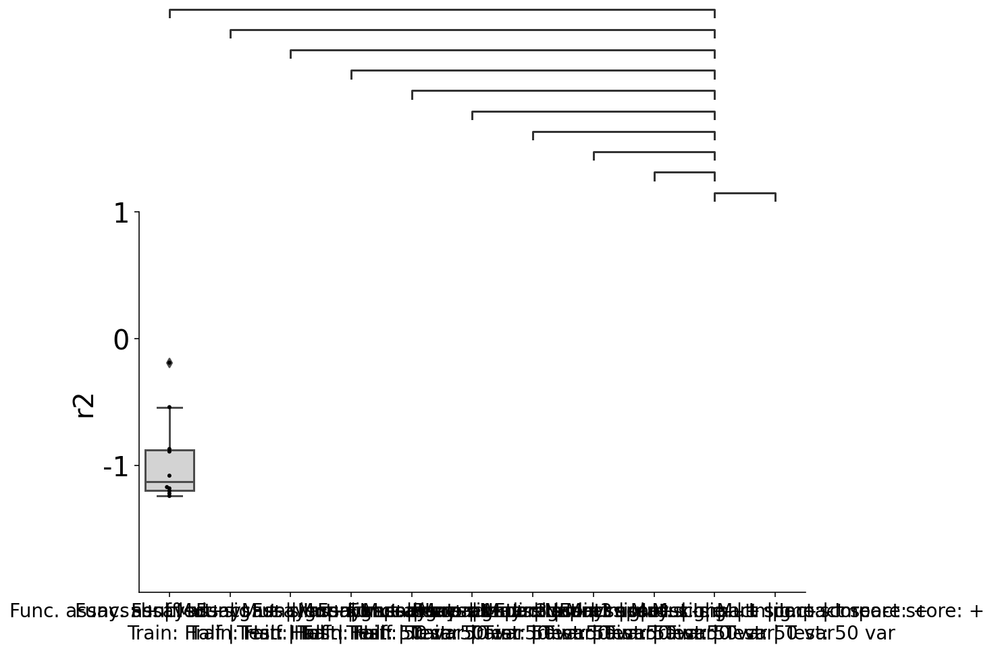

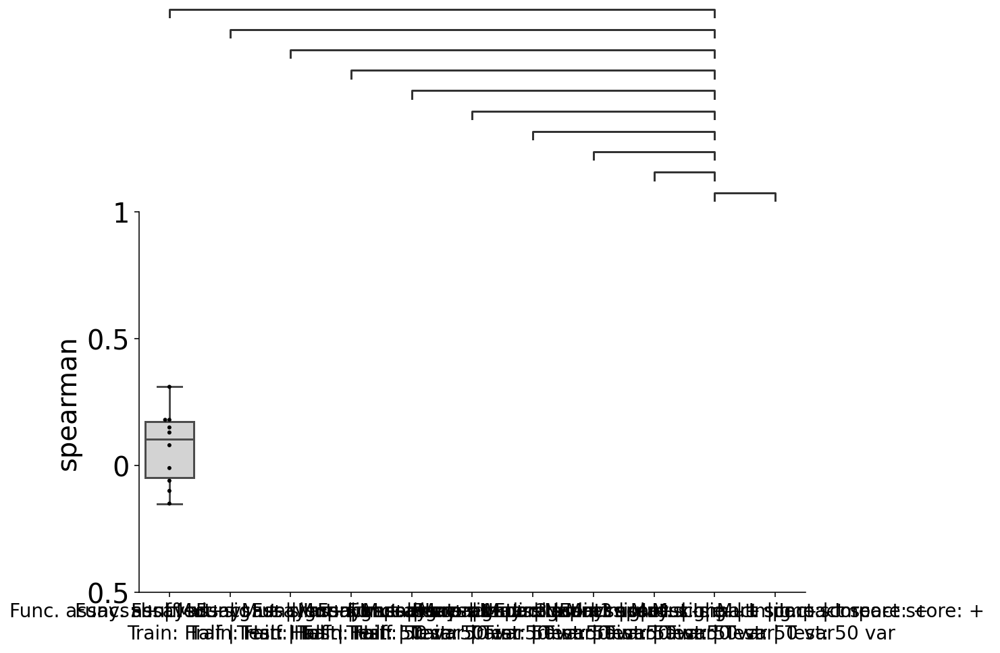

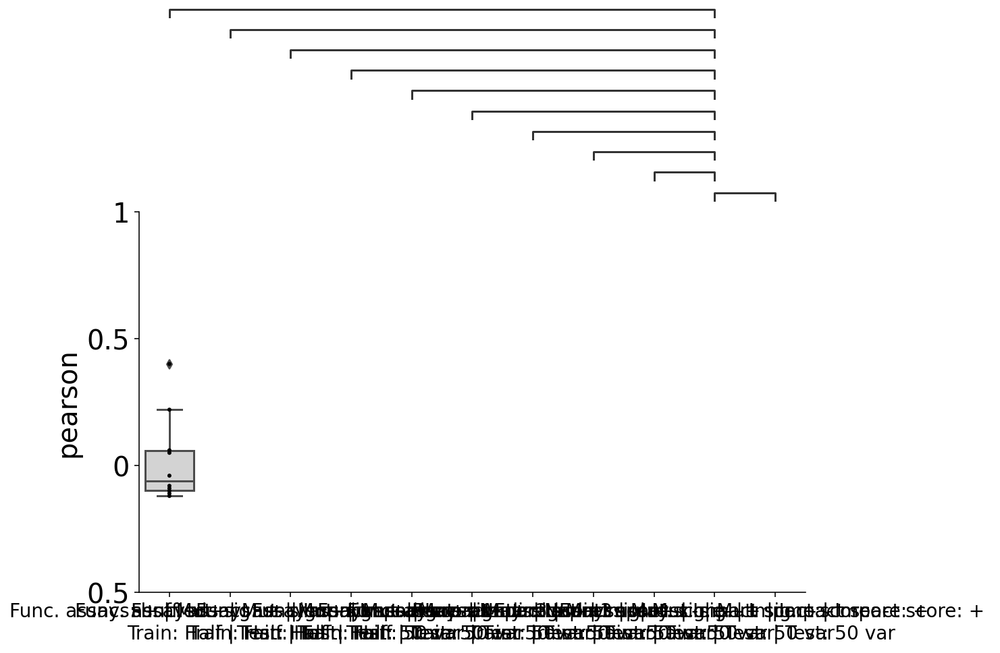

In [26]:
color_dict={'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ':'pink',
    'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ':'red',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ':'royalblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
    'Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
            'Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ':'royalblue',
    'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
           'shuffled':'lightgray'}

myorder=['shuffled','Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ',
         
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ',
         
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ',
         
         'Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ',
         
         'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']
#myorder=myorder[::-1]

pairs=[]
comparison='Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '
for x in color_dict:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    
    if item=='r2':
        g.ax.set_ylim(-2,1)
        g.ax.set_yticks([-1,0,1])
        g.ax.set_yticklabels([-1,0,1],fontsize=20)
        
    else:
        g.ax.set_ylim(-0.5,1)
        g.ax.set_yticks([-0.5,0,0.5,1])
        g.ax.set_yticklabels([0.5,0,0.5,1],fontsize=20)
    #g.ax.set_xticks([])
    g.ax.set_xlabel('')
    g.ax.set_ylabel(item,fontsize=20)
    
    
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', text_format='star',
                                   loc='outside', verbose=2)
    

In [27]:
color_dict={'Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ':'pink',
    'Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ':'red',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ':'royalblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ':'lightblue',
    'Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
            'Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ':'royalblue',
    'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ':'royalblue',
    'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ':'lightblue',
            'Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ':'lightblue',
           'shuffled':'lightgray'}

myorder=['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ',
         'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ',
         'shuffled'
    
]


pairs=[]
comparison='Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var '
for x in myorder:
    if x==comparison:
        continue
    pairs.append((x,comparison))
    
def pairwise_ttests(df,condition,value):

    pval_m=pd.DataFrame(0.0,index=conditions,columns=conditions)

    for m1 in conditions:
        m1_values=df.loc[df[condition]==m1,value]
        for m2 in conditions:
            m2_values=df.loc[df[condition]==m2,value]

            from scipy.stats import ttest_ind
            res=ttest_ind(m1_values,m2_values,nan_policy='omit')

            pval_m.loc[m1,m2]=res[1]
            pval_m.loc[m2,m1]=pval_m.loc[m1,m2]
            
    #correct for multiple testing
    from statsmodels.stats.multitest import multipletests
    pvals=np.array(pval_m).flatten()
    new_pvals=multipletests(pvals,method='fdr_bh')[1]
    pval_m2=pd.DataFrame(new_pvals.reshape(pval_m.shape),index=pval_m.index,columns=pval_m.columns)
    return(pval_m2)


    
    
from statannot import add_stat_annotation
for item in ['r2','spearman','pearson']:
    
    df=pd.DataFrame({'condition':performances['condition'],
                'value':performances[item]})

    condition='condition'
    value='value'
    conditions=set(df[condition])
    pval_m=pairwise_ttests(df,'condition','value')
    pair_values=[]
    for i in range(len(pairs)):
        p1=pairs[i][0]
        p2=pairs[i][1]
        pair_values.append('{:0.2e}'.format(pval_m.loc[p1,p2]))
    
    g = sns.catplot(x="condition", y=item,kind='box',data=performances,palette=color_dict,
                   order=myorder,aspect=2)##aspect=1.3)#4)
                    #order=myorder)#,palette=color_dict)
    sns.swarmplot(x="condition", y=item, color="k", size=3, data=performances, ax=g.ax,order=myorder)
                  #order=myorder);
        
    ax1 = g.axes[0,0]
    ax1.grid(False)
    
    if item=='r2':
        ax1.set_ylim(-2,1)
        print('')
        
    test_results = add_stat_annotation(ax1,
                                       x="condition", y=item,data=performances,order=myorder,
                                   box_pairs=pairs,
                                   test='t-test_ind', #text_format='star',
                                       text_annot_custom=pair_values,
                                   loc='outside', verbose=2)
    
    

    

KeyError: 'Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var '

In [ ]:
pairs

In [ ]:
performances.head()

In [ ]:


#we'll split into train/test here by using positions below/above 200

#define train, validation sets
#==============================
i=0
foldname='fold'+str(i)
data[foldname]=copy.deepcopy(data['Position'])<=200
data[foldname+'not']=(data[foldname]==False)
    
data['train'+foldname]=np.multiply(data['has_effsize'],data[foldname])
data['valid'+foldname]=np.multiply(data['has_effsize'],data[foldname+'not'])
    
model2features={}
model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=list(set(pheno_cols).union(set(signature_cols)))
model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=pheno_cols

model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=list(set(pheno_cols).union(set(signature_cols)))
model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=list(set(pheno_cols).union(set([])))

model2features['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(set(pheno_cols).union(set(signature_cols)))
model2features['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(set(pheno_cols).union(set([])))

model2features['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=list(set(['A549_p53WT_Nutlin-3_Z-score']).union(set(signature_cols)))
model2features['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=['A549_p53WT_Nutlin-3_Z-score']

model2features['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']=list(set(impact_cols).union(set(signature_cols)))
model2features['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']=impact_cols



model2train={}
model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=foldname
model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=foldname

model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=foldname
model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=foldname

model2train['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname
model2train['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname

model2train['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname
model2train['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='train'+foldname

model2train['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']='train'+foldname
model2train['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']='train'+foldname


model2valid={}

model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=foldname+'not'
model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=foldname+'not'

model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']='valid'+foldname

model2valid['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname

model2valid['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']='valid'+foldname

model2valid['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']='valid'+foldname
model2valid['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']='valid'+foldname


model2num={}
model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: Half ']=1
model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: Half ']=2

model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: Half | Test: 50 var ']=3
model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: Half | Test: 50 var ']=4

model2num['Func. assays: + | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=5
model2num['Func. assays: + | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=6

model2num['Func. assays: Nutlin3 | Mut. sig.: + | Impact score: - \nTrain: 50 var | Test: 50 var ']=7
model2num['Func. assays: Nutlin3 | Mut. sig.: - | Impact score: - \nTrain: 50 var | Test: 50 var ']=8

model2num['Func. assays: - | Mut. sig.: + | Impact score: + \nTrain: 50 var | Test: 50 var ']=9
model2num['Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var ']=10




preds=copy.deepcopy(data)                      
for model_name in myorder:#model2features.keys(): 
    if model_name=='shuffled':
        continue

    print('model name',model_name)
    features=model2features[model_name]
    out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)
    print(out[4])    #preds[model_name]=out[0]['dataset'].loc[preds.index,model_name]

    plot_performance(out[0],'',-0.5,4)
    plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(model2num[model_name])+'.pdf',bbox_inches = "tight") 
    plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(model2num[model_name])+'.png',bbox_inches = "tight")
    plt.show()
    
#and the shuffled model
import copy
import random
model_name='Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var '
features=model2features[model_name]
out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)

for item in ['train','valid','all']:
    idx=list(out[0]['obs_'+item].index)
    stuff=copy.deepcopy(list(out[0]['obs_'+item]))
    print(stuff[:3])
    random.shuffle(stuff)
    out[0]['pred_'+item]=pd.DataFrame(stuff,index=idx)
    print(out[0]['pred_'+item].head())
    
plot_performance(out[0],'shuffled',-0.5,4)
plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(8)+'.pdf',bbox_inches = "tight") 
plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(8)+'.png',bbox_inches = "tight")
plt.show()














In [ ]:
preds=copy.deepcopy(data)   
plt.figure(1)
fig2,plots2=plt.subplots(11,1)
fig2.set_size_inches(2,8)
count=0
for model_name in myorder:#model2features.keys(): 
    if model_name=='shuffled':
        continue

    print(model_name)
    features=model2features[model_name]
    out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)
    preds[model_name]=out[0]['dataset'].loc[preds.index,model_name]
    
    #plotting
    preds_here=out[0]
    titlename=''
    mini=-0.5
    maxi=4
    for item in ['train','valid']:
        if item=='train':
            c='black'
        if item=='valid':
            c='blue'
        plots2[count].scatter(np.log10(preds_here['pred_'+item]+1),
            np.log10(preds_here['obs_'+item].loc[preds_here['pred_'+item].index]+1),s=5,color=c,
                          alpha=0.5)

        plots2[count].set_xlim(mini,maxi)
        plots2[count].set_ylim(mini,maxi)        
        plots2[count].set_xticks([])
        
        plots2[count].set_yticks([0,maxi/2,maxi])
        plots2[count].set_yticks([])
        plots2[count].set_ylabel('observed counts\n(log10(counts+1))')
        plots2[count].set_ylabel('')
        plots2[count].grid(False)
        
    plots2[count].set_xticks([0,maxi/2,maxi])
    plots2[count].set_xlabel('predicted counts\n(log10(counts+1))')
    plots2[count].set_title(titlename)
    
    #plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(model2num[model_name])+'.pdf',bbox_inches = "tight") 
    #plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(model2num[model_name])+'.png',bbox_inches = "tight")
    #plt.show()
    count+=1
    
    
#and the shuffled model
import copy
import random
model_name='Func. assays: - | Mut. sig.: - | Impact score: + \nTrain: 50 var | Test: 50 var '
features=model2features[model_name]
out=model_full(data,
                features,
                training_pos_col=model2train[model_name],
                valid_pos_col=model2valid[model_name],
                training_y_name=yname,
                valid_y_name=yname,
              toprint=model_name)

for item in ['train','valid','all']:
    idx=list(out[0]['obs_'+item].index)
    stuff=copy.deepcopy(list(out[0]['obs_'+item]))
    print(stuff[:3])
    random.shuffle(stuff)
    out[0]['pred_'+item]=pd.DataFrame(stuff,index=idx)
    print(out[0]['pred_'+item].head())
    
#plot_performance(out[0],plots[10],'shuffled',-0.5,4)
#plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(11)+'.pdf',bbox_inches = "tight") 
#plt.savefig(FIGS+'/'+PROTEIN+'.performance.model'+str(11)+'.png',bbox_inches = "tight")
plt.show()